# EDA for Football Data from Transfermarkt
- Kaggle Data URL

    - https://www.kaggle.com/datasets/davidcariboo/player-scores

## 1. 데이터 설명


- `csv` 파일 설명
    - `transfermarkt` 데이터와 `understat` 데이터를 합친 데이터
    - 선수 몸값 및 세부 스탯 포함


## 2. 데이터 불러오기

In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set_style("ticks")
import matplotlib.ticker as ticker
from matplotlib.ticker import MultipleLocator

from mplsoccer import Radar, FontManager, grid, Bumpy
from highlight_text import fig_text

import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

from datetime import datetime
from datetime import timedelta
import missingno as msno

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler

from scipy import stats

import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

import warnings
warnings.filterwarnings(action='ignore')

pd.set_option("display.max_columns", None)

plt.rc('font', family='Noto Sans')
# plt.rc('font', family='D2Coding')
plt.rcParams['axes.unicode_minus'] = False

In [2]:
import plotly.io as pio

pio.renderers.default = "svg"

In [3]:
# 데이터 경로
path = "data/df_merged_total.csv"
df = pd.read_csv(path)

In [4]:
df.head()

,player_name_preprocessed,start_season,yellow_cards_preprocessed,red_cards_preprocessed,goals,assists,minutes_played,total_apps,competition_code,is_major_national_league,date_of_birth,position_preprocessed,current_club_name,highest_market_value,market_value_per_season,country,foot,height_in_cm,player_name_normalized,original_player_name,first_name_preprocessed,last_name_preprocessed,id,player_name_league,games,time,goals_season,xG_season,assists_season,xA_season,shots_season,key_passes_season,yellow_cards_league,red_cards_league,position_league,team_title,npg_season,npxG_season,xGChain,xGBuildup,first_name_league,last_name_league
0,Aarón Martín,2019.0,2.0,0.0,0.0,0.0,1795.0,22.0,bundesliga,True,1997-04-22,Left-Back,Genoa CFC,20000000.0,10500000.0,Spain,left,178.0,Aaron Martin,Aarón Martín,Aaron,Martin,5133.0,Aarón Martín,22.0,1804.0,0.0,0.294448,0.0,3.250888,9.0,32.0,2.0,0.0,D M S,Mainz 05,0.0,0.294448,3.658402,2.195273,Aaron,Martin
1,Abdelhamid Sabiri,2019.0,6.0,0.0,4.0,1.0,1035.0,24.0,bundesliga,True,1996-11-28,Attacking Midfield,ACF Fiorentina,4000000.0,1700000.0,Morocco,right,186.0,Abdelhamid Sabiri,Abdelhamid Sabiri,Abdelhamid,Sabiri,6296.0,Abdelhamid Sabiri,24.0,1028.0,4.0,3.468877,1.0,0.232751,43.0,7.0,6.0,0.0,M S,Paderborn,3.0,2.711101,1.644770,0.885899,Abdelhamid,Sabiri
2,Achraf Hakimi,2019.0,5.0,0.0,5.0,10.0,2717.0,33.0,bundesliga,True,1998-11-04,Right-Back,Paris Saint-Germain,70000000.0,54000000.0,Morocco,right,181.0,Achraf Hakimi,Achraf Hakimi,Achraf,Hakimi,5197.0,Achraf Hakimi,33.0,2709.0,5.0,5.067438,10.0,5.510969,38.0,36.0,5.0,0.0,D M S,Borussia Dortmund,5.0,5.067438,24.144373,16.293885,Achraf,Hakimi
3,Adam Bodzek,2019.0,10.0,0.0,0.0,0.0,2018.0,28.0,bundesliga,True,1985-09-07,Defensive Midfield,Fortuna Düsseldorf,1750000.0,325000.0,Poland,right,184.0,Adam Bodzek,Adam Bodzek,Adam,Bodzek,7140.0,Adam Bodzek,28.0,2023.0,0.0,0.697913,0.0,0.270701,9.0,8.0,10.0,0.0,M S,Fortuna Duesseldorf,0.0,0.697913,2.535295,1.791962,Adam,Bodzek
4,Ademola Lookman,2019.0,0.0,0.0,0.0,0.0,300.0,11.0,bundesliga,True,1997-10-20,Second Striker,Atalanta BC,40000000.0,13500000.0,Nigeria,right,174.0,Ademola Lookman,Ademola Lookman,Ademola,Lookman,5556.0,Ademola Lookman,11.0,281.0,0.0,1.185320,0.0,0.983638,11.0,7.0,0.0,0.0,F S,RasenBallsport Leipzig,0.0,1.185320,3.107864,1.041527,Ademola,Lookman


In [5]:
# 데이터프레임에서 사용할 컬럼들만 필터링
cols = ['player_name_preprocessed', 'start_season', 'yellow_cards_preprocessed',
       'red_cards_preprocessed', 'goals', 'assists', 'minutes_played',
       'total_apps', 'competition_code', 'date_of_birth', 'position_preprocessed', 'team_title',
    #    'current_club_name',
       'highest_market_value', 'market_value_per_season', 'country', 'foot',
       'height_in_cm', 'xG_season', 'xA_season', 'shots_season', 'key_passes_season',
       'npg_season', 'npxG_season', 'xGChain', 'xGBuildup']
df = df[cols]

# 컬럼명 변경
df.rename(columns={"player_name_preprocessed" : "player_name",
                   'yellow_cards_preprocessed' : "yellow_cards",
                   "red_cards_preprocessed" : "red_cards",
                   "position_preprocessed" : "position",
                   "xG_season" : "xG",
                   "xA_season" : "xA",
                   "shots_season" : "shots",
                   "key_passes_season" : "key_passes",
                   "npg_season" : "npG",
                   "npxG_season" : "npxG"}, 
                   inplace= True)

In [6]:
df.head(3)

,player_name,start_season,yellow_cards,red_cards,goals,assists,minutes_played,total_apps,competition_code,date_of_birth,position,team_title,highest_market_value,market_value_per_season,country,foot,height_in_cm,xG,xA,shots,key_passes,npG,npxG,xGChain,xGBuildup
0,Aarón Martín,2019.0,2.0,0.0,0.0,0.0,1795.0,22.0,bundesliga,1997-04-22,Left-Back,Mainz 05,20000000.0,10500000.0,Spain,left,178.0,0.294448,3.250888,9.0,32.0,0.0,0.294448,3.658402,2.195273
1,Abdelhamid Sabiri,2019.0,6.0,0.0,4.0,1.0,1035.0,24.0,bundesliga,1996-11-28,Attacking Midfield,Paderborn,4000000.0,1700000.0,Morocco,right,186.0,3.468877,0.232751,43.0,7.0,3.0,2.711101,1.644770,0.885899
2,Achraf Hakimi,2019.0,5.0,0.0,5.0,10.0,2717.0,33.0,bundesliga,1998-11-04,Right-Back,Borussia Dortmund,70000000.0,54000000.0,Morocco,right,181.0,5.067438,5.510969,38.0,36.0,5.0,5.067438,24.144373,16.293885


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11460 entries, 0 to 11459
Data columns (total 25 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   player_name              11460 non-null  object 
 1   start_season             11460 non-null  float64
 2   yellow_cards             11460 non-null  float64
 3   red_cards                11460 non-null  float64
 4   goals                    11460 non-null  float64
 5   assists                  11460 non-null  float64
 6   minutes_played           11460 non-null  float64
 7   total_apps               11460 non-null  float64
 8   competition_code         11460 non-null  object 
 9   date_of_birth            11460 non-null  object 
 10  position                 11460 non-null  object 
 11  team_title               11460 non-null  object 
 12  highest_market_value     11460 non-null  float64
 13  market_value_per_season  11460 non-null  float64
 14  country               

In [8]:
# date_of_birth 컬럼 타입 datetime으로 변경
df["date_of_birth"] = pd.to_datetime(df["date_of_birth"], format='%Y-%m-%d')

In [9]:
# 시즌별 만 나이 구하는 함수 생성
def calculate_age(born_col, season_col, final_date_string="2024-05-31"):
     
    final_date = datetime.strptime(final_date_string, "%Y-%m-%d")
    # today = datetime.today()
    
    # 생일이 지나지 않았다면 현재 연도 - 태어난 연도 - 1년 더 빼준다
    age = final_date.year - born_col.year - ((final_date.month, final_date.day) < (born_col.month, born_col.day))
    # return age, season_col

    # 23-24 시즌
    if season_col == (final_date.year-1):
        return age
    # 22-23 시즌
    elif season_col == (final_date.year-2):
        return age-1
    # 21-22 시즌
    elif season_col == (final_date.year-3):
        return age-2
    # 20-21 시즌
    elif season_col == (final_date.year-4):
        return age-3
    # 19-20 시즌
    else :
        return age-4
    

In [10]:
# 시즌별 만 나이 구하는 함수 적용
df["age"] = df.apply(lambda row : calculate_age(row["date_of_birth"], row["start_season"]), axis=1)

In [11]:
# start_season 컬럼 타입 object로 변경
df["start_season"] = df["start_season"].astype(int).astype(str)

In [12]:
# 결측치 확인
df.isnull().sum()

player_name                0
start_season               0
yellow_cards               0
red_cards                  0
goals                      0
assists                    0
minutes_played             0
total_apps                 0
competition_code           0
date_of_birth              0
position                   0
team_title                 0
highest_market_value       0
market_value_per_season    0
country                    0
foot                       0
height_in_cm               0
xG                         0
xA                         0
shots                      0
key_passes                 0
npG                        0
npxG                       0
xGChain                    0
xGBuildup                  0
age                        0
dtype: int64

In [13]:
# 900분 (10 경기) 이상을 소화한 선수만 필터링
df = df[df["minutes_played"]>=900]

In [14]:
df.shape

(6950, 26)

In [15]:
# 중복값 확인
df[df.duplicated(subset=["player_name", "age", "position", "team_title"], keep=False)].sort_values(by="player_name").head(20)

,player_name,start_season,yellow_cards,red_cards,goals,assists,minutes_played,total_apps,competition_code,date_of_birth,position,team_title,highest_market_value,market_value_per_season,country,foot,height_in_cm,xG,xA,shots,key_passes,npG,npxG,xGChain,xGBuildup,age


In [16]:
# 합계를 계산할 컬럼들과 평균을 계산할 컬럼들을 정의
columns_to_sum = ['yellow_cards', 'red_cards', 'goals', 'assists', 'minutes_played', "total_apps",
                  'xG', 'xA', 'shots', 'key_passes', 'npG', 'npxG', 'xGChain', 'xGBuildup']
# columns_to_average = []

# 중복된 값을 확인하기 위해 키 컬럼들로 그룹화
grouped_df = df.groupby(['player_name', 'start_season', 'age', 'team_title'])

# 필요한 컬럼들을 합산하고 나머지 컬럼들은 평균을 계산
df_no_duplicate = grouped_df.agg({
    **{col: 'sum' for col in columns_to_sum},  # 필요한 컬럼들을 합산
    # **{col: lambda x: x.sum() / 2 for col in columns_to_average},  # 나머지 컬럼들은 합계 후 2로 나누어 평균 계산
    # 범주형 컬럼은 첫 번째 값을 유지
    'competition_code': 'first',
    'position' : 'first',
    'height_in_cm' : 'first',
    'highest_market_value' : 'first', 
    'market_value_per_season' : 'first'
}).reset_index()


In [17]:
df_no_duplicate.head(3)

,player_name,start_season,age,team_title,yellow_cards,red_cards,goals,assists,minutes_played,total_apps,xG,xA,shots,key_passes,npG,npxG,xGChain,xGBuildup,competition_code,position,height_in_cm,highest_market_value,market_value_per_season
0,Aaron Connolly,2019,20,Brighton,0.0,0.0,3.0,2.0,1261.0,24.0,4.553528,0.562017,36.0,6.0,3.0,4.553528,4.356781,0.354199,premier-league,Centre-Forward,174.0,7000000.0,4000000.0
1,Aaron Cresswell,2019,30,West Ham,7.0,0.0,3.0,0.0,2730.0,31.0,1.032539,3.006656,18.0,26.0,3.0,1.032539,6.834942,4.891464,premier-league,Left-Back,170.0,12000000.0,6500000.0
2,Aaron Cresswell,2020,31,West Ham,3.0,0.0,0.0,8.0,3172.0,36.0,0.883464,7.390940,19.0,58.0,0.0,0.883464,10.620283,8.392439,premier-league,Left-Back,170.0,12000000.0,5000000.0


In [18]:
# df[df["player_name"]=="Gabriel Magalhães"]
# # df[df["player_name"]=="Koke"]
# # df[df["current_club_name"]=="Arsenal FC"].tail(50)


In [19]:
# # df_no_duplicate.sort_values(by="total_apps", ascending=False)
# df_no_duplicate.sort_values(by="shots", ascending=False).head(20)

In [20]:
# 중복 제거한 데이터프레임
df_no_duplicate.shape

(6950, 23)

### 2-1. `.describe()` 확인

In [21]:
df_no_duplicate.describe()

,age,yellow_cards,red_cards,goals,assists,minutes_played,total_apps,xG,xA,shots,key_passes,npG,npxG,xGChain,xGBuildup,height_in_cm,highest_market_value,market_value_per_season
count,6950.000000,6950.000000,6950.000000,6950.000000,6950.000000,6950.000000,6950.000000,6950.000000,6950.000000,6950.000000,6950.000000,6950.000000,6950.000000,6950.000000,6950.000000,6950.000000,6.950000e+03,6.950000e+03
mean,26.968345,3.974676,0.095683,2.745036,2.137122,1976.019712,27.396115,2.864362,2.053542,24.476547,18.544604,2.469353,2.605114,8.102262,4.963251,182.895827,2.475993e+07,1.506084e+07
std,4.053198,2.760543,0.315880,3.960232,2.544985,668.644642,6.499881,3.764905,2.143524,22.679646,16.781839,3.460880,3.289380,5.621378,3.507569,6.603773,2.663598e+07,1.895161e+07
min,16.000000,0.000000,0.000000,0.000000,0.000000,900.000000,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,162.000000,3.000000e+05,1.000000e+05
25%,24.000000,2.000000,0.000000,0.000000,0.000000,1405.250000,23.000000,0.551098,0.509974,8.000000,6.000000,0.000000,0.541566,4.118195,2.488509,178.000000,7.000000e+06,3.200000e+06
50%,27.000000,4.000000,0.000000,1.000000,1.000000,1931.000000,28.000000,1.484134,1.437155,18.000000,15.000000,1.000000,1.427367,6.716620,4.070858,183.000000,1.600000e+07,8.000000e+06
75%,30.000000,6.000000,0.000000,4.000000,3.000000,2510.750000,33.000000,3.656827,2.886593,35.000000,26.000000,3.000000,3.367747,10.615899,6.477594,188.000000,3.500000e+07,2.000000e+07
max,43.000000,17.000000,3.000000,41.000000,22.000000,3420.000000,38.000000,37.924069,20.620713,208.000000,133.000000,33.000000,34.135185,41.541005,28.058833,202.000000,2.000000e+08,1.800000e+08


In [22]:
df_no_duplicate.describe(include="object")

,player_name,start_season,team_title,competition_code,position
count,6950,6950,6950,6950,6950
unique,2927,5,133,5,13
top,Nico González,2022,Chelsea,premier-league,Centre-Back
freq,6,1484,89,1588,1451


### 2-2. 분포 확인

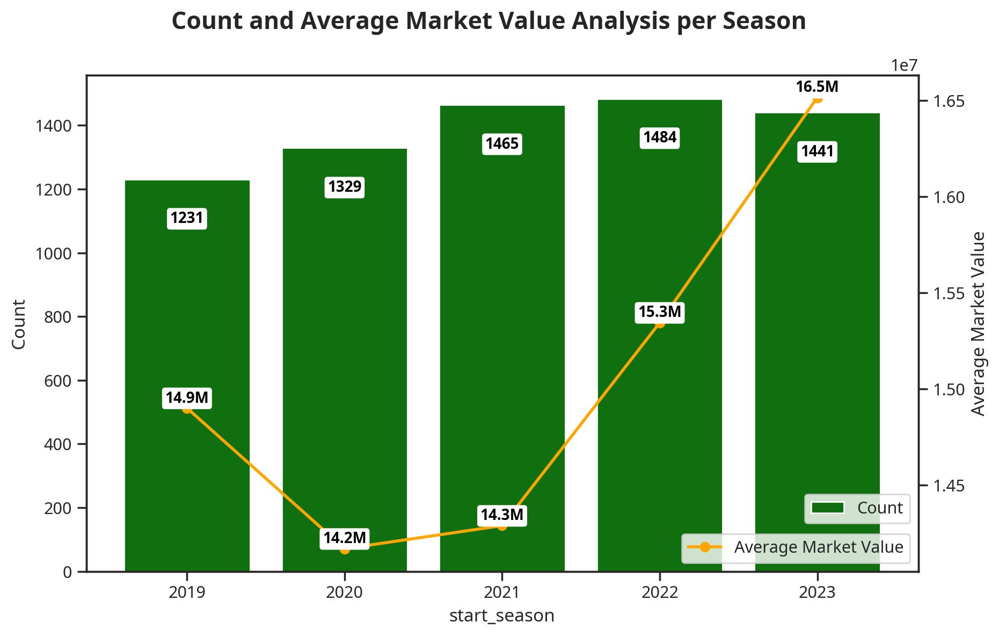

In [23]:
# start_season별 평균 몸값 계산
average_value_per_season = df_no_duplicate.groupby('start_season')['market_value_per_season'].mean()

# 기본 figure 설정
fig, ax1 = plt.subplots(figsize=(10, 6))

# 큰 제목 추가
plt.suptitle('Count and Average Market Value Analysis per Season', fontsize=16, fontweight='bold')

# 첫 번째 y축: countplot 생성 (hue를 제거하고 label 추가)
countplot = sns.countplot(data=df_no_duplicate, x="start_season", ax=ax1, color='green', label='Count')
ax1.set_ylabel('Count')
# ax1.set_title('Count and Average Market Value per Start Season')

# 각 countplot 막대에 값 표시 (밑으로 조금 내리기)
for p in countplot.patches:
    height = p.get_height()
    ax1.text(p.get_x() + p.get_width() / 2., height - 100, int(height), 
             ha='center', va='top', fontsize=10, fontweight='bold', color='black', 
             bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.2'))

# 두 번째 y축 설정
ax2 = ax1.twinx()
lineplot, = ax2.plot(average_value_per_season.index, average_value_per_season.values, 
                     marker='o', color='orange', linewidth=2, label='Average Market Value')
ax2.set_ylabel('Average Market Value')

# 각 lineplot에 값 표시 (위로 올리기)
for i, value in enumerate(average_value_per_season.values):
    ax2.text(average_value_per_season.index[i], value + 10000, f'{round(value/1000000, 1)}M', 
             color='black', ha='center', va='bottom', fontsize=10, fontweight='bold', 
             bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.2'))

# 범례 추가
ax1.legend(loc='lower right', bbox_to_anchor=(1, 0.08))
ax2.legend(loc='lower right')

# 그래프 보여주기
plt.show()


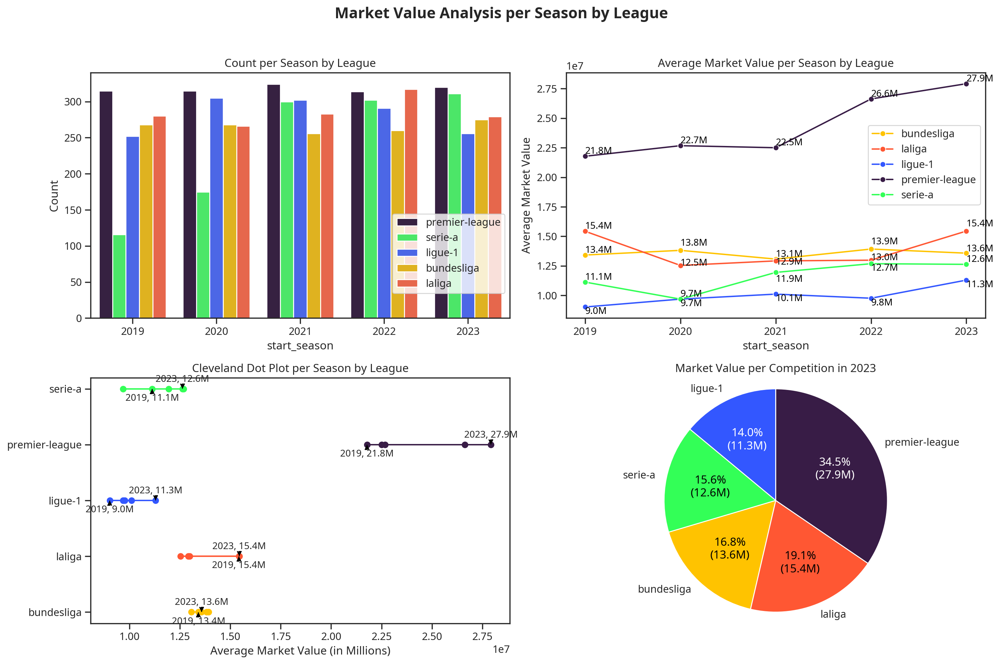

In [24]:
# 2x2 서브플롯으로 4개의 플롯을 표시하는 코드에 Cleveland dot plot 내용 추가

# 공통 색상 팔레트 정의
palette = {
    'laliga': '#FF5733',       # 밝은 주황색
    'bundesliga': '#FFC300',      # 황금색
    'premier-league': '#381C46', # 선명한 보라색
    'serie-a': '#33FF57',      # 밝은 초록색
    'ligue-1': '#3357FF',      # 선명한 파랑색
}

def autopct_with_values(pct, allvalues):
    absolute = int(pct / 100. * sum(allvalues))
    return f"{pct:.1f}%\n({absolute / 1000000:.1f}M)"

# figure 설정 (2x2 subplots)
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 10))
fig.suptitle('Market Value Analysis per Season by League', fontsize=16, fontweight='bold')

# 첫 번째 plot: countplot
sns.countplot(data=df_no_duplicate, x="start_season", hue="competition_code", palette=palette, ax=axes[0, 0])
axes[0, 0].set_ylabel('Count')
axes[0, 0].set_title('Count per Season by League')

average_value_per_season = df_no_duplicate.groupby(['start_season', 'competition_code'])['market_value_per_season'].mean().reset_index()
# competition_code를 카테고리로 변환하여 순서대로 숫자 할당
average_value_per_season['competition_code_numeric'] = average_value_per_season['competition_code'].astype('category').cat.codes


# 두 번째 plot: lineplot (평균 몸값)
sns.lineplot(data=average_value_per_season, x="start_season", y="market_value_per_season", hue="competition_code", marker='o', palette=palette, ax=axes[0, 1])

# 데이터 포인트에 값 표시 (값이 가까울 때 위치 조정)
for i in range(average_value_per_season.shape[0]):
    start_season = average_value_per_season.loc[i, 'start_season']
    market_value = average_value_per_season.loc[i, 'market_value_per_season']
    competition = average_value_per_season.loc[i, 'competition_code']
    
    # 특정 조건에 따라 위치 조정
    verticalalignment = 'bottom'
    offset = 0
    if start_season in ["2020"]:
        if competition == 'serie-a':
            offset = -800000 
        elif competition == 'ligue-1':
            offset = 800000  
            
    if start_season in ["2020", "2022"]:
        if competition == 'bundesliga':
            offset = 200000  # Bundesliga 값을 위로 올림
        elif competition == 'laliga':
            offset = -200000  # LaLiga 값을 아래로 내림
    
    if (start_season == "2021"):
        if ((competition == "laliga")):
            offset = -500000
        elif (competition == "serie-a"): 
            offset = -1000000

    if ((start_season == "2022") & (competition == "serie-a")) | (competition == "ligue-1"):
        verticalalignment = 'top'

    if (start_season == "2023"):
        if (competition == "laliga"):
            offset = 200000
        elif (competition == "bundesliga"):
            offset = -50000

    adjusted_y = market_value + offset

    axes[0, 1].text(x=start_season, 
                    y=adjusted_y, 
                    s=f'{round(market_value / 1000000, 1)}M', 
                    color='black', 
                    fontsize=10, 
                    verticalalignment=verticalalignment)

axes[0, 1].set_ylabel('Average Market Value')
axes[0, 1].set_title('Average Market Value per Season by League')

# 세 번째 plot: Cleveland dot plot
for competition in average_value_per_season['competition_code'].unique():
    subset = average_value_per_season[average_value_per_season['competition_code'] == competition]
    axes[1, 0].plot(subset['market_value_per_season'], subset['competition_code_numeric'], 'o-', label=competition, color=palette[competition])
    # 연도별로 각 점에 레이블을 표시 (start_season)
    for i in range(subset.shape[0]):

        season_value = None
        y_offset = 0  # 기본 y_offset은 0으로 설정

        if i in [0, 4]:
            season_value = f"{subset['start_season'].iloc[i]}, {round(subset['market_value_per_season'].iloc[i] / 1000000, 1)}M"
            y_offset = -0.17 if i == 0 else 0.17  # 데이터 포인트 위/아래로 조정

        # 데이터 포인트와 텍스트를 연결하는 선 그리기
        axes[1, 0].annotate(
            season_value,
            xy=(subset['market_value_per_season'].iloc[i], subset['competition_code_numeric'].iloc[i]),
            xytext=(subset['market_value_per_season'].iloc[i], subset['competition_code_numeric'].iloc[i] + y_offset),
            fontsize=10,
            ha='center',
            va='center',
            arrowprops=dict(arrowstyle='-|>', color='black', lw=1, linestyle='--')
        )        

        
axes[1, 0].set_yticks(average_value_per_season['competition_code_numeric'].unique())
axes[1, 0].set_yticklabels(average_value_per_season['competition_code'].unique())
axes[1, 0].set_xlabel('Average Market Value (in Millions)')
axes[1, 0].set_title('Cleveland Dot Plot per Season by League')

# 네 번째 plot: pie chart
data_2023_sorted = average_value_per_season[average_value_per_season['start_season'] == "2023"].sort_values(by='market_value_per_season', ascending=True)
colors = [palette[comp] for comp in data_2023_sorted['competition_code']]
wedges, texts, autotexts = axes[1, 1].pie(data_2023_sorted['market_value_per_season'], 
               labels=data_2023_sorted['competition_code'], 
               autopct=lambda pct: autopct_with_values(pct, data_2023_sorted['market_value_per_season']), 
               startangle=90, 
               colors=colors)

# 글자 위치를 중심에서 바깥쪽으로 조정
# autotexts[0].set_position((1.35 * autotexts[0].get_position()[0], 1.35 * autotexts[0].get_position()[1]))


# premier-league에 해당하는 텍스트만 흰색으로 설정
for i, text in enumerate(autotexts):
    if data_2023_sorted['competition_code'].iloc[i] in ['premier-league', 'ligue-1']:
        text.set_color('white')  # 흰색으로 설정
    else:
        text.set_color('black')  # 나머지는 검은색


axes[1, 1].set_title('Market Value per Competition in 2023')
axes[1, 1].axis('equal')


# 범례 위치 조정
axes[0, 0].legend(loc='lower right', bbox_to_anchor=(1, 0.08))
axes[0, 1].legend(loc='lower right', bbox_to_anchor=(1, 0.44))

# 레이아웃 조정
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

## 3. 이상치 확인
- `boxplot` 그려서 확인

In [25]:
# num_cols = df_no_duplicate.select_dtypes(include="number").columns.drop("last_season").tolist()
num_cols = df_no_duplicate.select_dtypes(include="number").columns.tolist()

print(num_cols)
print(len(num_cols))

['age', 'yellow_cards', 'red_cards', 'goals', 'assists', 'minutes_played', 'total_apps', 'xG', 'xA', 'shots', 'key_passes', 'npG', 'npxG', 'xGChain', 'xGBuildup', 'height_in_cm', 'highest_market_value', 'market_value_per_season']
18


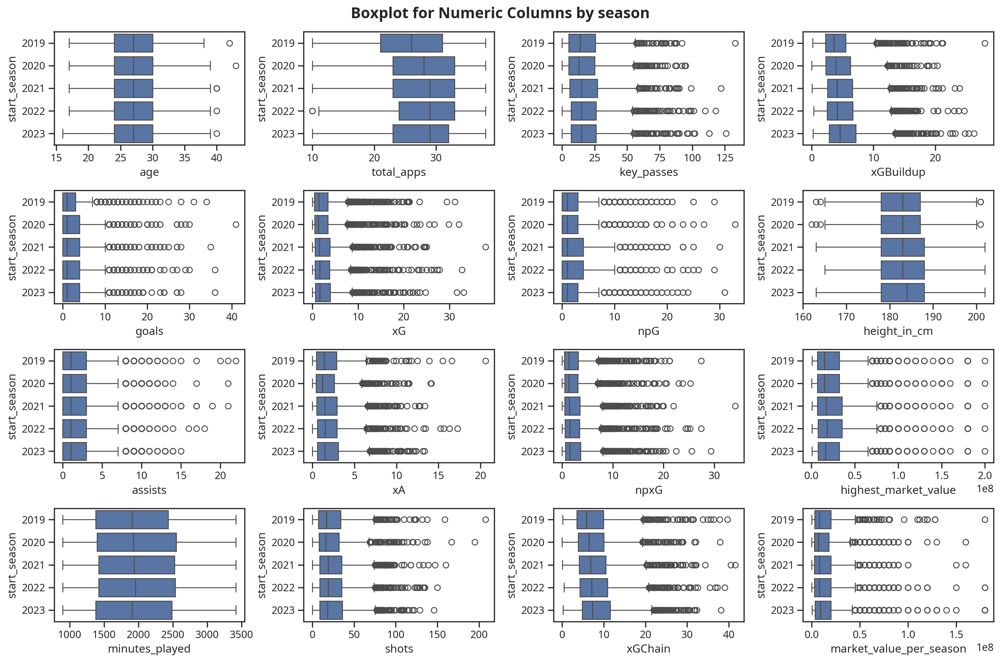

In [26]:
# num_cols에서 yellow_cards, red_cards 제거한 것 num_cols2에 선언
del num_cols[1:3]

# subplot 생성
nrows, ncols = 4, 4
fig, axes = plt.subplots(nrows, ncols, figsize=(15, 10))

# flatten()을 통해 axes를 1차원 array로 펴줘야 한다
axes = axes.T.flatten()

for col, ax in zip(num_cols, axes):
    sns.boxplot(data=df_no_duplicate, x=col, ax=ax, y="start_season")
    # sns.stripplot(data=df_no_duplicate, x=col, ax=ax, y="last_season", hue="foot")

plt.suptitle("Boxplot for Numeric Columns by season", fontsize=16, fontweight='bold')

fig.tight_layout()
plt.show()

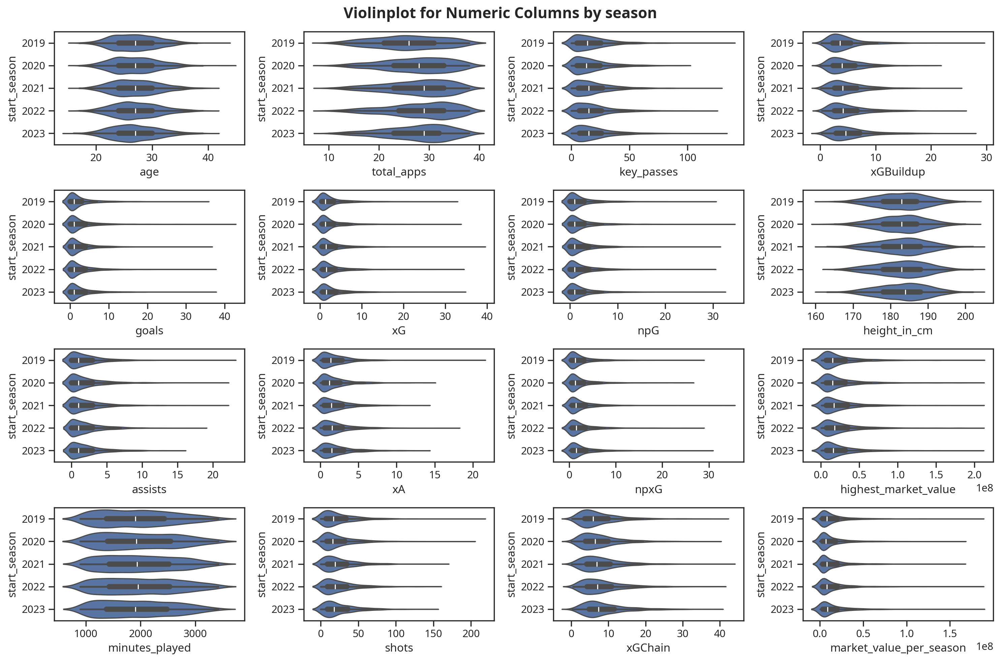

In [27]:
# subplot 생성
nrows, ncols = 4, 4
fig, axes = plt.subplots(nrows, ncols, figsize=(15, 10))

# flatten()을 통해 axes를 1차원 array로 펴줘야 한다
axes = axes.T.flatten()

for col, ax in zip(num_cols, axes):
    sns.violinplot(data=df_no_duplicate, x=col, ax=ax, y="start_season")
    # sns.stripplot(data=df_no_duplicate, x=col, ax=ax, y="last_season", hue="foot")

plt.suptitle("Violinplot for Numeric Columns by season", fontsize=16, fontweight='bold')

fig.tight_layout()
plt.show()

### 이상치 확인 결과
- 전반적으로 `start_season`에 따라 비슷한 결과

- `goals`, `assists`, `market_value` 등 다양한 곳에서 이상치 존재
    - 그러나 축구라는 스포츠의 특성 상, 득점, 도움, 시장 가치 등 몇몇의 특출난 선수들의 스탯이 도드라지게 나타난다
- 결론 : 이상치 따로 처리하지 않음

## 4. 상관관계 확인

In [28]:
num_cols = df.select_dtypes(include="number").columns.tolist()
df_corr = round(df[num_cols].corr(), 2)

df_corr.style.background_gradient()

,yellow_cards,red_cards,goals,assists,minutes_played,total_apps,highest_market_value,market_value_per_season,height_in_cm,xG,xA,shots,key_passes,npG,npxG,xGChain,xGBuildup,age
yellow_cards,1.000000,0.050000,-0.020000,0.020000,0.300000,0.260000,-0.010000,0.020000,-0.040000,-0.020000,0.040000,0.060000,0.100000,-0.030000,-0.030000,0.100000,0.230000,0.020000
red_cards,0.050000,1.000000,-0.030000,-0.020000,0.030000,0.000000,-0.030000,-0.030000,0.010000,-0.030000,-0.030000,-0.030000,-0.030000,-0.030000,-0.040000,-0.020000,0.020000,0.050000
goals,-0.020000,-0.030000,1.000000,0.500000,0.190000,0.300000,0.430000,0.440000,-0.090000,0.930000,0.540000,0.850000,0.480000,0.980000,0.910000,0.680000,0.120000,-0.020000
assists,0.020000,-0.020000,0.500000,1.000000,0.210000,0.310000,0.400000,0.400000,-0.290000,0.510000,0.850000,0.610000,0.780000,0.500000,0.510000,0.690000,0.360000,-0.050000
minutes_played,0.300000,0.030000,0.190000,0.210000,1.000000,0.800000,0.150000,0.220000,0.120000,0.180000,0.240000,0.240000,0.270000,0.180000,0.170000,0.390000,0.450000,0.100000
total_apps,0.260000,0.000000,0.300000,0.310000,0.800000,1.000000,0.150000,0.190000,-0.060000,0.310000,0.360000,0.400000,0.400000,0.300000,0.310000,0.470000,0.390000,0.020000
highest_market_value,-0.010000,-0.030000,0.430000,0.400000,0.150000,0.150000,1.000000,0.860000,-0.050000,0.430000,0.430000,0.420000,0.360000,0.440000,0.440000,0.620000,0.490000,-0.140000
market_value_per_season,0.020000,-0.030000,0.440000,0.400000,0.220000,0.190000,0.860000,1.000000,-0.030000,0.430000,0.420000,0.430000,0.360000,0.450000,0.440000,0.630000,0.500000,-0.300000
height_in_cm,-0.040000,0.010000,-0.090000,-0.290000,0.120000,-0.060000,-0.050000,-0.030000,1.000000,-0.080000,-0.350000,-0.190000,-0.410000,-0.090000,-0.070000,-0.200000,-0.090000,0.030000
xG,-0.020000,-0.030000,0.930000,0.510000,0.180000,0.310000,0.430000,0.430000,-0.080000,1.000000,0.540000,0.890000,0.470000,0.900000,0.980000,0.710000,0.100000,-0.020000


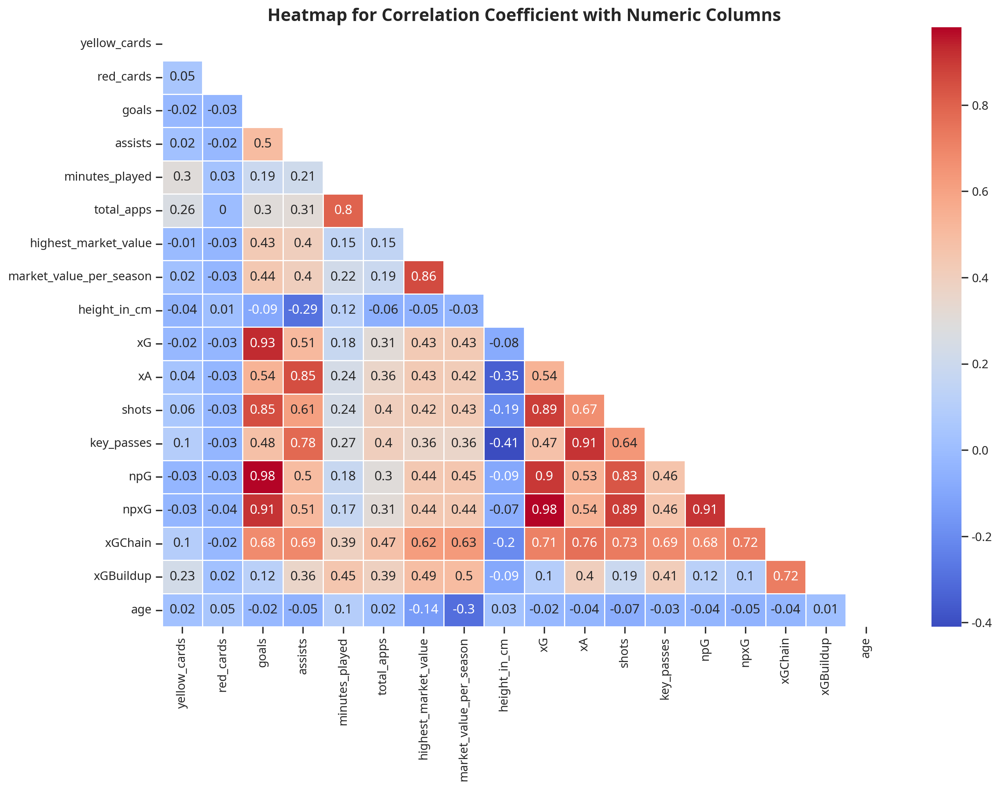

In [29]:
plt.figure(figsize=(15,10))

# 삼각형 마스크를 만든다(위 쪽 삼각형에 True, 아래 삼각형에 False)
mask = np.zeros_like(df_corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(df_corr,
            annot=True,         # 실제 값을 표시한다
            mask=mask,          # 표시하지 않을 마스크 부분을 지정한다
            linewidths=.5,      # 경계면 실선으로 구분하기
            cmap='coolwarm')

plt.title("Heatmap for Correlation Coefficient with Numeric Columns", fontsize=16, fontweight='bold')
plt.show()

### 4-1. 상관관계 결과
- 매우 강한 상관관계 (0.8 이상)
    - `npG` - `goals`
    - `xG` - `npxG`
    - `xG`- `goals`
    - `xA` - `key_passes`
    - `npxG` - `goals`
    - `goals` - `shots`
    - `xG` - `shots`
    - `shots` - `npxG`
    - `shots` - `npG`
    - `npG` - `npxG`
    - `assists` - `xA`
    - `minutes_played` - `total_apps`
    - `highest_market_value` - `market_value_per_season`
- 강한 상관관계 (0.6 ~ 0.8)
    - `assists` - `key_passes`
    - `xG` - `xGChain`
    - `xA` - `xGChain`
    - `shots` - `xGChain`
    - `key_passes` - `xGChaing`
    - `npxG` - `xGChain`
    - `xGChain` - `xGBuildup`
    - `assists` - `xGChain`
    - `goals` - `xGChain`
    - `market_value_per_season` - `xGChain`
    - `highest_market_value` - `xGChain`
    - `shots` - `key_passes`
    - `xA`- `shots`
- 음의 상관관계 (-0.2 ~ -0.4)
    - `key_passes` - `height_in_cm`
    - `xA` - `height_in_cm`
    - `assists` - `height_in_cm`
    - `age` - `market_value_per_season`

### 4-2. 상관관계 높은 변수들 분포 확인
- 상관관계가 높은 변수 관계 8가지 분포 시각화해본다

    - 매우 강한 상관관계 (0.8 이상)
        - `npg` - `goals`
        - `xG` - `npxG`
        - `xG`- `goals`
        - `xA` - `key_passes`
        - `npxG` - `goals`
        - `goals` - `shots`
        - `xG` - `shots`
        - `shots` - `npxG`

In [30]:
# 상관관계 높은 변수들끼리 짝지워 high_corr에 선언
high_corr = [("xG", "npxG"),
             ("npG", "goals"), 
             ("xG", "goals"), 
             ("xA", "key_passes"),
             ("npxG", "goals"),
             ("xG", "shots"),
             ("shots", "npxG"),
             ("goals", "shots"),
             ]
high_corr

[('xG', 'npxG'),
 ('npG', 'goals'),
 ('xG', 'goals'),
 ('xA', 'key_passes'),
 ('npxG', 'goals'),
 ('xG', 'shots'),
 ('shots', 'npxG'),
 ('goals', 'shots')]

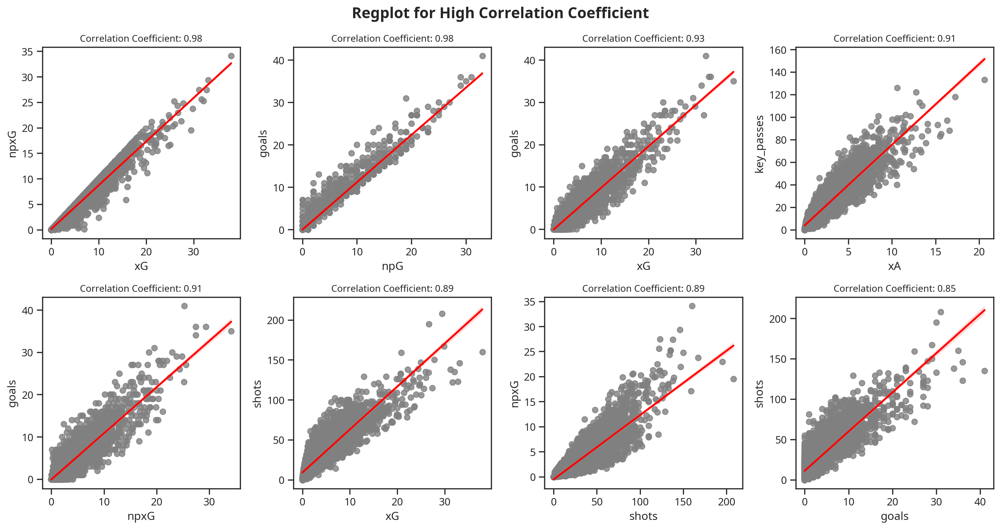

In [31]:
# 상관관계 분포 시각화
# subplot 생성
nrows, ncols = 2, 4
fig, axes = plt.subplots(nrows, ncols, figsize=(15, 8))

# flatten()을 통해 axes를 1차원 array로 펴준다
axes = axes.flatten()

# regplot 그려서 추세선과 상관관계 확인
for (x_var, y_var), ax in zip(high_corr, axes):
    sns.regplot(x=df[x_var],
                y=df[y_var],
                ax=ax,
                scatter_kws={"color": "gray"},
                line_kws={"color": "red", "lw": 2})
    
    # 상관계수 계산
    corr, _ = stats.pearsonr(df[x_var], df[y_var])
    
    # 서브플롯 제목에 상관계수 추가
    ax.set_title(f'Correlation Coefficient: {corr:.2f}', fontsize=10)

# 전체 제목 설정
plt.suptitle('Regplot for High Correlation Coefficient', fontsize=16, fontweight='bold')

# 레이아웃 조정
# plt.tight_layout(rect=[0, 0, 1, 0.95])  # suptitle과 겹치지 않게 조정
plt.tight_layout()
plt.show()


## 5. 다중 공선성
- 하나의 독립 변수가 여러개의 독립 변수들로 잘 예측되는 경우를 의미한다
- 독립 변수들이 서로 독립이 아니라, 상호 상관관계가 강한 경우 발생
- 일반적으로 어떤 독립 변수의 영향력을 파악할 때, 확인하려는 변수의 영향력만을 판단하기 위해 다른 독립 변수들은 모두 일정하다고 가정한다.
- 그러나 만약 두 독립 변수가 서로에게 영향을 주고 있다면, 하나의 영향력을 검증할 때 다른 하나의 영향력을 완전히 통제할 수 없게 된다
    - 이러한 상황에서는 도출된 해석이 타당하다고 볼 수 없다
    
- 다중 공선성이 존재한다면 모델 구축 시 발생하는 상황
    - 계수 추정이 잘 되지 않거나, 불안정해져서 데이터가 약간만 바뀌어도 추정치 크게 달라짐
    - 계수가 통계적으로 유의미하지 않은 것처럼 도출
    - 과적합의 위험성
    - 특히 회귀 분석에 큰 영향 미친다 (분류는 영향 크게 미칠때도 있고 별로 상관 없을 때도 있음)
- References
    - https://dacon.io/codeshare/4443
    - https://datascienceschool.net/03%20machine%20learning/06.04%20%EB%8B%A4%EC%A4%91%EA%B3%B5%EC%84%A0%EC%84%B1%EA%B3%BC%20%EB%B3%80%EC%88%98%20%EC%84%A0%ED%83%9D.html
    - https://dacon.io/forum/408387

### 5-1. 다중 공선성 진단
- 분산팽창계수 (VIF, Variance Inflation Factor)를 구한다
- 일반적으로 5 또는 10보다 크면 다중 공선성이 있다고 판단한다

- VIF : 독립변수를 다른 독립변수로 선형회귀한 성능을 나타낸 지표
    - 다른 변수에 의존적일 수록 VIF가 증가

In [32]:
# 출처 : https://aliencoder.tistory.com/17

def feature_engineering_XbyVIF(df):
    # NaN 값이 있는 경우 처리
    if df.isnull().values.any():
        raise ValueError("데이터프레임에 NaN 값이 포함되어 있습니다. NaN 값을 처리해 주세요.")
    
    # 스케일링 (RobustScaler 사용)
    scaler = RobustScaler()
    df_scaled = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

    vif = pd.DataFrame()
    vif['VIF_Factor'] = [variance_inflation_factor(df_scaled.values, i) for i in range(df_scaled.shape[1])]
    vif['Feature'] = df.columns
    
    return vif

### 5-2. 다중 공선성 해결 방법
- 다중 공선성을 갖는 독립 변수 중 하나 혹은 일부를 제거한다
    - 단 회귀 모형의 R-square 값을 유지 또는 개선시키는 방향으로만 수행해야 한다
- 변수를 변형시키거나 새로운 관측치를 이용한다
- 자료를 수집하는 현장의 상황을 보아 상관관계의 이유를 파악하여 해결한다
- 주성분 분석 (Principle Component Analysis, PCA)을 이용한 diagonal matrix의 형태로 공선성을 없애준다

- References
    - https://aliencoder.tistory.com/17

In [33]:
# 유사한 의미를 가진 컬럼 제거한 후 다중공선성 확인
# total_apps - minutes_played 유사
# highest_market_value - market_value_per_season 유사
# npg - goals 유사
# npxG - xG 유사

# 일단 total_apps, highest_market_value, xG 제거한 데이터프레임 다중 공선성 확인해본다
feature_engineering_XbyVIF(df[['yellow_cards', 'red_cards', 'goals', 'assists', 'minutes_played',
                              'height_in_cm', 'npG', 'npxG', 'xA', 'shots',
                              'key_passes', 'xGChain', 'xGBuildup', 'age']])

,VIF_Factor,Feature
0,1.168927,yellow_cards
1,1.078561,red_cards
2,28.077779,goals
3,4.201441,assists
4,1.479281,minutes_played
5,1.367004,height_in_cm
6,28.756009,npG
7,19.910571,npxG
8,12.606009,xA
9,8.083050,shots


### 5-3. 다중 공선성 결론
- VIF가 크더라도 분석에 꼭 필요한 Feature라면 살리는 것이 좋다
    - `goals`, `npg`, `npxG`, `xA`, `shots`, `key_passes`, `xGChain`, `xGBuildup` 등은 축구선수를 평가할 때 중요한 스탯
    - 일단 모델 생성해본 후, R-square 값을 개선시키는 방향으로 다중 공선성 다시 확인해 본다
- references
    - https://recipesds.tistory.com/entry/%EC%9C%A0%EC%9D%98%ED%95%98%EC%A7%80-%EC%95%8A%EC%9D%80-%EA%B3%84%EC%88%98%EB%A5%BC-%EC%96%B4%EC%A9%90%EB%8B%A4-%EA%B1%8D-%EB%B2%84%EB%A6%B4%EA%B9%8C-%EB%8B%A4%EC%A4%91%EA%B3%B5%EC%84%A0%EC%84%B1%EC%9D%80-%EC%95%85%EB%8B%B9%EC%9D%BC%EA%B9%8C-%EC%83%81%EA%B4%80%EC%9D%B4%EB%82%98-VIF%EB%86%92%EC%9C%BC%EB%A9%B4-%EB%8B%A4-%EC%97%86%EC%95%A8%EA%B9%8C
        

In [34]:
#  total_apps, highest_market_value, xG 제거한 데이터프레임을 df에 선언
df = df.drop(["total_apps", "highest_market_value", "xG"], axis=1)
df.head(3)

,player_name,start_season,yellow_cards,red_cards,goals,assists,minutes_played,competition_code,date_of_birth,position,team_title,market_value_per_season,country,foot,height_in_cm,xA,shots,key_passes,npG,npxG,xGChain,xGBuildup,age
0,Aarón Martín,2019,2.0,0.0,0.0,0.0,1795.0,bundesliga,1997-04-22,Left-Back,Mainz 05,10500000.0,Spain,left,178.0,3.250888,9.0,32.0,0.0,0.294448,3.658402,2.195273,23
1,Abdelhamid Sabiri,2019,6.0,0.0,4.0,1.0,1035.0,bundesliga,1996-11-28,Attacking Midfield,Paderborn,1700000.0,Morocco,right,186.0,0.232751,43.0,7.0,3.0,2.711101,1.644770,0.885899,23
2,Achraf Hakimi,2019,5.0,0.0,5.0,10.0,2717.0,bundesliga,1998-11-04,Right-Back,Borussia Dortmund,54000000.0,Morocco,right,181.0,5.510969,38.0,36.0,5.0,5.067438,24.144373,16.293885,21


## 6. 파생 변수 생성

In [35]:
df_copy = df.copy()

# yellow card, red card 컬럼을 합쳐서 aggression 컬럼 생성
# yellow card를 2번 받으면 red card와 같기 때문에, 가중치 0.3, 0.7 각각 곱해준다
df_copy["aggression"] = (df_copy["yellow_cards"] * 0.3) + (df_copy["red_cards"] * 0.7)

# minutes_played를 90으로 나누어, 90분으로 환산했을 때 몇 경기 뛰었는지 확인해본다
# df_copy["90s"] = round(df_copy["minutes_played"] / 90, 1)
# df_copy.drop(columns=["yellow_cards", "red_cards", "minutes_played"], inplace=True)

In [36]:
# def divide_cols(df, col_list, denominator, denominator_name):
#     # '90s' 값이 0인 경우를 NaN으로 대체해 나눗셈 시 inf가 발생하지 않도록 처리
#     for col in col_list:
#         col_name = f"{col}_{denominator_name}"
#         df[col_name] = np.where(df["90s"] == 0, np.nan, round(df[col] / df[denominator], 2))

#     df = df.fillna(0)
#     return df

In [37]:
# 총합 통계를 출전 시간으로 나눠 90을 곱한 통계인 90분 당 통계를 구한다
def calculate_per_90(df, column_list, denominator):

    for column in column_list:
        # 각 column의 90분 당 통계 열을 새로 생성
        new_column_name = f"{column}_90"
        df[new_column_name] = df.apply(lambda row: (row[column] / row[denominator]) * 90 
                                       if row[denominator] > 0 else 0, axis=1)
    return df

In [38]:
# "goals", "assists", "aggression", "xG", "xA", "shots", "key_passes", "xGChain", "xGBuildup"을 90분당 몇개 기록했는지 확인
df_copy = calculate_per_90(df_copy, 
                           ["goals", "assists", "aggression", "npG", "npxG", "xA", "shots", "key_passes", "xGChain", "xGBuildup"], 
                           "minutes_played")
df_copy.head(3)

,player_name,start_season,yellow_cards,red_cards,goals,assists,minutes_played,competition_code,date_of_birth,position,team_title,market_value_per_season,country,foot,height_in_cm,xA,shots,key_passes,npG,npxG,xGChain,xGBuildup,age,aggression,goals_90,assists_90,aggression_90,npG_90,npxG_90,xA_90,shots_90,key_passes_90,xGChain_90,xGBuildup_90
0,Aarón Martín,2019,2.0,0.0,0.0,0.0,1795.0,bundesliga,1997-04-22,Left-Back,Mainz 05,10500000.0,Spain,left,178.0,3.250888,9.0,32.0,0.0,0.294448,3.658402,2.195273,23,0.6,0.000000,0.000000,0.030084,0.000000,0.014763,0.162997,0.451253,1.604457,0.183430,0.110069
1,Abdelhamid Sabiri,2019,6.0,0.0,4.0,1.0,1035.0,bundesliga,1996-11-28,Attacking Midfield,Paderborn,1700000.0,Morocco,right,186.0,0.232751,43.0,7.0,3.0,2.711101,1.644770,0.885899,23,1.8,0.347826,0.086957,0.156522,0.260870,0.235748,0.020239,3.739130,0.608696,0.143023,0.077035
2,Achraf Hakimi,2019,5.0,0.0,5.0,10.0,2717.0,bundesliga,1998-11-04,Right-Back,Borussia Dortmund,54000000.0,Morocco,right,181.0,5.510969,38.0,36.0,5.0,5.067438,24.144373,16.293885,21,1.5,0.165624,0.331248,0.049687,0.165624,0.167858,0.182550,1.258741,1.192492,0.799777,0.539731


In [39]:
# npG per shot, npxG per shot, goal_conv, npG_conv, goal_vs_npxg 생성
df_copy["npG_per_shot"] = df_copy["npG"] / df_copy["shots"]
df_copy["npxG_per_shot"] = df_copy["npxG"] / df_copy["shots"]
df_copy["goal_conv"] = df_copy["goals"] / df_copy["shots"]
df_copy["npG_conv"] = df_copy["npG"] / df_copy["shots"]
df_copy["npG_vs_npxG"] = df_copy["npG"] - df_copy["npxG"]

In [40]:
# npG per shot, npxG per shot, goal_conv, npG_conv 컬럼 결측치 발생 (0으로 나누었기 때문)
# 결측치 0으로 바꿔준다
# df_copy.isnull().sum()
df_copy = df_copy.fillna(0)

In [41]:
df_copy.sort_values(by="npxG_90", ascending=False).head()

,player_name,start_season,yellow_cards,red_cards,goals,assists,minutes_played,competition_code,date_of_birth,position,team_title,market_value_per_season,country,foot,height_in_cm,xA,shots,key_passes,npG,npxG,xGChain,xGBuildup,age,aggression,goals_90,assists_90,aggression_90,npG_90,npxG_90,xA_90,shots_90,key_passes_90,xGChain_90,xGBuildup_90,npG_per_shot,npxG_per_shot,goal_conv,npG_conv,npG_vs_npxG
1274,Robert Lewandowski,2021,2.0,0.0,35.0,4.0,2952.0,bundesliga,1988-08-21,Centre-Forward,Bayern Munich,45000000.0,Poland,right,185.0,4.701291,160.0,37.0,30.0,34.135185,41.541005,7.827050,33,0.6,1.067073,0.121951,0.018293,0.914634,1.040707,0.143332,4.878049,1.128049,1.266494,0.238630,0.187500,0.213345,0.218750,0.187500,-4.135185
9322,Kylian Mbappé,2019,0.0,0.0,18.0,7.0,1515.0,ligue-1,1998-12-20,Centre-Forward,Paris Saint Germain,180000000.0,France,right,178.0,10.575325,88.0,40.0,18.0,16.572055,29.428358,6.044631,21,0.0,1.069307,0.415842,0.000000,1.069307,0.984479,0.628237,5.227723,2.376238,1.748219,0.359087,0.204545,0.188319,0.204545,0.204545,1.427945
1974,Harry Kane,2023,2.0,0.0,36.0,8.0,2843.0,bundesliga,1993-07-28,Centre-Forward,Bayern Munich,100000000.0,England,right,188.0,6.784329,146.0,31.0,31.0,29.327461,38.139976,8.294851,30,0.6,1.139641,0.253254,0.018994,0.981358,0.928411,0.214769,4.621878,0.981358,1.207386,0.262588,0.212329,0.200873,0.246575,0.212329,1.672539
828,Robert Lewandowski,2020,4.0,0.0,41.0,7.0,2463.0,bundesliga,1988-08-21,Centre-Forward,Bayern Munich,60000000.0,Poland,right,185.0,4.815550,135.0,32.0,33.0,25.257350,31.740188,5.689343,32,1.2,1.498173,0.255786,0.043849,1.205847,0.922924,0.175964,4.933009,1.169306,1.159812,0.207893,0.244444,0.187091,0.303704,0.244444,7.742650
6489,Erling Haaland,2023,1.0,0.0,27.0,5.0,2558.0,premier-league,2000-07-21,Centre-Forward,Manchester City,180000000.0,Norway,left,195.0,4.751756,122.0,29.0,20.0,25.564646,30.197254,3.128645,23,0.3,0.949961,0.175919,0.010555,0.703675,0.899460,0.167185,4.292416,1.020328,1.062452,0.110077,0.163934,0.209546,0.221311,0.163934,-5.564646


In [42]:
df_copy.sort_values(by="npG_vs_npxG", ascending=False).head()

,player_name,start_season,yellow_cards,red_cards,goals,assists,minutes_played,competition_code,date_of_birth,position,team_title,market_value_per_season,country,foot,height_in_cm,xA,shots,key_passes,npG,npxG,xGChain,xGBuildup,age,aggression,goals_90,assists_90,aggression_90,npG_90,npxG_90,xA_90,shots_90,key_passes_90,xGChain_90,xGBuildup_90,npG_per_shot,npxG_per_shot,goal_conv,npG_conv,npG_vs_npxG
5607,Kevin De Bruyne,2021,2.0,0.0,15.0,8.0,2206.0,premier-league,1991-06-28,Attacking Midfield,Manchester City,85000000.0,Belgium,right,181.0,11.260171,78.0,87.0,15.0,5.949964,20.317838,9.413899,30,0.6,0.611967,0.326383,0.024479,0.611967,0.242746,0.459390,3.182230,3.549411,0.828924,0.384067,0.192308,0.076282,0.192308,0.192308,9.050036
828,Robert Lewandowski,2020,4.0,0.0,41.0,7.0,2463.0,bundesliga,1988-08-21,Centre-Forward,Bayern Munich,60000000.0,Poland,right,185.0,4.815550,135.0,32.0,33.0,25.257350,31.740188,5.689343,32,1.2,1.498173,0.255786,0.043849,1.205847,0.922924,0.175964,4.933009,1.169306,1.159812,0.207893,0.244444,0.187091,0.303704,0.244444,7.742650
6739,Phil Foden,2023,2.0,0.0,19.0,8.0,2871.0,premier-league,2000-05-28,Right Winger,Manchester City,150000000.0,England,left,171.0,8.516233,105.0,73.0,19.0,11.307983,30.416967,16.998998,24,0.6,0.595611,0.250784,0.018809,0.595611,0.354482,0.266967,3.291536,2.288401,0.953510,0.532884,0.180952,0.107695,0.180952,0.180952,7.692017
8646,Alexander Sørloth,2023,3.0,0.0,23.0,6.0,2491.0,laliga,1995-12-05,Centre-Forward,Villarreal,25000000.0,Norway,left,195.0,4.057516,78.0,33.0,23.0,15.429166,20.514578,3.432166,28,0.9,0.830992,0.216780,0.032517,0.830992,0.557457,0.146598,2.818145,1.192292,0.741193,0.124004,0.294872,0.197810,0.294872,0.294872,7.570834
7527,Marcos Llorente,2020,6.0,0.0,12.0,11.0,2961.0,laliga,1995-01-30,Central Midfield,Atletico Madrid,80000000.0,Spain,right,184.0,6.388485,49.0,44.0,12.0,4.768966,19.449841,10.456970,26,1.8,0.364742,0.334347,0.054711,0.364742,0.144953,0.194179,1.489362,1.337386,0.591181,0.317841,0.244898,0.097326,0.244898,0.244898,7.231034


In [43]:
df_copy.sort_values(by="xGChain_90", ascending=False).head()

,player_name,start_season,yellow_cards,red_cards,goals,assists,minutes_played,competition_code,date_of_birth,position,team_title,market_value_per_season,country,foot,height_in_cm,xA,shots,key_passes,npG,npxG,xGChain,xGBuildup,age,aggression,goals_90,assists_90,aggression_90,npG_90,npxG_90,xA_90,shots_90,key_passes_90,xGChain_90,xGBuildup_90,npG_per_shot,npxG_per_shot,goal_conv,npG_conv,npG_vs_npxG
9322,Kylian Mbappé,2019,0.0,0.0,18.0,7.0,1515.0,ligue-1,1998-12-20,Centre-Forward,Paris Saint Germain,180000000.0,France,right,178.0,10.575325,88.0,40.0,18.0,16.572055,29.428358,6.044631,21,0.0,1.069307,0.415842,0.000000,1.069307,0.984479,0.628237,5.227723,2.376238,1.748219,0.359087,0.204545,0.188319,0.204545,0.204545,1.427945
9416,Neymar,2019,4.0,0.0,13.0,6.0,1322.0,ligue-1,1992-02-05,Left Winger,Paris Saint Germain,128000000.0,Brazil,right,175.0,5.246025,70.0,38.0,8.0,10.924712,21.302691,7.206127,28,1.2,0.885023,0.408472,0.081694,0.544629,0.743740,0.357142,4.765507,2.586989,1.450259,0.490584,0.114286,0.156067,0.185714,0.114286,-2.924712
416,Thomas Müller,2019,5.0,0.0,8.0,21.0,2261.0,bundesliga,1989-09-13,Second Striker,Bayern Munich,30000000.0,Germany,right,185.0,15.506240,53.0,83.0,8.0,8.575405,36.356539,18.292041,30,1.5,0.318443,0.835913,0.059708,0.318443,0.341347,0.617232,2.109686,3.303848,1.447186,0.728122,0.150943,0.161800,0.150943,0.150943,-0.575405
1784,Thomas Müller,2022,0.0,0.0,7.0,8.0,1668.0,bundesliga,1989-09-13,Second Striker,Bayern Munich,12000000.0,Germany,right,185.0,8.518349,46.0,39.0,7.0,9.138496,25.591876,11.054752,33,0.0,0.377698,0.431655,0.000000,0.377698,0.493084,0.459623,2.482014,2.104317,1.380857,0.596479,0.152174,0.198663,0.152174,0.152174,-2.138496
394,Serge Gnabry,2019,0.0,0.0,12.0,11.0,2203.0,bundesliga,1995-07-14,Right Winger,Bayern Munich,72000000.0,Germany,right,176.0,12.498704,95.0,54.0,12.0,14.172484,33.750423,12.322838,24,0.0,0.490241,0.449387,0.000000,0.490241,0.578994,0.510614,3.881071,2.206083,1.378819,0.503430,0.126316,0.149184,0.126316,0.126316,-2.172484


In [44]:
df_copy.sort_values(by="xGBuildup_90", ascending=False).head()

,player_name,start_season,yellow_cards,red_cards,goals,assists,minutes_played,competition_code,date_of_birth,position,team_title,market_value_per_season,country,foot,height_in_cm,xA,shots,key_passes,npG,npxG,xGChain,xGBuildup,age,aggression,goals_90,assists_90,aggression_90,npG_90,npxG_90,xA_90,shots_90,key_passes_90,xGChain_90,xGBuildup_90,npG_per_shot,npxG_per_shot,goal_conv,npG_conv,npG_vs_npxG
9363,Marco Verratti,2019,6.0,0.0,0.0,5.0,1482.0,ligue-1,1992-11-05,Central Midfield,Paris Saint Germain,60000000.0,Italy,right,165.0,3.508683,2.0,27.0,0.0,0.202993,19.049378,17.735163,27,1.8,0.000000,0.303644,0.109312,0.000000,0.012328,0.213078,0.121457,1.639676,1.156845,1.077034,0.000000,0.101497,0.000000,0.000000,-0.202993
9261,Idrissa Gueye,2019,2.0,0.0,1.0,2.0,1654.0,ligue-1,1989-09-26,Central Midfield,Paris Saint Germain,24000000.0,Senegal,right,174.0,2.730159,11.0,23.0,1.0,1.459514,20.512534,18.061686,30,0.6,0.054414,0.108827,0.032648,0.054414,0.079417,0.148558,0.598549,1.251511,1.116160,0.982800,0.090909,0.132683,0.090909,0.090909,-0.459514
2160,Noussair Mazraoui,2023,3.0,0.0,0.0,3.0,1198.0,bundesliga,1997-11-14,Right-Back,Bayern Munich,30000000.0,Morocco,right,183.0,2.601861,12.0,16.0,0.0,0.927833,14.216763,13.023675,26,0.9,0.000000,0.225376,0.067613,0.000000,0.069704,0.195465,0.901503,1.202003,1.068037,0.978406,0.000000,0.077319,0.000000,0.000000,-0.927833
9366,Marquinhos,2019,1.0,0.0,3.0,1.0,1474.0,ligue-1,1994-05-14,Centre-Back,Paris Saint Germain,52000000.0,Brazil,right,183.0,0.828258,11.0,4.0,3.0,2.366500,15.953285,15.515510,26,0.3,0.183175,0.061058,0.018318,0.183175,0.144495,0.050572,0.671642,0.244233,0.974081,0.947351,0.272727,0.215136,0.272727,0.272727,0.633500
9442,Presnel Kimpembe,2019,6.0,0.0,0.0,0.0,1224.0,ligue-1,1995-08-13,Centre-Back,Paris Saint Germain,28000000.0,France,left,183.0,0.036063,6.0,1.0,0.0,0.348709,12.747886,12.732576,24,1.8,0.000000,0.000000,0.132353,0.000000,0.025640,0.002652,0.441176,0.073529,0.937345,0.936219,0.000000,0.058118,0.000000,0.000000,-0.348709


### 6-1. 파생변수 생성 후 상관관계 확인

In [45]:
# 90으로 나눈 컬럼들 사용

# df_corr2 = df_copy[df_copy.select_dtypes(include=np.number).columns.tolist()].corr()
df_corr2 = df_copy[["age", "market_value_per_season", "height_in_cm",
                    "goals_90",	"assists_90", "aggression_90",	
                    "npG_90", "npxG_90", "xA_90", "shots_90", "key_passes_90",
                    "xGChain_90", "xGBuildup_90", "npxG_per_shot", "npG_vs_npxG", 
                    "goal_conv", "npG_conv"
                    ]].corr()


df_corr2.style.background_gradient()

,age,market_value_per_season,height_in_cm,goals_90,assists_90,aggression_90,npG_90,npxG_90,xA_90,shots_90,key_passes_90,xGChain_90,xGBuildup_90,npxG_per_shot,npG_vs_npxG,goal_conv,npG_conv
age,1.000000,-0.298944,0.034877,-0.038585,-0.080218,0.002882,-0.068240,-0.074875,-0.067271,-0.109586,-0.062524,-0.090432,-0.028605,-0.074326,0.006000,-0.021949,-0.050291
market_value_per_season,-0.298944,1.000000,-0.031110,0.379117,0.328458,-0.099635,0.378877,0.358696,0.352664,0.331484,0.278260,0.553119,0.433522,0.185576,0.092559,0.202020,0.190841
height_in_cm,0.034877,-0.031110,1.000000,-0.097080,-0.307754,-0.067445,-0.094072,-0.084579,-0.396273,-0.214606,-0.480496,-0.268481,-0.156957,-0.008256,-0.037666,-0.040397,-0.028408
goals_90,-0.038585,0.379117,-0.097080,1.000000,0.434268,-0.114264,0.974317,0.881366,0.481157,0.808668,0.421717,0.639520,0.012248,0.483406,0.286724,0.618258,0.555717
assists_90,-0.080218,0.328458,-0.307754,0.434268,1.000000,-0.074412,0.432627,0.453889,0.811476,0.539403,0.725114,0.629778,0.262317,0.197245,0.017645,0.199554,0.175438
aggression_90,0.002882,-0.099635,-0.067445,-0.114264,-0.074412,1.000000,-0.118454,-0.110012,-0.078924,-0.050677,-0.037857,-0.066522,0.057537,0.010505,-0.025082,-0.026176,-0.022894
npG_90,-0.068240,0.378877,-0.094072,0.974317,0.432627,-0.118454,1.000000,0.886236,0.472052,0.790457,0.404469,0.646046,0.017961,0.509964,0.328795,0.612939,0.598507
npxG_90,-0.074875,0.358696,-0.084579,0.881366,0.453889,-0.110012,0.886236,1.000000,0.487873,0.871629,0.407604,0.700325,-0.004521,0.591065,-0.117564,0.431052,0.403033
xA_90,-0.067271,0.352664,-0.396273,0.481157,0.811476,-0.078924,0.472052,0.487873,1.000000,0.610275,0.891339,0.723073,0.311720,0.203286,0.033109,0.218175,0.185599
shots_90,-0.109586,0.331484,-0.214606,0.808668,0.539403,-0.050677,0.790457,0.871629,0.610275,1.000000,0.589448,0.679028,0.038392,0.356537,-0.060546,0.315960,0.270291


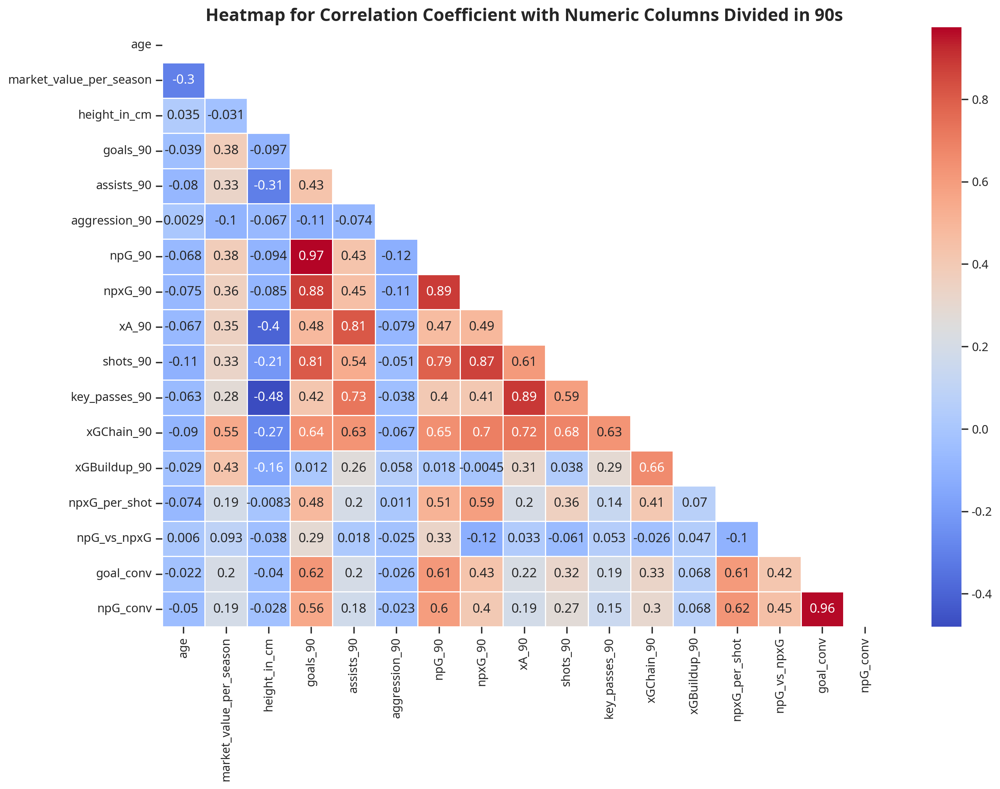

In [46]:
plt.figure(figsize=(15,10))

# 삼각형 마스크를 만든다(위 쪽 삼각형에 True, 아래 삼각형에 False)
mask = np.zeros_like(df_corr2, dtype=bool)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(df_corr2,
            annot=True,         # 실제 값을 표시한다
            mask=mask,          # 표시하지 않을 마스크 부분을 지정한다
            linewidths=.5,      # 경계면 실선으로 구분하기
            cmap='coolwarm')

plt.title("Heatmap for Correlation Coefficient with Numeric Columns Divided in 90s", fontsize=16, fontweight='bold')
plt.show()

In [49]:
# 변경한 데이터프레임 (df_copy) 다중공선성 확인
feature_engineering_XbyVIF(df_copy[["age", "height_in_cm",
                                    "goals_90",	"assists_90", "aggression_90",	
                                    "npG_90", "npxG_90", "xA_90", "shots_90", "key_passes_90",
                                    "xGChain_90", "xGBuildup_90", "npxG_per_shot", "npG_vs_npxG", 
                                    "goal_conv", "npG_conv"
                                    ]])

,VIF_Factor,Feature
0,1.050931,age
1,1.368047,height_in_cm
2,67.054295,goals_90
3,3.179917,assists_90
4,1.085539,aggression_90
5,101.725362,npG_90
6,54.483339,npxG_90
7,8.573054,xA_90
8,7.938272,shots_90
9,6.057584,key_passes_90


### 6-2. 상관관계, 다중 공선성 결과

- 매우 강한 상관관계 (0.8 이상)
    - `npG_90` - `goals_90`
    - `goal_conv` - `npG_conv`
    - `npG_90` - `npxG_90`
    - `xA_90` - `key_passes_90`
    - `goals_90` - `npxG_90`
    - `npxG_90` - `shots_90`
    - `assists_90` - `xA_90`
    - `goals_90` - `shots_90`
- 강한 상관 관계 (0.6 ~ 0.8)
    - `npG_90` - `shots_90`
    - `assists_90` - `key_passes_90`
    - `xA_90` - `xGChain_90`
    - `npxG_90` - `xGChain_90`
    - `shots_90` - `xGChain_90`
    - `xGBuildup_90` - `xGChain_90`
    - `goal_conv` - `goals_90`
    - `npG_90` - `npG_conv`
- 음의 상관관계 (-0.5 ~ 0.0)
    - `height_in_cm` - `key_passes_90`
    - `height_in_cm` - `xA_90`
    - `age` - `market_value_per_season`
    - `height_in_cm` - `assists_90`

- 추후 머신러닝 모델링에 따라 컬럼 추가 제거 예정

- 다중 공선성 변화 (소수점에서 반올림)
    - `goals` - `goals_90` : 28 → 67
    - `npg` - `npg_90` : 29 → 102 
    - `npxG` - `npxG_90` : 20 → 54
    - `xA` - `xA_90` : 13 → 9
    - `xGChain` - `xGChain_90` : 28 → 16
    - `xGBuildup` - `xGBuildup_90` : 10 → 6
    - `goal_conv` : 41 (새로 생성)
    - `npG_conv` : 41 (새로 생성)
- `goals`, `npg`를 활용한 파생변수를 다수 생성해서 증가한 것으로 보임

### 6-3. 컬럼 수정
- `goals`와 관련된 컬럼 제거한 후 다시 상관 관계 및 다중 공선성 확인
- `goals` 컬럼은 `npG`로 대체 가능

In [50]:
df_corr3 = df_copy[["age", "market_value_per_season", "height_in_cm", "assists_90", "aggression_90",	
                    # "goals_90", "goal_conv", 
                    "npG_90", "npxG_90", "xA_90", "shots_90", "key_passes_90",
                    "xGChain_90", "xGBuildup_90", "npxG_per_shot", "npG_vs_npxG", "npG_conv"
                    ]].corr()


df_corr3.style.background_gradient()

,age,market_value_per_season,height_in_cm,assists_90,aggression_90,npG_90,npxG_90,xA_90,shots_90,key_passes_90,xGChain_90,xGBuildup_90,npxG_per_shot,npG_vs_npxG,npG_conv
age,1.000000,-0.298944,0.034877,-0.080218,0.002882,-0.068240,-0.074875,-0.067271,-0.109586,-0.062524,-0.090432,-0.028605,-0.074326,0.006000,-0.050291
market_value_per_season,-0.298944,1.000000,-0.031110,0.328458,-0.099635,0.378877,0.358696,0.352664,0.331484,0.278260,0.553119,0.433522,0.185576,0.092559,0.190841
height_in_cm,0.034877,-0.031110,1.000000,-0.307754,-0.067445,-0.094072,-0.084579,-0.396273,-0.214606,-0.480496,-0.268481,-0.156957,-0.008256,-0.037666,-0.028408
assists_90,-0.080218,0.328458,-0.307754,1.000000,-0.074412,0.432627,0.453889,0.811476,0.539403,0.725114,0.629778,0.262317,0.197245,0.017645,0.175438
aggression_90,0.002882,-0.099635,-0.067445,-0.074412,1.000000,-0.118454,-0.110012,-0.078924,-0.050677,-0.037857,-0.066522,0.057537,0.010505,-0.025082,-0.022894
npG_90,-0.068240,0.378877,-0.094072,0.432627,-0.118454,1.000000,0.886236,0.472052,0.790457,0.404469,0.646046,0.017961,0.509964,0.328795,0.598507
npxG_90,-0.074875,0.358696,-0.084579,0.453889,-0.110012,0.886236,1.000000,0.487873,0.871629,0.407604,0.700325,-0.004521,0.591065,-0.117564,0.403033
xA_90,-0.067271,0.352664,-0.396273,0.811476,-0.078924,0.472052,0.487873,1.000000,0.610275,0.891339,0.723073,0.311720,0.203286,0.033109,0.185599
shots_90,-0.109586,0.331484,-0.214606,0.539403,-0.050677,0.790457,0.871629,0.610275,1.000000,0.589448,0.679028,0.038392,0.356537,-0.060546,0.270291
key_passes_90,-0.062524,0.278260,-0.480496,0.725114,-0.037857,0.404469,0.407604,0.891339,0.589448,1.000000,0.631751,0.291323,0.136632,0.052713,0.145883


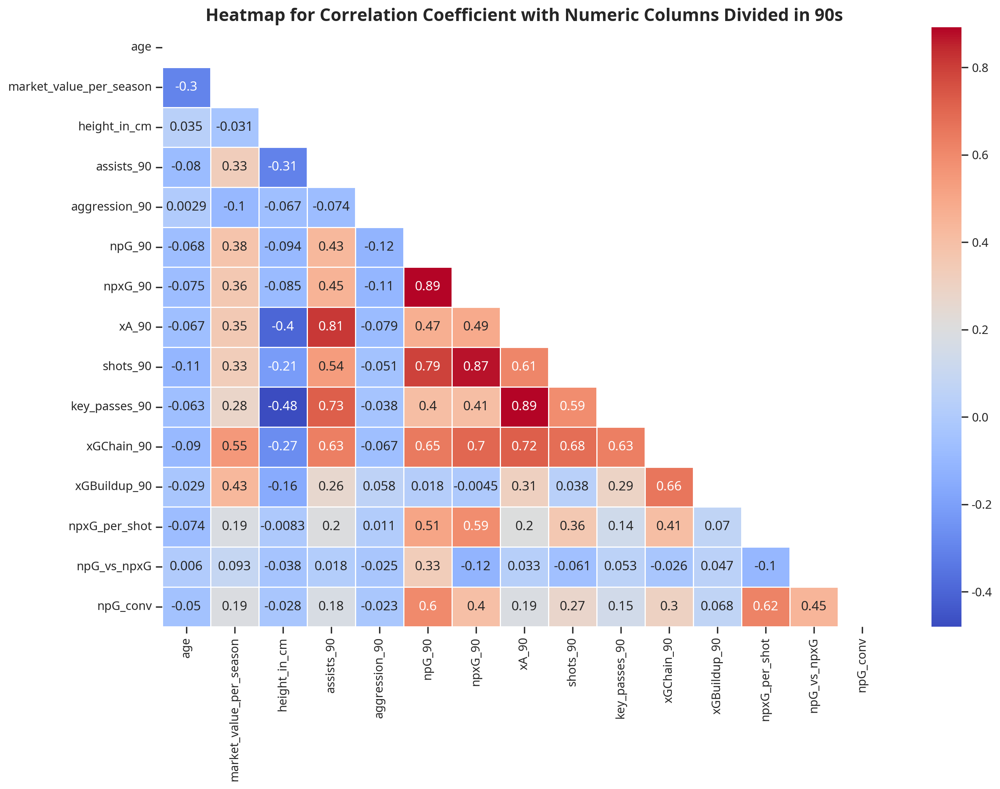

In [51]:
plt.figure(figsize=(15,10))

# 삼각형 마스크를 만든다(위 쪽 삼각형에 True, 아래 삼각형에 False)
mask = np.zeros_like(df_corr3, dtype=bool)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(df_corr3,
            annot=True,         # 실제 값을 표시한다
            mask=mask,          # 표시하지 않을 마스크 부분을 지정한다
            linewidths=.5,      # 경계면 실선으로 구분하기
            cmap='coolwarm')

plt.title("Heatmap for Correlation Coefficient with Numeric Columns Divided in 90s", fontsize=16, fontweight='bold')
plt.show()

In [52]:
# goals와 관련된 컬럼 제거한 데이터프레임 다중공선성 확인
feature_engineering_XbyVIF(df_copy[["age", "height_in_cm", "assists_90", "aggression_90",	
                                    # "goals_90", "goal_conv", 
                                    "npG_90", "npxG_90", "xA_90", "shots_90", "key_passes_90",
                                    "xGChain_90", "xGBuildup_90", "npxG_per_shot", "npG_vs_npxG", "npG_conv"
                                    ]])

,VIF_Factor,Feature
0,1.028890,age
1,1.366102,height_in_cm
2,3.176403,assists_90
3,1.085316,aggression_90
4,49.158139,npG_90
5,53.768411,npxG_90
6,8.436061,xA_90
7,7.697484,shots_90
8,5.983256,key_passes_90
9,15.273345,xGChain_90


#### 6-3-1. 컬럼 수정 후 상관관계, 다중 공선성 확인
- 매우 강한 상관관계 (0.8 이상)
    - `npG_90` - `npxG_90`
    - `xA_90` - `key_passes_90`
    - `npxG_90` - `shots_90`
    - `assists_90` - `xA_90`
- 강한 상관 관계 (0.6 ~ 0.8)
    - `npG_90` - `shots_90`
    - `assists_90` - `key_passes_90`
    - `xA_90` - `xGChain_90`
    - `npxG_90` - `xGChain_90`
    - `shots_90` - `xGChain_90`
    - `xGBuildup_90` - `xGChain_90`
    - `npxG_per_shot` - `npG_conv`
    - `npG_90` - `npG_conv`
- 음의 상관관계 (-0.5 ~ 0.0)
    - `height_in_cm` - `key_passes_90`
    - `height_in_cm` - `xA_90`
    - `height_in_cm` - `assists_90`
    - `age` - `market_value_per_season`

- 다중 공선성 변화 (소수점에서 반올림)
    - `npG_90` : 102 → 49
    - `npxG_90` : 54 → 54
    - `xA_90` : 9 → 8
    - `xGChain_90` : 16 → 15
    - `xGBuildup_90` : 6 → 6
    - `npG_conv` : 41 → 3
- `goals`를 제거하니 npG 관련 컬럼 다중 공선성 감소
    - 그러나 아직 많이 다중 공선성이 매우 높다
- 추후 머신러닝 모델링에 따라 컬럼 추가 제거 예정

## 7. `column`별 분석

### 7-1. 나이에 따른 `goals`, `assists` 분석

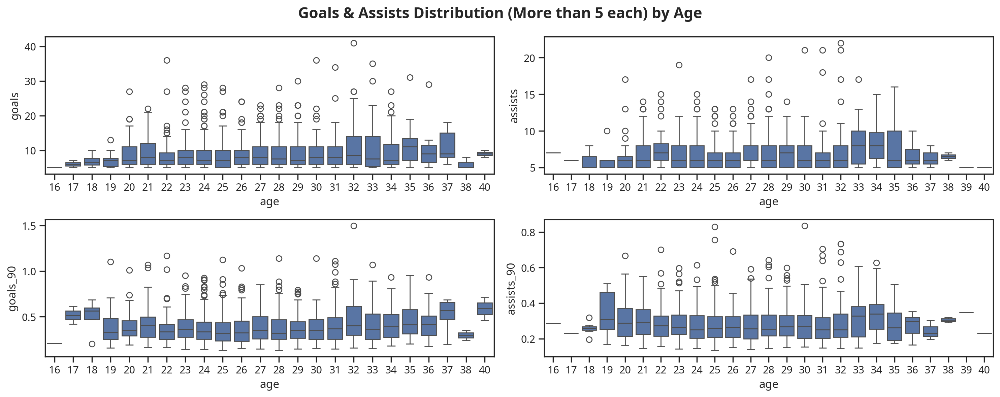

In [53]:
# boxplot 그려서 나이에 따른 골, 어시스트 확인
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 6))

# plt.figure(figsize=(15,8))
g1 = sns.boxplot(data=df_copy[df_copy["goals"]>=5], x="age", y="goals", ax=axes[0,0])
g2 = sns.boxplot(data=df_copy[df_copy["assists"]>=5], x="age", y="assists", ax=axes[0,1])

g3 = sns.boxplot(data=df_copy[df_copy["goals"]>=5], x="age", y="goals_90", ax=axes[1, 0])
g4 = sns.boxplot(data=df_copy[df_copy["assists"]>=5], x="age", y="assists_90", ax=axes[1, 1])

plt.suptitle("Goals & Assists Distribution (More than 5 each) by Age", fontsize=16, fontweight="bold")

fig.tight_layout()
plt.show()

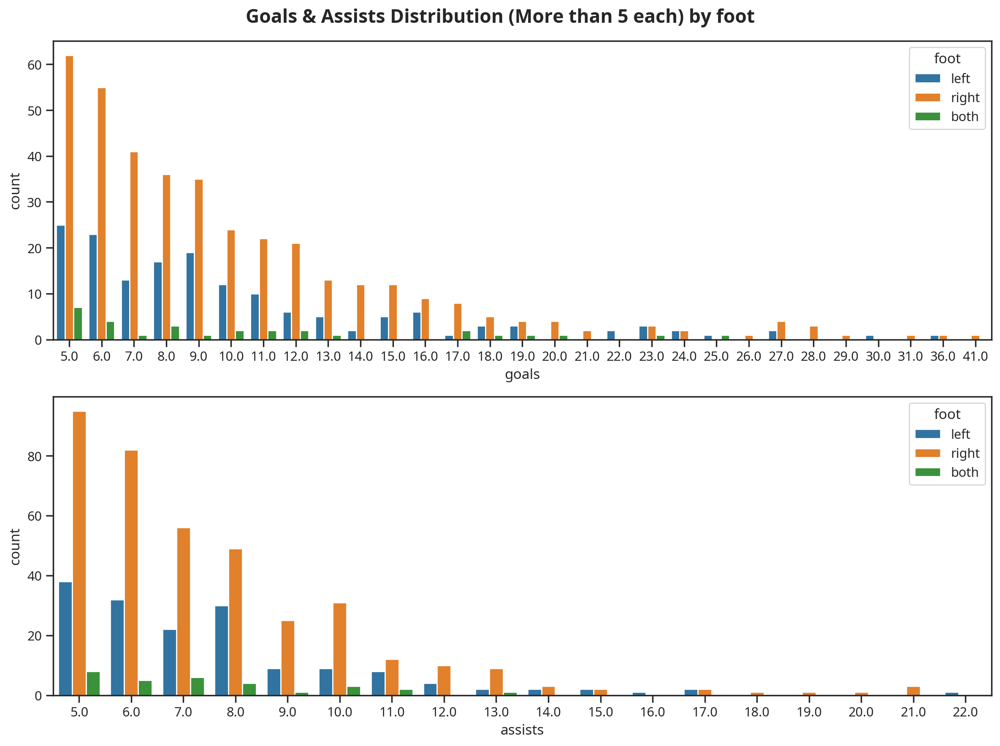

In [54]:
# countplot 그려서 골, 어시스트 숫자 확인
# 골, 어시스트 0인 선수 제외

goals_assists = ["goals", "assists"]
more_than_zero = (df_copy.goals >= 5) & (df_copy.assists >= 5)

# 'foot' 카테고리 값에 맞는 고정 색상 설정
hue_order = ['left', 'right', 'both']
fixed_palette = dict(zip(hue_order, sns.color_palette("tab10", len(hue_order))))

fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 9))

for col, ax in zip(goals_assists, axes):
    sns.countplot(data=df_copy[more_than_zero], x=col, ax=ax, hue="foot", palette=fixed_palette, hue_order=hue_order)

plt.suptitle("Goals & Assists Distribution (More than 5 each) by foot", fontsize=16, fontweight="bold")

fig.tight_layout()
plt.show()


In [60]:
# 페널티킥을 제외하고 가장 많이 득점한 선수 확인
df_copy[df_copy.npG==np.max(df_copy.npG)]

,player_name,start_season,yellow_cards,red_cards,goals,assists,minutes_played,competition_code,date_of_birth,position,team_title,market_value_per_season,country,foot,height_in_cm,xA,shots,key_passes,npG,npxG,xGChain,xGBuildup,age,aggression,goals_90,assists_90,aggression_90,npG_90,npxG_90,xA_90,shots_90,key_passes_90,xGChain_90,xGBuildup_90,npG_per_shot,npxG_per_shot,goal_conv,npG_conv,npG_vs_npxG
828,Robert Lewandowski,2020,4.0,0.0,41.0,7.0,2463.0,bundesliga,1988-08-21,Centre-Forward,Bayern Munich,60000000.0,Poland,right,185.0,4.81555,135.0,32.0,33.0,25.25735,31.740188,5.689343,32,1.2,1.498173,0.255786,0.043849,1.205847,0.922924,0.175964,4.933009,1.169306,1.159812,0.207893,0.244444,0.187091,0.303704,0.244444,7.74265


In [61]:
# 90분당 npG (페널티킥 제외 득점) 가장 높은 선수 확인
df_copy[df_copy.npG_90==np.max(df_copy["npG_90"])]

,player_name,start_season,yellow_cards,red_cards,goals,assists,minutes_played,competition_code,date_of_birth,position,team_title,market_value_per_season,country,foot,height_in_cm,xA,shots,key_passes,npG,npxG,xGChain,xGBuildup,age,aggression,goals_90,assists_90,aggression_90,npG_90,npxG_90,xA_90,shots_90,key_passes_90,xGChain_90,xGBuildup_90,npG_per_shot,npxG_per_shot,goal_conv,npG_conv,npG_vs_npxG
828,Robert Lewandowski,2020,4.0,0.0,41.0,7.0,2463.0,bundesliga,1988-08-21,Centre-Forward,Bayern Munich,60000000.0,Poland,right,185.0,4.81555,135.0,32.0,33.0,25.25735,31.740188,5.689343,32,1.2,1.498173,0.255786,0.043849,1.205847,0.922924,0.175964,4.933009,1.169306,1.159812,0.207893,0.244444,0.187091,0.303704,0.244444,7.74265


In [62]:
# 22 어시스트한 선수 확인
df_copy[df_copy.assists==np.max(df_copy.assists)]

,player_name,start_season,yellow_cards,red_cards,goals,assists,minutes_played,competition_code,date_of_birth,position,team_title,market_value_per_season,country,foot,height_in_cm,xA,shots,key_passes,npG,npxG,xGChain,xGBuildup,age,aggression,goals_90,assists_90,aggression_90,npG_90,npxG_90,xA_90,shots_90,key_passes_90,xGChain_90,xGBuildup_90,npG_per_shot,npxG_per_shot,goal_conv,npG_conv,npG_vs_npxG
7074,Lionel Messi,2019,4.0,0.0,25.0,22.0,2880.0,laliga,1987-06-24,Right Winger,Barcelona,112000000.0,Argentina,left,170.0,16.593372,159.0,88.0,20.0,17.133271,34.923478,13.537662,32,1.2,0.78125,0.6875,0.0375,0.625,0.535415,0.518543,4.96875,2.75,1.091359,0.423052,0.125786,0.107756,0.157233,0.125786,2.866729


In [63]:
# 90분당 어시스트 가장 높은 선수 확인
df_copy[df_copy.assists_90==np.max(df_copy.assists_90)]

,player_name,start_season,yellow_cards,red_cards,goals,assists,minutes_played,competition_code,date_of_birth,position,team_title,market_value_per_season,country,foot,height_in_cm,xA,shots,key_passes,npG,npxG,xGChain,xGBuildup,age,aggression,goals_90,assists_90,aggression_90,npG_90,npxG_90,xA_90,shots_90,key_passes_90,xGChain_90,xGBuildup_90,npG_per_shot,npxG_per_shot,goal_conv,npG_conv,npG_vs_npxG
416,Thomas Müller,2019,5.0,0.0,8.0,21.0,2261.0,bundesliga,1989-09-13,Second Striker,Bayern Munich,30000000.0,Germany,right,185.0,15.50624,53.0,83.0,8.0,8.575405,36.356539,18.292041,30,1.5,0.318443,0.835913,0.059708,0.318443,0.341347,0.617232,2.109686,3.303848,1.447186,0.728122,0.150943,0.1618,0.150943,0.150943,-0.575405


In [64]:
# 키 패스 가장 많이 한 선수
df_copy[df_copy.key_passes==np.max(df_copy.key_passes)]

,player_name,start_season,yellow_cards,red_cards,goals,assists,minutes_played,competition_code,date_of_birth,position,team_title,market_value_per_season,country,foot,height_in_cm,xA,shots,key_passes,npG,npxG,xGChain,xGBuildup,age,aggression,goals_90,assists_90,aggression_90,npG_90,npxG_90,xA_90,shots_90,key_passes_90,xGChain_90,xGBuildup_90,npG_per_shot,npxG_per_shot,goal_conv,npG_conv,npG_vs_npxG
4648,Kevin De Bruyne,2019,3.0,0.0,13.0,20.0,2800.0,premier-league,1991-06-28,Attacking Midfield,Manchester City,120000000.0,Belgium,right,181.0,20.620713,100.0,133.0,12.0,6.58409,37.798304,19.244827,28,0.9,0.417857,0.642857,0.028929,0.385714,0.211631,0.662809,3.214286,4.275,1.214945,0.618584,0.12,0.065841,0.13,0.12,5.41591


In [65]:
# 90분당 키 패스 가장 많이 한 선수
df_copy[df_copy.key_passes_90==np.max(df_copy.key_passes_90)]

,player_name,start_season,yellow_cards,red_cards,goals,assists,minutes_played,competition_code,date_of_birth,position,team_title,market_value_per_season,country,foot,height_in_cm,xA,shots,key_passes,npG,npxG,xGChain,xGBuildup,age,aggression,goals_90,assists_90,aggression_90,npG_90,npxG_90,xA_90,shots_90,key_passes_90,xGChain_90,xGBuildup_90,npG_per_shot,npxG_per_shot,goal_conv,npG_conv,npG_vs_npxG
4648,Kevin De Bruyne,2019,3.0,0.0,13.0,20.0,2800.0,premier-league,1991-06-28,Attacking Midfield,Manchester City,120000000.0,Belgium,right,181.0,20.620713,100.0,133.0,12.0,6.58409,37.798304,19.244827,28,0.9,0.417857,0.642857,0.028929,0.385714,0.211631,0.662809,3.214286,4.275,1.214945,0.618584,0.12,0.065841,0.13,0.12,5.41591


### 7-2. 시즌별 Goals, Assists Top 5 확인

In [66]:
# func1 : npG Top 5로 정렬
func1 = lambda x: x.sort_values(by="npG", ascending=False)[:5]

# func2 : 어시스트 Top 5로 정렬 
func2 = lambda x: x.sort_values(by="assists", ascending=False)[:5]

In [67]:
# 골 Top 5로 정렬
npG_top5 = df_copy.groupby("start_season")[["player_name", "npG", "assists"]].apply(func1)
npG_top5.head()

player_name   npG  assists
start_season                                               
2019         369          Robert Lewandowski  29.0      4.0
             422                 Timo Werner  25.0      8.0
             4482                 Danny Ings  21.0      2.0
             4756  Pierre-Emerick Aubameyang  20.0      3.0
             7074               Lionel Messi  20.0     22.0

In [68]:
# 어시스트 Top 5로 정렬 
assist_top5 = df_copy.groupby("start_season")[["player_name", "npG", "assists"]].apply(func2)
assist_top5.head()

player_name   npG  assists
start_season                                        
2019         7074        Lionel Messi  20.0     22.0
             416        Thomas Müller   8.0     21.0
             4648     Kevin De Bruyne  12.0     20.0
             147         Jadon Sancho  17.0     17.0
             63    Christopher Nkunku   5.0     15.0

In [69]:
# npG_top5, assist_top5를 합쳐 시즌별 골, 어시스트 top 5를 넣은 데이터프레임 생성
npG_assists_top5 = pd.concat([npG_top5, assist_top5]).reset_index()
npG_assists_top5.drop_duplicates(inplace=True)
npG_assists_top5

,start_season,level_1,player_name,npG,assists
0,2019,369,Robert Lewandowski,29.0,4.0
1,2019,422,Timo Werner,25.0,8.0
2,2019,4482,Danny Ings,21.0,2.0
3,2019,4756,Pierre-Emerick Aubameyang,20.0,3.0
4,2019,7074,Lionel Messi,20.0,22.0
5,2020,828,Robert Lewandowski,33.0,7.0
6,2020,7503,Lionel Messi,27.0,11.0
7,2020,558,Erling Haaland,25.0,8.0
8,2020,2578,Cristiano Ronaldo,23.0,2.0
9,2020,9797,Kylian Mbappé,21.0,7.0


#### 7-2-1. 시각화 (`plotly`)

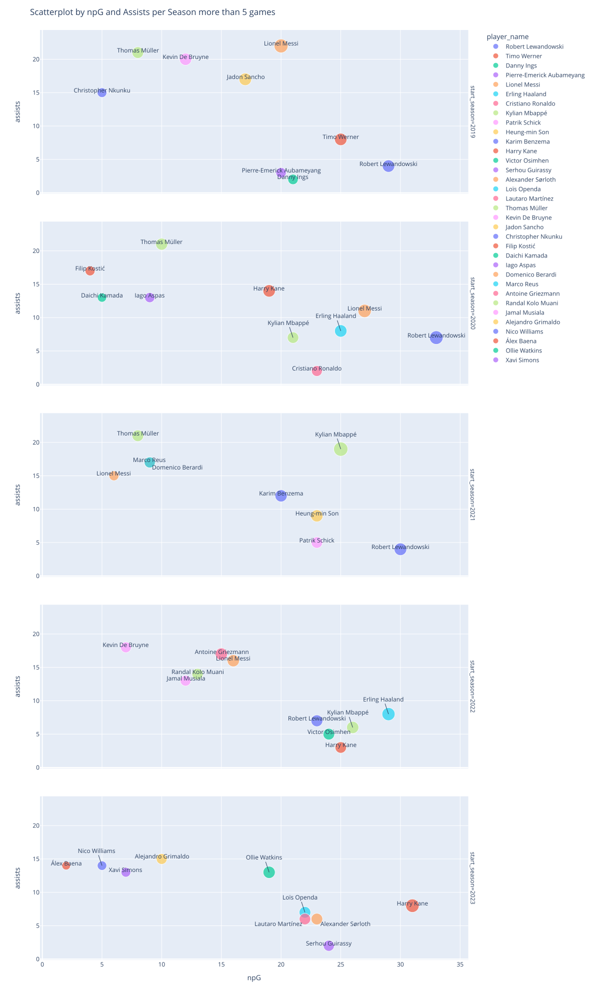

In [98]:
# 원의 크기 : 공격포인트 합산 (npG + assists)
fig = px.scatter(data_frame=npG_assists_top5, x="npG", y="assists", color="player_name", 
                 size=npG_assists_top5["npG"]+npG_assists_top5["assists"], facet_row="start_season", 
                 width=1200, height=2000)

overlapped_names = ["André Silva", "Rafa", "Ollie Watkins", "Nico Williams", "Erling Haaland",
                    "Leroy Sané", "Jan-Niklas Beste", "Viktor Gyökeres", "Kylian Mbappé", "Loïs Openda"]
low_overlapped_names = ["Lautaro Martínez"]
low_overlapped_names2 = ["Alexander Sørloth", "Domenico Berardi"]

for i, season in enumerate(npG_assists_top5["start_season"].unique()):
    seasonal = npG_assists_top5[npG_assists_top5["start_season"] == season].reset_index(drop=True)
    
    i = (-1)*(i-5)

    for j in range(seasonal.shape[0]):
        if seasonal.loc[j, "player_name"] in overlapped_names:
            fig.add_annotation(x=seasonal.loc[j, "npG"], y=seasonal.loc[j, "assists"],
                               text=seasonal.loc[j, "player_name"],
                               showarrow=True,
                               row=i, col=1)
        elif seasonal.loc[j, "player_name"] in low_overlapped_names:
            fig.add_annotation(x=seasonal.loc[j, "npG"], y=seasonal.loc[j, "assists"],
                               text=seasonal.loc[j, "player_name"],
                               xanchor="right",
                               yanchor="top",
                               showarrow=False,
                               ax=-10, ay=-10,  # 데이터 포인트와 텍스트를 연결하는 선의 위치 조정
                               arrowhead=2,  # 화살표 머리 스타일
                               row=i, col=1)
        elif seasonal.loc[j, "player_name"] in low_overlapped_names2:
            fig.add_annotation(x=seasonal.loc[j, "npG"], y=seasonal.loc[j, "assists"],
                               text=seasonal.loc[j, "player_name"],
                               xanchor="left",
                               yanchor="top",
                               showarrow=False,
                               ax=-10, ay=-10,  # 데이터 포인트와 텍스트를 연결하는 선의 위치 조정
                               arrowhead=2,  # 화살표 머리 스타일
                               row=i, col=1)
        else:
            fig.add_annotation(x=seasonal.loc[j, "npG"], y=seasonal.loc[j, "assists"],
                               text=seasonal.loc[j, "player_name"],
                               showarrow=False,
                               yshift=5,
                               row=i, col=1)

fig.update_layout(title_text="Scatterplot by npG and Assists per Season more than 5 games")

fig.show()



### 7-3. `market_value_per_season` 분석

#### 7-3-1. 시즌별 나이에 따른 평균 선수 몸값 변화 

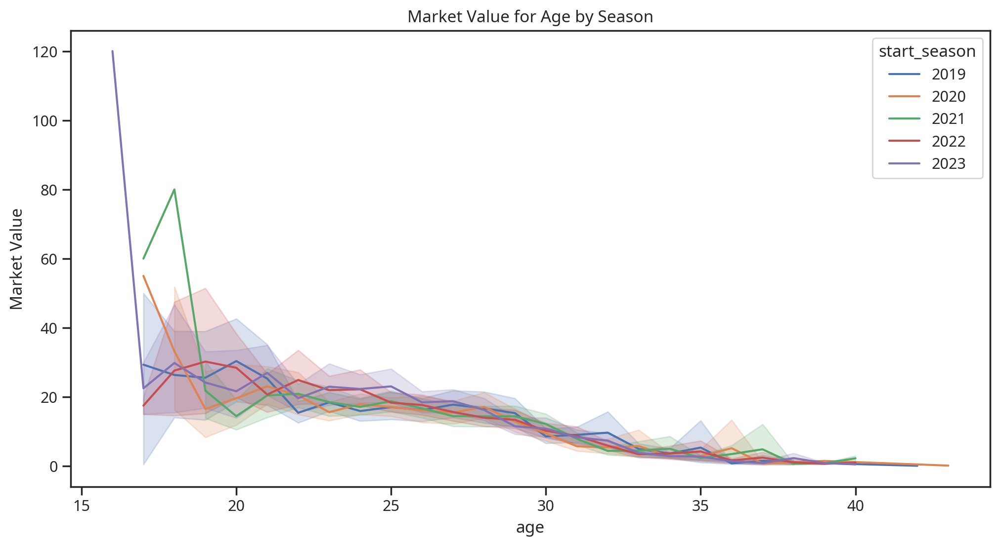

In [99]:
# 시즌, 연령에 따른 선수 몸값 변화

plt.figure(figsize=(12, 6))
ax = sns.lineplot(data=df_copy, x=df_copy["age"], y=df_copy["market_value_per_season"]/1000000, hue="start_season", estimator="mean")
ax.set_ylabel("Market Value", fontsize=12)
plt.title("Market Value for Age by Season")
plt.show()

In [109]:
# 23-24 시즌 기준, 16세의 Market Value 그래프가 유독 높게 솟아 있다 (보라색 lineplot)
# 23-24 시즌 기준, 16세 이하 중 가장 높은 몸값 자랑하는 선수 확인 → Lamine Yamal (120M)

df_copy[(df_copy["age"]<=16) & (df_copy["start_season"]=="2023")].sort_values("market_value_per_season", ascending=False)

,player_name,start_season,yellow_cards,red_cards,goals,assists,minutes_played,competition_code,date_of_birth,position,team_title,market_value_per_season,country,foot,height_in_cm,xA,shots,key_passes,npG,npxG,xGChain,xGBuildup,age,aggression,goals_90,assists_90,aggression_90,npG_90,npxG_90,xA_90,shots_90,key_passes_90,xGChain_90,xGBuildup_90,npG_per_shot,npxG_per_shot,goal_conv,npG_conv,npG_vs_npxG
8884,Lamine Yamal,2023,3.0,0.0,5.0,7.0,2196.0,laliga,2007-07-13,Right Winger,Barcelona,120000000.0,Spain,left,180.0,6.701532,58.0,39.0,5.0,5.792876,22.475352,12.034276,16,0.9,0.204918,0.286885,0.036885,0.204918,0.237413,0.274653,2.377049,1.598361,0.921121,0.493208,0.086207,0.099877,0.086207,0.086207,-0.792876


In [113]:
# 21-22 시즌 기준, 18세의 Market Value 그래프가 높다 (초록색 lineplot)
# 21-22 시즌 기준, 18세 이하 중 가장 높은 몸값 자랑하는 선수 확인 → Jude Bellingham	(80M)
df_copy[(df_copy["age"]<=18) & (df_copy["start_season"]=="2021")].sort_values("market_value_per_season", ascending=False)

,player_name,start_season,yellow_cards,red_cards,goals,assists,minutes_played,competition_code,date_of_birth,position,team_title,market_value_per_season,country,foot,height_in_cm,xA,shots,key_passes,npG,npxG,xGChain,xGBuildup,age,aggression,goals_90,assists_90,aggression_90,npG_90,npxG_90,xA_90,shots_90,key_passes_90,xGChain_90,xGBuildup_90,npG_per_shot,npxG_per_shot,goal_conv,npG_conv,npG_vs_npxG
1101,Jude Bellingham,2021,9.0,0.0,3.0,8.0,2795.0,bundesliga,2003-06-29,Attacking Midfield,Borussia Dortmund,80000000.0,England,right,186.0,5.934830,44.0,37.0,3.0,4.905647,20.299170,14.016300,18,2.7,0.096601,0.257603,0.086941,0.096601,0.157964,0.191104,1.416816,1.191413,0.653641,0.451330,0.068182,0.111492,0.068182,0.068182,-1.905647
7835,Gavi,2021,11.0,0.0,2.0,6.0,2326.0,laliga,2004-08-05,Central Midfield,Barcelona,60000000.0,Spain,right,173.0,4.285056,30.0,20.0,2.0,4.449615,16.296991,9.315063,17,3.3,0.077386,0.232158,0.127687,0.077386,0.172169,0.165802,1.160791,0.773861,0.630580,0.360428,0.066667,0.148321,0.066667,0.066667,-2.449615


In [114]:
# 20-21 시즌 기준, 17세의 Market Value 그래프가 높다 (주황 lineplot)
# 20-21 시즌 기준, 17세 이하 중 가장 높은 몸값 자랑하는 선수 확인 → Gavi (60M)
df_copy[(df_copy["age"]==17) & (df_copy["start_season"]=="2021")].sort_values("market_value_per_season", ascending=False)

,player_name,start_season,yellow_cards,red_cards,goals,assists,minutes_played,competition_code,date_of_birth,position,team_title,market_value_per_season,country,foot,height_in_cm,xA,shots,key_passes,npG,npxG,xGChain,xGBuildup,age,aggression,goals_90,assists_90,aggression_90,npG_90,npxG_90,xA_90,shots_90,key_passes_90,xGChain_90,xGBuildup_90,npG_per_shot,npxG_per_shot,goal_conv,npG_conv,npG_vs_npxG
7835,Gavi,2021,11.0,0.0,2.0,6.0,2326.0,laliga,2004-08-05,Central Midfield,Barcelona,60000000.0,Spain,right,173.0,4.285056,30.0,20.0,2.0,4.449615,16.296991,9.315063,17,3.3,0.077386,0.232158,0.127687,0.077386,0.172169,0.165802,1.160791,0.773861,0.63058,0.360428,0.066667,0.148321,0.066667,0.066667,-2.449615


#### 7-3-2. 23-24 시즌 연령, 포지션별 최고 몸값 선수

In [115]:
# pos_category 함수 수정: row를 파라미터로 받아서 처리
def pos_category(row, col):
    if row[col] in ["Second Striker", "Centre-Forward", "Left Winger", "Right Winger"]:
        return "Forward"
    elif row[col] in ["Attacking Midfield", "Central Midfield", "Defensive Midfield", "Left Midfield", "Right Midfield"]:
        return "Midfielder"
    elif row[col] in ["Goalkeeper"]:
        return "Goalkeeper"
    else:
        return "Defender"

# df_copy에 새 컬럼 추가: 'position_category'
# df_copy['position_category'] = df_copy.apply(lambda row: pos_category(row, "position"), axis=1)
df_copy['position_category'] = df_copy.apply(lambda row: pos_category(row, "position"), axis=1)

In [116]:
df_copy_23 = df_copy[df_copy["start_season"]=="2023"]

# 각 나이별로 market_value_per_season가 가장 높은 선수의 정보 추출
idx = df_copy_23.groupby("age")["market_value_per_season"].idxmax()

# 해당 인덱스를 기반으로 player_name과 market_value_per_season를 선택
df_max_value_per_age = df_copy_23.loc[idx, ["age", "position_category", "player_name", "market_value_per_season"]]
df_max_value_per_age

,age,position_category,player_name,market_value_per_season
8884,16,Forward,Lamine Yamal,120000000.0
8970,17,Defender,Pau Cubarsí,30000000.0
11436,18,Midfielder,Warren Zaïre-Emery,60000000.0
8777,19,Midfielder,Gavi,90000000.0
8868,20,Midfielder,Jude Bellingham,180000000.0
1957,21,Midfielder,Florian Wirtz,130000000.0
6410,22,Forward,Bukayo Saka,140000000.0
6489,23,Forward,Erling Haaland,180000000.0
6739,24,Forward,Phil Foden,150000000.0
11254,25,Forward,Kylian Mbappé,180000000.0


In [117]:
df_copy_23 = df_copy[df_copy["start_season"]=="2023"]

# 각 나이별로 market_value_per_season가 가장 높은 선수의 정보 추출
idx = df_copy_23.groupby("position")["market_value_per_season"].idxmax()

# 해당 인덱스를 기반으로 player_name과 market_value_per_season를 선택
df_max_value_per_position = df_copy_23.loc[idx, ["position", "position_category", "player_name", "market_value_per_season"]]
df_max_value_per_position = df_max_value_per_position.sort_values(by="market_value_per_season", ascending=True)
df_max_value_per_position

,position,position_category,player_name,market_value_per_season
3917,Left Midfield,Midfielder,Carlos Augusto,22000000.0
3952,Right Midfield,Midfielder,Denzel Dumfries,24000000.0
3853,Second Striker,Forward,Ademola Lookman,40000000.0
8781,Goalkeeper,Goalkeeper,Giorgi Mamardashvili,45000000.0
6816,Right-Back,Defender,Trent Alexander-Arnold,70000000.0
6594,Left-Back,Defender,Josko Gvardiol,75000000.0
6770,Centre-Back,Defender,Rúben Dias,80000000.0
8763,Central Midfield,Midfielder,Federico Valverde,120000000.0
6760,Defensive Midfield,Midfielder,Rodri,130000000.0
6739,Right Winger,Forward,Phil Foden,150000000.0


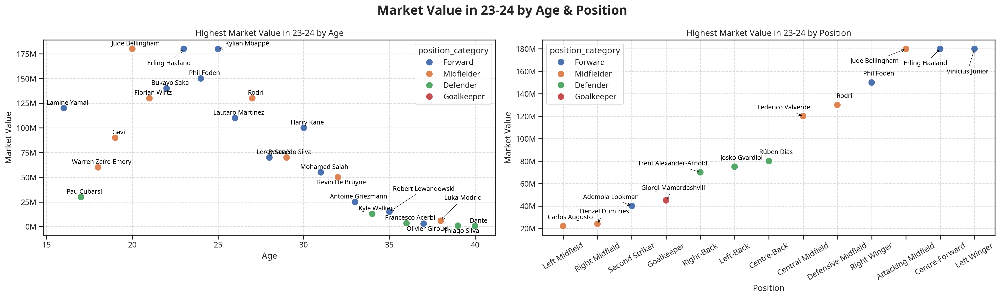

In [120]:
# Subplot 생성 (1*2)
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 6))

# y축을 M 단위로 표시하기 위한 포맷터 함수
def millions(x, pos):
    '1,000,000 단위로 나누어 M을 추가'
    return '%1.0fM' % (x * 1e-6)

hue_order = ["Forward", "Midfielder", "Defender", "Goalkeeper"]

# 1번 subplot: age vs market_value_per_season
ax1 = axes[0]
sns.scatterplot(data=df_max_value_per_age, x="age", y="market_value_per_season", 
                hue="position_category", hue_order=hue_order,
                s=100, color='b', ax=ax1)

# 각 포인트에 player_name 추가 (annotate)
for i in range(df_max_value_per_age.shape[0]):
    player_name = df_max_value_per_age["player_name"].iloc[i]
    x = df_max_value_per_age["age"].iloc[i]
    y = df_max_value_per_age["market_value_per_season"].iloc[i]

    # 특정 선수의 경우에는 텍스트를 포인트 아래에 위치시킴
    if player_name in ["Iago Aspas", "Thiago Silva", "Thomas Müller", "Kevin De Bruyne", "Kobbie Mainoo", "Olivier Giroud", "Leroy Sané	"]:
        ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(5, -10), ha='center', fontsize=9, color='black')
    elif player_name in ["Erling Haaland"]:
        ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, -23), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
    elif player_name in ["Kylian Mbappé"]:
        ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 5), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
    elif player_name in ["Robert Lewandowski", "Luka Modric"]:
        ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(5, 30), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
    elif player_name in ["Manuel Neuer"]:
        ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(5, 20), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
    elif player_name in ["Claudio Bravo"]:
        ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(-1, 10), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
    else:
        ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(5, 5), ha='center', fontsize=9, color='black')

# y축 포맷 설정
ax1.yaxis.set_major_formatter(ticker.FuncFormatter(millions))

# 그래프 꾸미기 (타이틀, 축 레이블 등 추가)
ax1.set_title("Highest Market Value in 23-24 by Age", fontsize=12)
ax1.set_xlabel("Age", fontsize=12)
ax1.set_ylabel("Market Value", fontsize=12)
ax1.grid(True, linestyle='--', alpha=0.7)

# 2번 subplot: position vs market_value_per_season
ax2 = axes[1]
sns.scatterplot(data=df_max_value_per_position, x="position", y="market_value_per_season", 
                hue="position_category", hue_order=hue_order,
                s=100, color='b', ax=ax2)

# 각 포인트에 player_name 추가 (annotate)
for i in range(df_max_value_per_position.shape[0]):
    player_name = df_max_value_per_position["player_name"].iloc[i]
    x = df_max_value_per_position["position"].iloc[i]
    y = df_max_value_per_position["market_value_per_season"].iloc[i]

    # 특정 선수의 경우에는 텍스트를 포인트 아래에 위치시킴
    if player_name in ["Erling Haaland"]:
        ax2.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, -23), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
    elif player_name in ["Jude Bellingham"]:
        ax2.annotate(player_name, (x, y), textcoords="offset points", xytext=(-10, -20), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
    elif player_name in ["Denzel Dumfries", "Giorgi Mamardashvili"]:
        ax2.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 15), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
    elif player_name in ["Vinicius Junior"]:
        ax2.annotate(player_name, (x, y), textcoords="offset points", xytext=(-10, -35), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
    elif player_name in ["Ademola Lookman", "Trent Alexander-Arnold", "Federico Valverde"]:
        ax2.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 10), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
    else:
        ax2.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 10), ha='center', fontsize=9, color='black')

# y축 포맷 설정
ax2.yaxis.set_major_formatter(ticker.FuncFormatter(millions))

# 그래프 꾸미기 (타이틀, 축 레이블 등 추가)
ax2.set_title("Highest Market Value in 23-24 by Position", fontsize=12)
ax2.set_xlabel("Position", fontsize=12)
ax2.set_ylabel("Market Value", fontsize=12)
ax2.grid(True, linestyle='--', alpha=0.7)
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=30)

# 레이아웃 조정 및 그래프 보여주기
plt.suptitle("Market Value in 23-24 by Age & Position", fontsize=18, fontweight="bold")
plt.tight_layout()
plt.show()


In [139]:
df_copy[df_copy["age"]==37].sort_values(by="market_value_per_season").tail(50)

,player_name,start_season,yellow_cards,red_cards,goals,assists,minutes_played,competition_code,date_of_birth,position,team_title,market_value_per_season,country,foot,height_in_cm,xA,shots,key_passes,npG,npxG,xGChain,xGBuildup,age,aggression,goals_90,assists_90,aggression_90,npG_90,npxG_90,xA_90,shots_90,key_passes_90,xGChain_90,xGBuildup_90,npG_per_shot,npxG_per_shot,goal_conv,npG_conv,npG_vs_npxG,position_category
7585,Pedro López,2020,2.0,0.0,0.0,1.0,1061.0,laliga,1983-11-01,Right-Back,SD Huesca,100000.0,Spain,right,174.0,1.226650,3.0,7.0,0.0,0.142717,2.649248,1.580590,37,0.6,0.000000,0.084826,0.050895,0.000000,0.012106,0.104051,0.254477,0.593779,0.224724,0.134075,0.000000,0.047572,0.000000,0.000000,-0.142717,Defender
10917,Riad Nouri,2022,3.0,0.0,1.0,1.0,1692.0,ligue-1,1985-06-07,Right Winger,Ajaccio,200000.0,France,right,178.0,1.830452,17.0,25.0,1.0,1.286689,2.514371,0.563184,37,0.9,0.053191,0.053191,0.047872,0.053191,0.068441,0.097364,0.904255,1.329787,0.133743,0.029957,0.058824,0.075688,0.058824,0.058824,-0.286689,Forward
7950,Manolo Reina,2021,4.0,0.0,0.0,0.0,1890.0,laliga,1985-04-01,Goalkeeper,Mallorca,200000.0,Spain,right,186.0,0.000000,0.0,0.0,0.0,0.000000,1.767550,1.767550,37,1.2,0.000000,0.000000,0.057143,0.000000,0.000000,0.000000,0.000000,0.000000,0.084169,0.084169,0.000000,0.000000,0.000000,0.000000,0.000000,Goalkeeper
3423,Daniel Ciofani,2022,1.0,0.0,8.0,0.0,1051.0,serie-a,1985-07-31,Centre-Forward,Cremonese,200000.0,Italy,right,191.0,0.693969,32.0,10.0,5.0,3.266213,3.270834,0.813319,37,0.3,0.685062,0.000000,0.025690,0.428164,0.279695,0.059427,2.740247,0.856327,0.280090,0.069647,0.156250,0.102069,0.250000,0.156250,1.733787,Forward
10834,Mathieu Coutadeur,2022,2.0,0.0,0.0,0.0,1951.0,ligue-1,1986-03-20,Central Midfield,Ajaccio,200000.0,France,right,169.0,0.919974,4.0,10.0,0.0,0.058856,4.112136,3.921961,37,0.6,0.000000,0.000000,0.027678,0.000000,0.002715,0.042439,0.184521,0.461302,0.189694,0.180921,0.000000,0.014714,0.000000,0.000000,-0.058856,Midfielder
3231,Niki Mäenpää,2021,1.0,0.0,0.0,1.0,1485.0,serie-a,1985-01-23,Goalkeeper,Venezia,200000.0,Finland,right,187.0,0.260322,0.0,1.0,0.0,0.000000,0.874711,0.614389,37,0.3,0.000000,0.060606,0.018182,0.000000,0.000000,0.015777,0.000000,0.060606,0.053013,0.037236,0.000000,0.000000,0.000000,0.000000,0.000000,Goalkeeper
9348,Ludovic Butelle,2019,0.0,0.0,0.0,0.0,2340.0,ligue-1,1983-04-03,Goalkeeper,Angers,250000.0,France,left,188.0,0.058820,0.0,1.0,0.0,0.000000,0.661228,0.602408,37,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.002262,0.000000,0.038462,0.025432,0.023170,0.000000,0.000000,0.000000,0.000000,0.000000,Goalkeeper
11195,Ismaël Traoré,2023,2.0,0.0,2.0,0.0,2221.0,ligue-1,1986-08-18,Centre-Back,Metz,250000.0,Cote d'Ivoire,right,184.0,0.089783,10.0,2.0,2.0,1.028329,1.987325,1.949644,37,0.6,0.081045,0.000000,0.024313,0.081045,0.041670,0.003638,0.405223,0.081045,0.080531,0.079004,0.200000,0.102833,0.200000,0.200000,0.971671,Defender
10524,Adil Rami,2022,2.0,0.0,0.0,1.0,1600.0,ligue-1,1985-12-27,Centre-Back,Troyes,250000.0,France,right,191.0,0.234406,9.0,3.0,0.0,0.539723,2.033524,1.878546,37,0.6,0.000000,0.056250,0.033750,0.000000,0.030359,0.013185,0.506250,0.168750,0.114386,0.105668,0.000000,0.059969,0.000000,0.000000,-0.539723,Defender
2159,Norman Theuerkauf,2023,3.0,0.0,0.0,1.0,1258.0,bundesliga,1987-01-24,Defensive Midfield,FC Heidenheim,300000.0,Germany,left,183.0,0.761656,7.0,11.0,0.0,0.563132,2.716423,1.885959,37,0.9,0.000000,0.071542,0.064388,0.000000,0.040288,0.054490,0.500795,0.786963,0.194339,0.134925,0.000000,0.080447,0.000000,0.000000,-0.563132,Midfielder


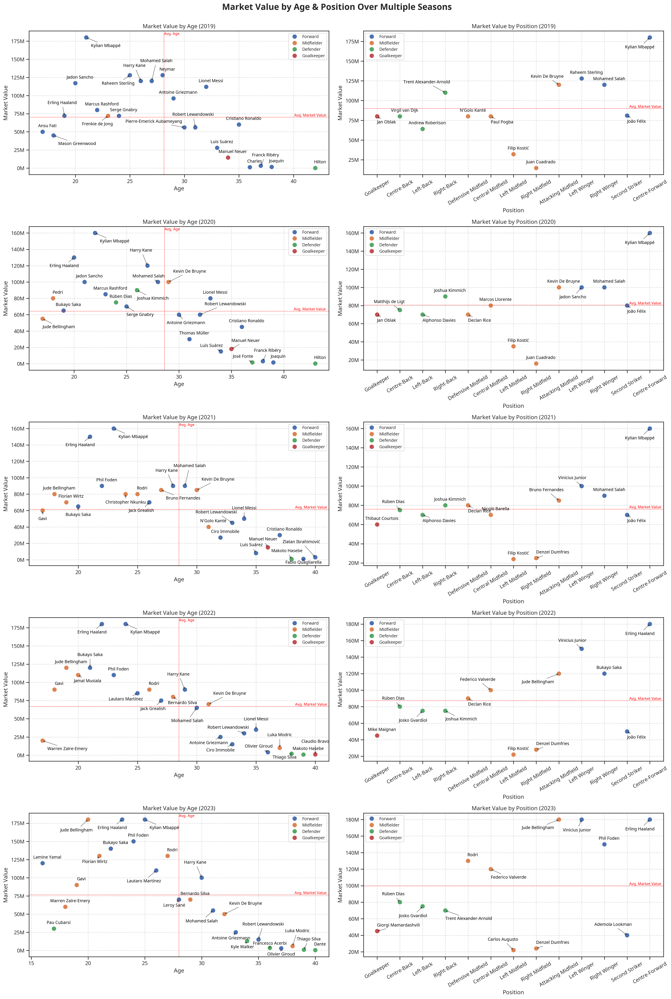

In [157]:
# Subplot 생성 (5*2)
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(20, 30))

# 포지션 순서 고정 (categorical)
position_order = ["Goalkeeper", "Centre-Back", "Left-Back", "Right-Back", "Defensive Midfield", 
                  "Central Midfield", "Left Midfield", "Right Midfield", "Attacking Midfield", 
                  "Left Winger", "Right Winger", "Second Striker", "Centre-Forward"]
# position_order에 따라 position을 정수로 매핑하는 딕셔너리 생성
position_mapping = {position: idx for idx, position in enumerate(position_order)}

hue_order = ["Forward", "Midfielder", "Defender", "Goalkeeper"]


# for loop로 각 연도별 데이터를 각각의 subplot에 그리기
row_idx = 0  # subplot row 인덱스
col_idx = 0  # subplot col 인덱스

for year in df_copy["start_season"].unique():
    df_year = df_copy[df_copy["start_season"] == year]
    
    # age, position별 가장 높은 market value 가진 id 불러오기
    idx_age = df_year.groupby("age")["market_value_per_season"].idxmax()
    idx_pos = df_year.groupby("position")["market_value_per_season"].idxmax()

    df_max_value_per_age = df_year.loc[idx_age, ["age", "position_category", "player_name", "market_value_per_season"]]
    df_max_value_per_position = df_year.loc[idx_pos, ["position", "position_category", "player_name", "market_value_per_season"]]

    # position을 숫자로 매핑하여 새로운 컬럼 생성
    df_max_value_per_position["position_numeric"] = df_max_value_per_position["position"].map(position_mapping)

    # 평균 계산
    avg_market_value = df_max_value_per_age["market_value_per_season"].mean()
    avg_age = df_max_value_per_age["age"].mean()

    # 1번 subplot: age vs market_value_per_season
    ax1 = axes[row_idx, col_idx]
    sns.scatterplot(data=df_max_value_per_age, x="age", y="market_value_per_season", 
                    hue="position_category", hue_order=hue_order,
                    s=100, ax=ax1)

    # 각 포인트에 player_name 추가 (annotate)
    for i in range(df_max_value_per_age.shape[0]):
        player_name = df_max_value_per_age["player_name"].iloc[i]
        x = df_max_value_per_age["age"].iloc[i]
        y = df_max_value_per_age["market_value_per_season"].iloc[i]
        # ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(5, 5), ha='center', fontsize=9, color='black')

        # 특정 선수의 경우에는 텍스트를 포인트 아래에 위치시킴
        if player_name in ["Kobbie Mainoo", "Timo Werner"]:
            ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -15), ha='center', fontsize=9, color='black')
        elif (year in ["2019"]) & (player_name in ["Robert Lewandowski", "Erling Haaland"]):
            ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(-5, 25), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))

        elif (year in ["2020"]) & (player_name in ["Mohamed Salah", "Luis Suárez", "José Fonte"]):
            ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(-20, 10), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2020"]) & (player_name in ["Manuel Neuer"]):
            ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 15), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2020"]) & (player_name in ["Jude Bellingham", "Serge Gnabry", "Joshua Kimmich", "Manuel Neuer"]):
            ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -20), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2020", "2021"]) & (player_name in ["Antoine Griezmann"]):
            ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(15, -20), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))

        elif (year in ["2021"]) & (player_name in ["Lautaro Martínez"]):
            ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(-20, -30), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2021"]) & (player_name in ["Christopher Nkunku", "Gavi", "Bukayo Saka"]):
            ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -20), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2021"]) & (player_name in ["Joshua Kimmich"]):
            ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(-10, -20), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2021"]) & (player_name in ["Robert Lewandowski"]):
            ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 20), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2021"]) & (player_name in ["Manuel Neuer", "Luis Suárez", "Makoto Hasebe"]):
            ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(-10, 15), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))

        elif (year in ["2022"]) & (player_name in ["Lautaro Martínez", "Ciro Immobile", "Antoine Griezmann"]):
            ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(-25, -15), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2022"]) & (player_name in ["Bukayo Saka", "Luka Modric", "Claudio Bravo"]):
            ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 25), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2022"]) & (player_name in ["Mohamed Salah", "Joshua Kimmich"]):
            ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(-20, -30), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2022"]) & (player_name in ["Warren Zaïre-Emery"]):
            ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, -20), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2022"]) & (player_name in ["Robert Lewandowski", "Olivier Giroud"]):
            ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 10), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2021", "2022"]) & (player_name in ["Lionel Messi"]):
            ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 20), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2022"]) & (player_name in ["Bernardo Silva", "Jamal Musiala"]):
            ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(20, -15), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))

        elif (year in ["2023"]) & (player_name in ["Manuel Neuer"]):
            ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(-10, 7), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Florian Wirtz", "Leroy Sané", "Antoine Griezmann", "Kyle Walker"]):
            ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(-10, -15), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Mohamed Salah", "Jude Bellingham", "Lautaro Martínez"]):
            ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, -25), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Olivier Giroud"]):
            ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -15), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Thiago Silva"]):
            ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 20), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Robert Lewandowski", "Luka Modric"]):
            ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 30), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Francesco Acerbi"]):
            ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 7), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))

        elif player_name in ["Thiago Silva"]:
            ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(-15, -10), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif player_name in ["Mohamed Salah"]:
            ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 40), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif player_name in ["Harry Kane", "Zlatan Ibrahimović"]:
            ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 30), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif player_name in ["Fabio Quagliarella"]:
            ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -10), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif player_name in ["Pierre-Emerick Aubameyang"]:
            ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(-5, 10), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif player_name in ["Trent Alexander-Arnold", "Miralem Pjanic", "Erling Haaland", "Raheem Sterling", "Jack Grealish", "Frenkie de Jong"]:
            ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, -20), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif player_name in ["Kylian Mbappé", "Bruno Fernandes", "Lautaro Martínez", "Mason Greenwood"]:
            ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, -20), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif player_name in ["Robert Lewandowski", "Luka Modric", "Kevin De Bruyne"]:
            ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 20), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif player_name in ["Gianluigi Buffon", "Franck Ribéry"]:
            ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 20), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        else:
            ax1.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 10), ha='center', fontsize=9, color='black')
    
    # 평균 market value와 나이를 얇은 빨간 점선으로 표시 (linewidth=0.8)
    ax1.axhline(y=avg_market_value, color='red', linestyle='--', linewidth=0.6)
    ax1.axvline(x=avg_age, color='red', linestyle='--', linewidth=0.6)

    # 평균 지점에 텍스트 추가 (x축 끝과 y축 끝에 위치)
    ax1.text(df_max_value_per_age["age"].max() + 1, avg_market_value, 'Avg. Market Value', 
             color='red', fontsize=8, va='bottom', ha='right')
    ax1.text(avg_age, df_max_value_per_age["market_value_per_season"].max() + (df_max_value_per_age["market_value_per_season"].max() * 0.02), 
             'Avg. Age', color='red', fontsize=8, ha='left')

    ax1.legend(loc='best', fontsize=9)

    # y축 포맷 설정
    ax1.yaxis.set_major_formatter(ticker.FuncFormatter(millions))
    ax1.set_title(f"Market Value by Age ({year})", fontsize=12)
    ax1.set_xlabel("Age", fontsize=12)
    ax1.set_ylabel("Market Value", fontsize=12)
    ax1.grid(True, linestyle='--', alpha=0.7)

    # 2번 subplot: position vs market_value_per_season
    ax2 = axes[row_idx, col_idx + 1]
    sns.scatterplot(data=df_max_value_per_position, x="position_numeric", y="market_value_per_season", 
                    hue="position_category", hue_order=hue_order,
                    s=100, ax=ax2)

    # 각 포인트에 player_name 추가 (annotate)
    for i in range(df_max_value_per_position.shape[0]):
        player_name = df_max_value_per_position["player_name"].iloc[i]
        x = df_max_value_per_position["position_numeric"].iloc[i]
        y = df_max_value_per_position["market_value_per_season"].iloc[i]
        # ax2.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 10), ha='center', fontsize=9, color='black')

        # 특정 선수의 경우에는 텍스트를 포인트 아래에 위치시킴
        if player_name in ["Erling Haaland", "Kylian Mbappé", "Jadon Sancho", "Josko Gvardiol"]:
            ax2.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, -23), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif player_name in ["Rúben Dias", "Matthijs de Ligt"]:
            ax2.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 15), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2019"]) & (player_name in ["Kevin De Bruyne"]):
            ax2.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 15), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif player_name in ["Jude Bellingham"]:
            ax2.annotate(player_name, (x, y), textcoords="offset points", xytext=(-10, -20), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif player_name in ["Alphonso Davies", "Declan Rice", "Paul Pogba", "João Félix"]:
            ax2.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -15), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif player_name in ["Denzel Dumfries", "Giorgi Mamardashvili"]:
            ax2.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 10), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif player_name in ["Jan Oblak"]:
            ax2.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -15), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2021", "2022"]) & (player_name in ["Vinicius Junior"]):
            ax2.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 15), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2022"]) & (player_name in ["Joshua Kimmich"]):
            ax2.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -20), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Federico Valverde", "Trent Alexander-Arnold"]):
            ax2.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -20), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif player_name in ["Vinicius Junior"]:
            ax2.annotate(player_name, (x, y), textcoords="offset points", xytext=(-10, -25), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif player_name in ["Ademola Lookman", "Trent Alexander-Arnold", "Federico Valverde", "Bruno Fernandes", "Carlos Augusto"]:
            ax2.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 20), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        # elif player_name in ["Carlos Augusto"]:
        #     ax2.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 20), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        else:
            ax2.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 10), ha='center', fontsize=9, color='black')

    # 평균 market value만 얇은 빨간 점선으로 표시 (linewidth=0.8)
    avg_market_value_position = df_max_value_per_position["market_value_per_season"].mean()
    ax2.axhline(y=avg_market_value_position, color='red', linestyle='--', linewidth=0.6)

    # 평균 지점에 텍스트 추가 (y축 끝에 위치)
    ax2.text(df_max_value_per_position["position_numeric"].max() + 0.5, avg_market_value_position, 'Avg. Market Value', 
             color='red', fontsize=8, va='bottom', ha='right')

    ax2.legend(loc='best', fontsize=9)

    # y축 포맷 설정
    ax2.yaxis.set_major_formatter(ticker.FuncFormatter(millions))
    ax2.set_title(f"Market Value by Position ({year})", fontsize=12)
    ax2.set_xlabel("Position", fontsize=12)
    ax2.set_ylabel("Market Value", fontsize=12)
    ax2.grid(True, linestyle='--', alpha=0.7)

    # x축의 포지션 순서 고정 및 레이블 설정 (숫자를 포지션 이름으로 매핑)
    ax2.set_xticks(list(position_mapping.values()))
    ax2.set_xticklabels(position_order, rotation=30)
    
    # 다음 subplot으로 넘어가기
    row_idx += 1
    if row_idx >= 5:
        row_idx = 0
        col_idx += 1

# 전체 레이아웃 조정 및 그래프 보여주기
plt.suptitle("Market Value by Age & Position Over Multiple Seasons", fontsize=18, fontweight="bold")
plt.tight_layout(rect=[0, 0, 1, 0.98])  # 제목 공간을 고려한 layout 조정
plt.show()

#### 7-3-3. 시즌에 따른 포지션별 몸값 변화

In [158]:
# 포지션별 평균 몸값 구해본다
value_for_pos = df_copy.groupby(["position_category", "position"])["market_value_per_season"].mean().to_frame().sort_values(by="market_value_per_season", ascending=False).reset_index()
value_for_pos

,position_category,position,market_value_per_season
0,Forward,Second Striker,2.514474e+07
1,Forward,Left Winger,2.286511e+07
2,Midfielder,Attacking Midfield,2.174013e+07
3,Forward,Right Winger,2.002848e+07
4,Forward,Centre-Forward,1.830397e+07
5,Midfielder,Central Midfield,1.544225e+07
6,Midfielder,Defensive Midfield,1.436893e+07
7,Defender,Centre-Back,1.296937e+07
8,Defender,Left-Back,1.201558e+07
9,Defender,Right-Back,1.060276e+07


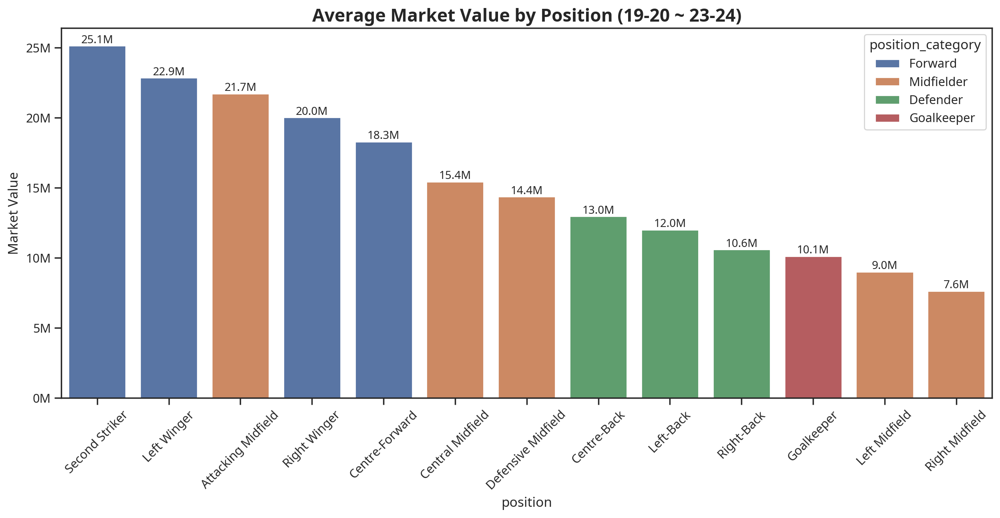

In [159]:
# y축을 M 단위로 표시하기 위한 포맷터 함수
def millions(x, pos):
    """1,000,000 단위로 나누어 M을 추가"""
    return '%1.0fM' % (x * 1e-6)

# 막대 위에 값 표시 함수 (소수점 둘째자리에서 반올림)
def add_value_labels(ax, spacing=5):
    """각 막대 위에 값 표시, 소수점 둘째 자리까지 반올림"""
    for p in ax.patches:
        value = p.get_height()
        if value > 0:  # 값이 0보다 큰 경우만 레이블 추가
            # 소수점 둘째자리에서 반올림한 값 표시
            ax.annotate(f'{round(value*1e-6, 1)}M',
                        (p.get_x() + p.get_width() / 2., value),
                        ha='center', va='center', 
                        xytext=(0, spacing),  # 텍스트를 막대 위로 조금 띄움
                        textcoords='offset points', fontsize=10)

# 그래프 생성
plt.figure(figsize=(15, 6))
ax = sns.barplot(data=value_for_pos, x="position", y="market_value_per_season", hue="position_category")

# x축 레이블 회전
plt.xticks(rotation=45)

# y축 포맷 설정 (M 단위)
ax.yaxis.set_major_formatter(ticker.FuncFormatter(millions))
ax.set_ylabel("Market Value", fontsize=12)

# 그래프 타이틀 설정
plt.title("Average Market Value by Position (19-20 ~ 23-24)", fontsize=16, fontweight="bold")

# 막대 위에 값 추가
add_value_labels(ax)

# 그래프 보여주기
plt.show()

In [160]:
value_for_pos_season = df_copy.groupby(["start_season", "position_category", "position"])["market_value_per_season"].mean().to_frame().sort_values(by="market_value_per_season", ascending=False).reset_index()

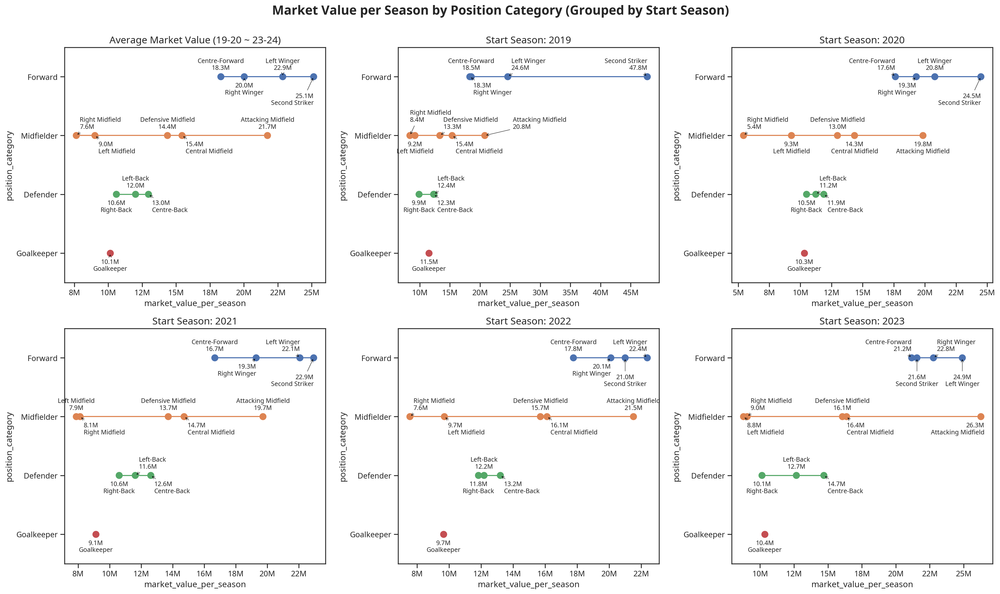

In [181]:
# Subplot을 2x3 형태로 생성
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(20, 12))
axes = axes.flatten()  # 2x3 배열을 1차원 배열로 펼침

# 첫 번째 subplot: Cleveland Dot Plot
ax = axes[0]

# 선을 연결하는 lineplot 추가
sns.lineplot(data=value_for_pos, x="market_value_per_season", y="position_category", 
             hue="position_category", estimator=None, markers="", dashes=False, legend=False, ax=ax)

# 데이터 포인트를 표시하는 stripplot 추가
sns.stripplot(data=value_for_pos, x="market_value_per_season", y="position_category", 
              hue="position_category", jitter=False, marker="o", size=10, ax=ax)

# 각 데이터포인트에 market_value_per_season 및 position 표시
for i in range(value_for_pos.shape[0]):
    x = value_for_pos["market_value_per_season"].iloc[i]
    y = value_for_pos["position_category"].iloc[i]
    market_value = value_for_pos["market_value_per_season"].iloc[i] * 1e-6  # M 단위로 변환
    position = value_for_pos["position"].iloc[i]

    offset_market_value = 10
    offset_position = 20
    text_x = 0
    ha = 'center'
    arrowprops = None

    # elif season == "2023":
    if position in ["Right Midfield"]:
        text_x = 5
        ha = "left"
        arrowprops=dict(arrowstyle="->", color='black', lw=0.5)
    elif position in ["Central Midfield", "Centre-Back", "Left Midfield"]:
        offset_market_value = -15
        offset_position = -25
        ha = "left"
        text_x = 5
        arrowprops=dict(arrowstyle="->", color='black', lw=0.5)
    elif position in ["Right-Back"]:
        offset_market_value = -15
        offset_position = -25
    elif position == "Second Striker":
        ha = "right"
        offset_market_value = -30
        offset_position = -40
        arrowprops=dict(arrowstyle="->", color='black', lw=0.5)
    elif position in ["Right Winger", "Goalkeeper"]:
        offset_market_value = -15
        offset_position = -25
        # ha = "left"
        arrowprops=dict(arrowstyle="->", color='black', lw=0.5)
    elif position in ["Left Winger"]:
        ha = "center"
        arrowprops=dict(arrowstyle="->", color='black', lw=0.5)
    
    # 상단에 market_value_per_season 값 표시
    ax.annotate(f'{market_value:.1f}M', (x, y), textcoords="offset points", xytext=(text_x, offset_market_value), ha=ha, fontsize=9, arrowprops=arrowprops)
    # 하단에 position 값 표시
    ax.annotate(position, (x, y), textcoords="offset points", xytext=(text_x, offset_position), ha=ha, fontsize=9, arrowprops=None)

# x축 포맷 설정 (M 단위)
ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f'{x*1e-6:.0f}M'))

# 그래프 타이틀 설정
ax.set_title("Average Market Value (19-20 ~ 23-24)", fontsize=14)


# 나머지 5개의 subplot: start_season별 데이터 시각화
category_order = ["Forward", "Midfielder", "Defender", "Goalkeeper"]

for i, season in enumerate(sorted(value_for_pos_season["start_season"].unique())[:5]):  # 5개의 season만 표시, 정렬된 순서로
    ax = axes[i + 1]  # 첫 번째 subplot을 사용했으므로 나머지는 i+1부터 시작
    
    # 해당 시즌의 데이터만 필터링하고 market_value_per_season 오름차순 정렬
    season_data = value_for_pos_season[value_for_pos_season["start_season"] == season].sort_values(by="market_value_per_season")
    
    # y축 순서를 category_order로 고정
    season_data["position_category"] = pd.Categorical(season_data["position_category"], categories=category_order, ordered=True)

    # 선을 연결하는 lineplot 추가 (position_category 순서를 고정)
    sns.lineplot(data=season_data, x="market_value_per_season", y="position_category", 
                 hue="position_category", hue_order=category_order, estimator=None, markers="", dashes=False, legend=False, ax=ax)
    
    # 데이터 포인트를 표시하는 stripplot 추가 (position_category 순서를 고정)
    sns.stripplot(data=season_data, x="market_value_per_season", y="position_category", 
                  hue="position_category", hue_order=category_order, jitter=False, marker="o", size=10, ax=ax)

    # 각 데이터포인트에 market_value_per_season 및 position 표시
    for j in range(season_data.shape[0]):
        x = season_data["market_value_per_season"].iloc[j]
        y = season_data["position_category"].iloc[j]
        market_value = season_data["market_value_per_season"].iloc[j] * 1e-6  # M 단위로 변환
        position = season_data["position"].iloc[j]
        
        offset_market_value = 10
        offset_position = 20
        text_x = 0
        ha = 'center'
        arrowprops = None

        if season == "2019":
            if position in ["Left Winger", "Left-Back", "Defensive Midfield"]:
                text_x = 5
                ha = "left"
                arrowprops=dict(arrowstyle="->", color='black', lw=0.5)
            elif position in ["Right Midfield"]:
                ha = "left"
                offset_market_value = 20
                offset_position = 30
                arrowprops=dict(arrowstyle="->", color='black', lw=0.5)
            elif position in ["Central Midfield", "Right Winger", "Centre-Back"]:
                offset_market_value = -15
                offset_position = -25
                ha = "left"
                text_x = 5
                arrowprops=dict(arrowstyle="->", color='black', lw=0.5)
            elif position in ["Attacking Midfield"]:
                ha = "left"
                text_x = 40
                arrowprops=dict(arrowstyle="->", color='black', lw=0.5)
            elif position in ["Right-Back", "Left Midfield", "Goalkeeper"]:
                offset_market_value = -15
                offset_position = -25
            elif position in ["Second Striker"]:
                ha = "right"
                arrowprops=dict(arrowstyle="->", color='black', lw=0.5)
        
        elif season == "2020":
            if position in ["Left-Back", "Right Midfield"]:
                text_x = 5
                ha = "left"
                arrowprops=dict(arrowstyle="->", color='black', lw=0.5)
            elif position in ["Centre-Back"]:
                offset_market_value = -15
                offset_position = -25
                ha = "left"
                text_x = 5
                arrowprops=dict(arrowstyle="->", color='black', lw=0.5)
            elif position in ["Right-Back", "Left Midfield", "Central Midfield", "Attacking Midfield", "Goalkeeper"]:
                offset_market_value = -15
                offset_position = -25
            elif position == "Second Striker":
                ha = "right"
                offset_market_value = -30
                offset_position = -40
                arrowprops=dict(arrowstyle="->", color='black', lw=0.5)
            elif position in ["Right Winger"]:
                ha = "right"
                offset_market_value = -15
                offset_position = -25
                arrowprops=dict(arrowstyle="->", color='black', lw=0.5)
            elif position in ["Centre-Forward"]:
                ha = "right"
                arrowprops=dict(arrowstyle="->", color='black', lw=0.5)

        elif season == "2021":
            if position in ["Left-Back", "Left Midfiled"]:
                text_x = 5
                ha = "left"
                arrowprops=dict(arrowstyle="->", color='black', lw=0.5)
            elif position in ["Central Midfield", "Centre-Back", "Right Midfield"]:
                offset_market_value = -15
                offset_position = -25
                ha = "left"
                text_x = 5
                arrowprops=dict(arrowstyle="->", color='black', lw=0.5)
            elif position in ["Right-Back", "Goalkeeper"]:
                offset_market_value = -15
                offset_position = -25
            elif position == "Second Striker":
                ha = "right"
                offset_market_value = -30
                offset_position = -40
                arrowprops=dict(arrowstyle="->", color='black', lw=0.5)
            elif position in ["Right Winger"]:
                offset_market_value = -15
                offset_position = -25
                ha = "right"
                arrowprops=dict(arrowstyle="->", color='black', lw=0.5)
            elif position in ["Left Winger"]:
                ha = "right"
                arrowprops=dict(arrowstyle="->", color='black', lw=0.5)

        elif season == "2022":
            if position in ["Right Midfield"]:
                text_x = 5
                ha = "left"
                arrowprops=dict(arrowstyle="->", color='black', lw=0.5)
            elif position in ["Central Midfield", "Centre-Back", "Left Midfield"]:
                offset_market_value = -15
                offset_position = -25
                ha = "left"
                text_x = 5
                arrowprops=dict(arrowstyle="->", color='black', lw=0.5)
            elif position in ["Right-Back", "Goalkeeper"]:
                offset_market_value = -15
                offset_position = -25
            elif position == "Second Striker":
                ha = "center"
                offset_market_value = -30
                offset_position = -40
                arrowprops=dict(arrowstyle="->", color='black', lw=0.5)
            elif position in ["Right Winger"]:
                offset_market_value = -15
                offset_position = -25
                ha = "right"
                arrowprops=dict(arrowstyle="->", color='black', lw=0.5)
            elif position in ["Left Winger"]:
                ha = "right"
                arrowprops=dict(arrowstyle="->", color='black', lw=0.5)

        elif season == "2023":
            if position in ["Right Midfield", "Right Winger"]:
                text_x = 5
                ha = "left"
                arrowprops=dict(arrowstyle="->", color='black', lw=0.5)
            elif position in ["Centre-Back", "Left Midfield"]:
                offset_market_value = -15
                offset_position = -25
                ha = "left"
                text_x = 5
                arrowprops=dict(arrowstyle="->", color='black', lw=0.5)
            elif position in ["Right-Back", "Goalkeeper"]:
                offset_market_value = -15
                offset_position = -25
            elif position in ["Left Winger", "Second Striker"]:
                ha = "center"
                offset_market_value = -30
                offset_position = -40
                arrowprops=dict(arrowstyle="->", color='black', lw=0.5)
            elif position in ["Central Midfield"]:
                offset_market_value = -15
                offset_position = -25
                ha = "left"
                arrowprops=dict(arrowstyle="->", color='black', lw=0.5)
            elif position in ["Right Winger"]:
                ha = "center"
                arrowprops=dict(arrowstyle="->", color='black', lw=0.5)
            elif position in ["Attacking Midfield"]:
                offset_market_value = -15
                offset_position = -25
                ha = "right"
                text_x = 5
            elif position in ["Centre-Forward"]:
                ha = "right"
                arrowprops=dict(arrowstyle="->", color='black', lw=0.5)

        # 상단에 market_value_per_season 값 표시
        ax.annotate(f'{market_value:.1f}M', (x, y), textcoords="offset points", xytext=(text_x, offset_market_value), ha=ha, fontsize=9, arrowprops=arrowprops)

        # 하단에 position 값 표시
        ax.annotate(position, (x, y), textcoords="offset points", xytext=(text_x, offset_position), ha=ha, fontsize=9, arrowprops=None)

    # x축 포맷 설정 (M 단위)
    ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f'{x*1e-6:.0f}M'))

    # subplot 제목 설정
    ax.set_title(f'Start Season: {season}', fontsize=14)

# # 남은 빈 subplot은 숨김 처리
# for i in range(5, len(axes)):
#     fig.delaxes(axes[i])

# 전체 그래프 타이틀 설정
fig.suptitle("Market Value per Season by Position Category (Grouped by Start Season)", fontsize=18, fontweight="bold")

# 레이아웃 조정 및 그래프 보여주기
plt.tight_layout(rect=[0, 0, 1, 0.98])  # 타이틀을 위해 여백 추가
plt.show()


#### 7-3-4. 시즌별 몸값 분포 확인

In [182]:
print("원본 df shape :", df_copy.shape)
print("20M 유로 넘는 선수들 :", df_copy[df_copy.market_value_per_season >= 20000000].shape)

원본 df shape : (6950, 40)
20M 유로 넘는 선수들 : (1810, 40)


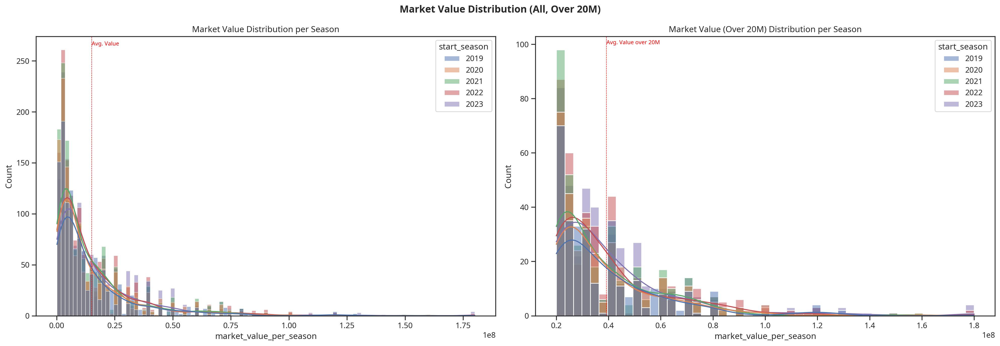

In [186]:
# 시즌별 선수 몸값 분포 확인
fig, axes = plt.subplots(1, 2, figsize=(20, 7))

# plt.figure(figsize=(15, 8))
sns.histplot(data=df_copy, x="market_value_per_season", hue="start_season", kde=True, ax=axes[0])
avg_value = df_copy["market_value_per_season"].mean()
axes[0].axvline(x=avg_value, color="red", linestyle="--", linewidth=0.6, label="Avg. Value")
axes[0].text(avg_value, 265, 
             'Avg. Value', color='red', fontsize=8, ha='left')
axes[0].set_title("Market Value Distribution per Season", fontsize=12)

# 20M 넘는 선수들 시즌별 선수 몸값 분포 확인
sns.histplot(data=df_copy[df_copy.market_value_per_season >= 20000000], x="market_value_per_season", hue="start_season", kde=True, ax=axes[1])
avg_value_20 = df_copy[df_copy.market_value_per_season >= 20000000]["market_value_per_season"].mean()
axes[1].axvline(x=avg_value_20, color="red", linestyle="--", linewidth=0.6, label="Avg. Value over 20M")
axes[1].text(avg_value_20, 100, 
             'Avg. Value over 20M', color='red', fontsize=8, ha='left')
axes[1].set_title("Market Value (Over 20M) Distribution per Season", fontsize=12)

plt.suptitle("Market Value Distribution (All, Over 20M)", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()

### 7-4. 100M 유로 넘는 선수들 확인

In [188]:
df_copy[df_copy.market_value_per_season>=100_000_000].head(3)

,player_name,start_season,yellow_cards,red_cards,goals,assists,minutes_played,competition_code,date_of_birth,position,team_title,market_value_per_season,country,foot,height_in_cm,xA,shots,key_passes,npG,npxG,xGChain,xGBuildup,age,aggression,goals_90,assists_90,aggression_90,npG_90,npxG_90,xA_90,shots_90,key_passes_90,xGChain_90,xGBuildup_90,npG_per_shot,npxG_per_shot,goal_conv,npG_conv,npG_vs_npxG,position_category
147,Jadon Sancho,2019,2.0,0.0,17.0,17.0,2292.0,bundesliga,2000-03-25,Left Winger,Borussia Dortmund,117000000.0,England,right,180.0,11.467584,52.0,69.0,17.0,10.752355,28.819598,11.866170,20,0.6,0.667539,0.667539,0.023560,0.667539,0.422213,0.450298,2.041885,2.709424,1.131660,0.465949,0.326923,0.206776,0.326923,0.326923,6.247645,Forward
558,Erling Haaland,2020,2.0,0.0,27.0,8.0,2410.0,bundesliga,2000-07-21,Centre-Forward,Borussia Dortmund,130000000.0,Norway,left,195.0,4.035448,92.0,27.0,25.0,20.567369,27.197287,5.896189,20,0.6,1.008299,0.298755,0.022407,0.933610,0.768076,0.150701,3.435685,1.008299,1.015666,0.220190,0.271739,0.223558,0.293478,0.271739,4.432631,Forward
605,Jadon Sancho,2020,0.0,0.0,8.0,12.0,2071.0,bundesliga,2000-03-25,Left Winger,Borussia Dortmund,100000000.0,England,right,180.0,8.243653,52.0,67.0,7.0,5.996706,20.981892,10.953148,21,0.0,0.347658,0.521487,0.000000,0.304201,0.260600,0.358247,2.259778,2.911637,0.911816,0.475994,0.134615,0.115321,0.153846,0.134615,1.003294,Forward


##### 7-4-1. Goals, Assists 시각화

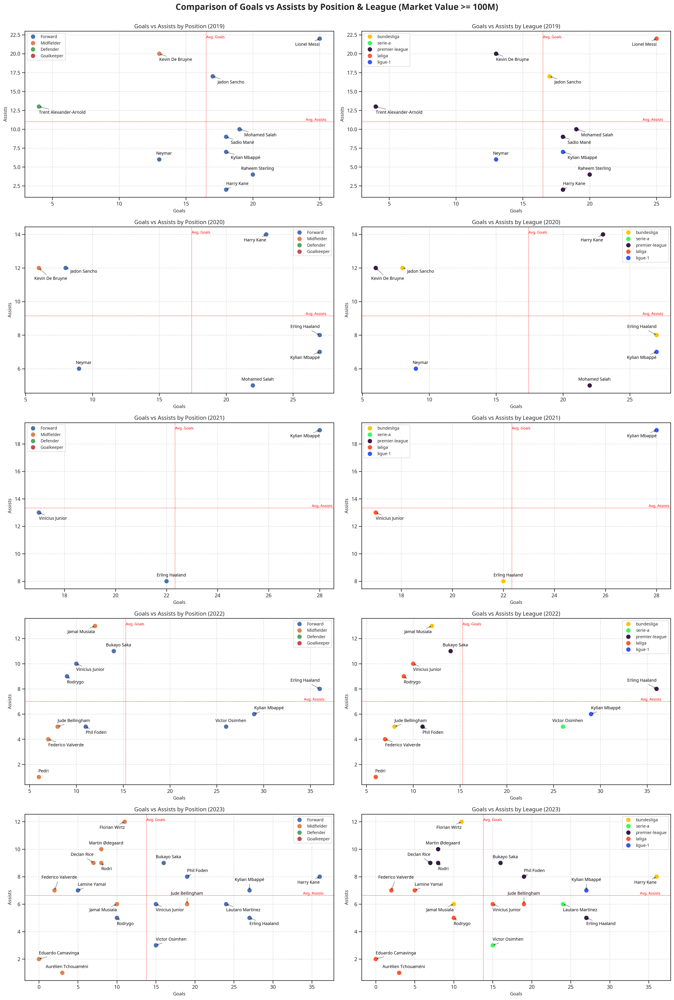

In [78]:
# 리그별 색상 팔레트 정의
palette = {
    'laliga': '#FF5733',       # 밝은 주황색
    'bundesliga': '#FFC300',      # 황금색
    'premier-league': '#381C46', # 선명한 보라색
    'serie-a': '#33FF57',      # 밝은 초록색
    'ligue-1': '#3357FF',      # 선명한 파랑색
}

# 5x2 subplot 설정 (연도별 포지션 & 리그별)
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(20, 30))

# 몸값이 100M 넘는 선수들 필터링
df_high_value_players = df_copy[df_copy["market_value_per_season"] >= 100_000_000]

hue_order_pos = ["Forward", "Midfielder", "Defender", "Goalkeeper"]
hue_order_league = ['bundesliga', 'serie-a', 'premier-league', 'laliga', 'ligue-1']

# start_season별로 데이터를 그리기 위한 준비
seasons = df_high_value_players["start_season"].unique()

# subplot index를 위한 row와 column 설정
row_idx = 0
col_idx = 0

for year in seasons:
    df_year = df_high_value_players[df_high_value_players["start_season"] == year]

    # 1번 scatterplot: 포지션별 goals vs assists
    ax_pos = axes[row_idx, col_idx]
    sns.scatterplot(data=df_year, x="goals", y="assists", 
                    hue="position_category", hue_order=hue_order_pos,
                    s=100, ax=ax_pos)

    for i in range(df_year.shape[0]):
        player_name = df_year["player_name"].iloc[i]
        x = df_year["goals"].iloc[i]
        y = df_year["assists"].iloc[i]
        # ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 10), ha='center', fontsize=9, color='black')

        if (year in ["2023"]) & (player_name in ["Jude Bellingham", "Kylian Mbappé"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 20), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2019"]) & (player_name in ["Mohamed Salah", "Sadio Mané", "Kylian Mbappé", "Jadon Sancho"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, -15), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2019"]) & (player_name in ["Harry Kane"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 10), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2020"]) & (player_name in ["Kevin De Bruyne"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(25, -25), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2020"]) & (player_name in ["Jadon Sancho"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, -10), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2022"]) & (player_name in ["Jude Bellingham", "Kylian Mbappé"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 10), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2020", "2022"]) & (player_name in ["Erling Haaland"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 15), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Eduardo Camavinga", "Lamine Yamal", "Victor Osimhen", "Phil Foden"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 10), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Rodri", "Erling Haaland", "Lautaro Martínez"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -15), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Declan Rice"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 15), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Federico Valverde"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 25), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif player_name in ["Harry Kane", "Kylian Mbappé", "Lionel Messi", "Jamal Musiala", "Florian Wirtz"]:
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -15), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
    
        elif player_name in ["Trent Alexander-Arnold", "Federico Valverde", "Kevin De Bruyne", "Vinicius Junior", "Rodrygo", "Phil Foden"]:
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -15), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))

        else:
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 10), ha='center', fontsize=9, color='black')

    # 평균 goals 및 assists 계산
    avg_goals = df_year["goals"].mean()
    avg_assists = df_year["assists"].mean()

    # 평균 goals와 assists를 붉은 점선으로 표시
    ax_pos.axhline(y=avg_assists, color='red', linestyle='--', linewidth=0.6)
    ax_pos.axvline(x=avg_goals, color='red', linestyle='--', linewidth=0.6)

    ax_pos.text(df_year["goals"].max() + 0.5, avg_assists, 'Avg. Assists', color='red', fontsize=8, va='bottom', ha='right')
    ax_pos.text(avg_goals, df_year["assists"].max() + 0.05, 'Avg. Goals', color='red', fontsize=8, ha='left')

    ax_pos.set_title(f"Goals vs Assists by Position ({year})", fontsize=12)
    ax_pos.set_xlabel("Goals", fontsize=10)
    ax_pos.set_ylabel("Assists", fontsize=10)
    ax_pos.grid(True, linestyle='--', alpha=0.7)
    ax_pos.legend(loc='best', fontsize=9)

    # 2번 scatterplot: 리그별 goals vs assists (palette 적용)
    ax_league = axes[row_idx, col_idx + 1]
    sns.scatterplot(data=df_year, x="goals", y="assists", 
                    hue="competition_code", hue_order=hue_order_league,
                    palette=palette,  # 새로운 팔레트 적용
                    s=100, ax=ax_league)


    for i in range(df_year.shape[0]):
        player_name = df_year["player_name"].iloc[i]
        x = df_year["goals"].iloc[i]
        y = df_year["assists"].iloc[i]
        # ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 10), ha='center', fontsize=9, color='black')

        if (year in ["2023"]) & (player_name in ["Jude Bellingham", "Kylian Mbappé"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 20), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2019"]) & (player_name in ["Mohamed Salah", "Sadio Mané", "Kylian Mbappé", "Jadon Sancho"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, -15), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2019"]) & (player_name in ["Harry Kane"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 10), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2020"]) & (player_name in ["Kevin De Bruyne"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(25, -25), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2020"]) & (player_name in ["Jadon Sancho"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, -10), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2022"]) & (player_name in ["Jude Bellingham", "Kylian Mbappé"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 10), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2020", "2022"]) & (player_name in ["Erling Haaland"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 15), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Eduardo Camavinga", "Lamine Yamal", "Victor Osimhen", "Phil Foden"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 10), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Rodri", "Erling Haaland", "Lautaro Martínez"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -15), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Declan Rice"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 15), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Federico Valverde"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 25), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif player_name in ["Harry Kane", "Kylian Mbappé", "Lionel Messi", "Jamal Musiala", "Florian Wirtz"]:
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -15), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
    
        elif player_name in ["Trent Alexander-Arnold", "Federico Valverde", "Kevin De Bruyne", "Vinicius Junior", "Rodrygo", "Phil Foden"]:
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -15), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))

        else:
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 10), ha='center', fontsize=9, color='black')


    # 평균 goals 및 assists 계산
    avg_goals = df_year["goals"].mean()
    avg_assists = df_year["assists"].mean()

    # 평균 goals와 assists를 붉은 점선으로 표시
    ax_league.axhline(y=avg_assists, color='red', linestyle='--', linewidth=0.6)
    ax_league.axvline(x=avg_goals, color='red', linestyle='--', linewidth=0.6)

    ax_league.text(df_year["goals"].max() + 0.5, avg_assists, 'Avg. Assists', color='red', fontsize=8, va='bottom', ha='right')
    ax_league.text(avg_goals, df_year["assists"].max() + 0.05, 'Avg. Goals', color='red', fontsize=8, ha='left')

    ax_league.set_title(f"Goals vs Assists by League ({year})", fontsize=12)
    ax_league.set_xlabel("Goals", fontsize=10)
    ax_league.set_ylabel("Assists", fontsize=10)
    ax_league.grid(True, linestyle='--', alpha=0.7)
    ax_league.legend(loc='best', fontsize=9)

    # 다음 subplot으로 넘어가기
    row_idx += 1
    if row_idx >= 5:
        row_idx = 0
        col_idx += 2

# 전체 레이아웃 조정 및 그래프 보여주기
plt.suptitle("Comparison of Goals vs Assists by Position & League (Market Value >= 100M)", fontsize=18, fontweight="bold")
plt.tight_layout(rect=[0, 0, 1, 0.98])  # 제목 공간을 고려한 layout 조정
plt.show()


In [79]:
#  연도, 리그별 market_value 합산 및 비중 (%) 구하기
df_high_player_grouped = df_high_value_players.groupby(["start_season", "competition_code"])["market_value_per_season"].sum().to_frame().reset_index()
df_high_value_players_grouped = pd.merge(df_high_player_grouped, df_high_player_grouped.groupby(["start_season"])["market_value_per_season"].sum(), how="left", on="start_season")
df_high_value_players_grouped.rename(columns={"market_value_per_season_x" : "market_value_per_season", "market_value_per_season_y" : "total_market_value"}, inplace=True)
df_high_value_players_grouped["pct"] = round(df_high_value_players_grouped["market_value_per_season"] / df_high_value_players_grouped["total_market_value"] * 100, 2)
df_high_value_players_grouped = df_high_value_players_grouped.sort_values(by=["start_season", "market_value_per_season"], ascending=[True, True])

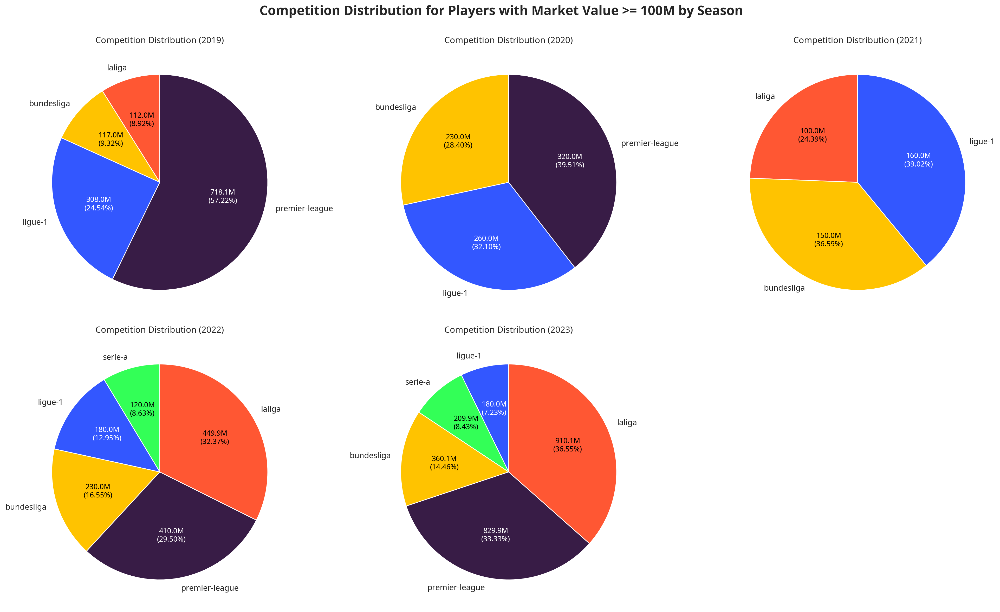

In [80]:
# 연도에 따른 100M 넘는 선수들의 리그별 비중 확인

# subplots 설정 (2행 3열)
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(20, 12))

# competition_code별 색상 지정 (hue_order와 맞춤)
hue_order = ['bundesliga', 'serie-a', 'premier-league', 'laliga', 'ligue-1']
# color_palette = sns.color_palette(n_colors=len(hue_order))

# 색상을 competition_code와 연결하는 딕셔너리 생성
# color_dict = dict(zip(hue_order, color_palette))

color_dict = {
    'laliga': '#FF5733',       # 밝은 주황색
    'bundesliga': '#FFC300',      # 황금색
    'premier-league': '#381C46', # 선명한 보라색
    'serie-a': '#33FF57',      # 밝은 초록색
    'ligue-1': '#3357FF',      # 선명한 파랑색
}

# start_season별로 데이터를 그리기 위한 준비
seasons = df_high_value_players_grouped["start_season"].unique()

# 각 연도별로 데이터를 pie chart로 그리기
row_idx = 0
col_idx = 0

for year in seasons:
    # 해당 start_season에 해당하는 데이터 필터링
    df_year = df_high_value_players_grouped[df_high_value_players_grouped["start_season"] == year]
    
    # competition_code별 market_value_per_season 합계와 퍼센트 가져오기
    comp_market_values = df_year["market_value_per_season"]
    comp_labels = df_year["competition_code"]
    comp_pct = df_year["pct"]
    
    # pie chart 그리기 (색상과 비율을 정렬된 순서대로 설정)
    colors = [color_dict[comp] for comp in comp_labels]
    
    ax = axes[row_idx, col_idx]

    # market_value_per_season과 pct를 정확히 표시하는 함수
    def autopct_format(pct, all_values):
        absolute = int(pct / 100. * sum(all_values))
        return f"{absolute / 1e6:.1f}M\n({pct:.2f}%)"

    # 파이차트 생성
    wedges, texts, autotexts = ax.pie(
        comp_pct,  # 이미 계산된 pct 값 사용
        labels=comp_labels,
        autopct=lambda pct: autopct_format(pct, comp_market_values),
        startangle=90,
        colors=colors
    )

    # # 텍스트 속성 설정
    # for text in autotexts:
    #     text.set_fontsize(10)
    #     text.set_color('black')


    # 텍스트 속성 설정
    for i, text in enumerate(autotexts):
        text.set_fontsize(10)
        if comp_labels.iloc[i] in ['premier-league', 'ligue-1']:
            text.set_color('white')  # premier-league는 흰색으로 설정
        else:
            text.set_color('black')


    # 그래프 제목 설정
    ax.set_title(f"Competition Distribution ({year})", fontsize=12)

    # subplot index 업데이트
    col_idx += 1
    if col_idx >= 3:
        col_idx = 0
        row_idx += 1

# 마지막 빈 subplot 없애기
if len(seasons) < 6:
    fig.delaxes(axes[1, 2])

# 전체 레이아웃 조정 및 그래프 보여주기
plt.suptitle("Competition Distribution for Players with Market Value >= 100M by Season", fontsize=18, fontweight="bold")
plt.tight_layout(rect=[0, 0, 1, 0.98])  # 제목 공간을 고려한 layout 조정
plt.show()



##### 7-4-2. 공격포인트 합산 시각화

In [81]:
df_high_value_players["g+a"] = df_high_value_players["goals"] + df_high_value_players["assists"]

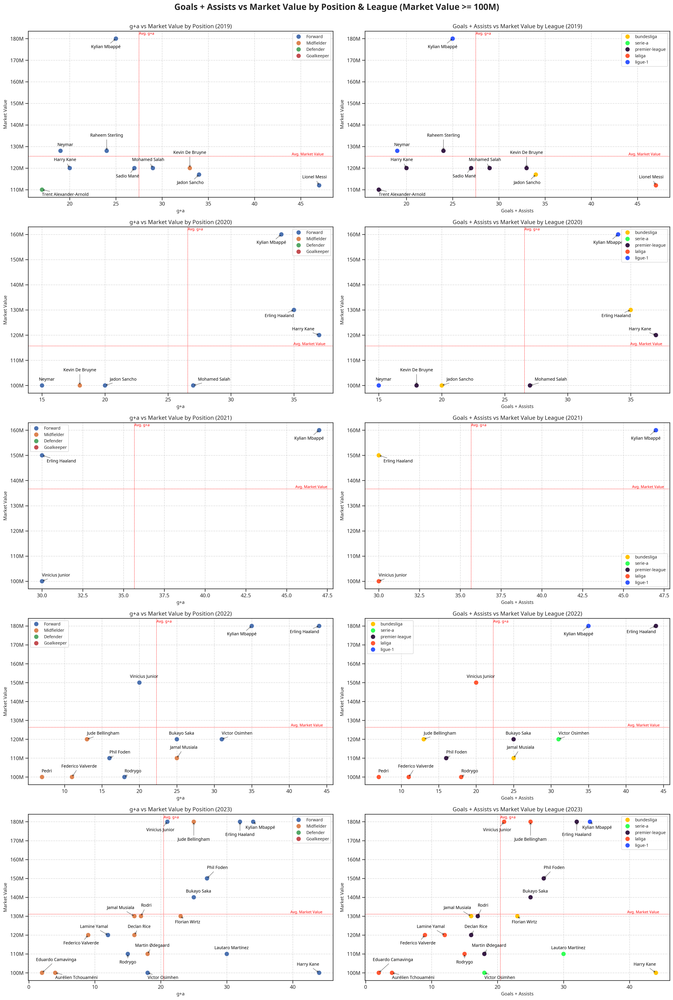

In [82]:
# 5x2 subplot 설정 (포지션 & 리그별 market_value_per_season vs g+a)
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(20, 30))

# start_season별로 데이터를 그리기 위한 준비
seasons = df_high_value_players["start_season"].unique()

hue_order_pos = ["Forward", "Midfielder", "Defender", "Goalkeeper"]
hue_order_league = ['bundesliga', 'serie-a', 'premier-league', 'laliga', 'ligue-1']

# subplot index를 위한 row와 column 설정
row_idx = 0
col_idx = 0

for year in seasons:
    df_year = df_high_value_players[df_high_value_players["start_season"] == year]

    # 1번 scatterplot: 포지션별 market_value_per_season vs g+a
    ax_pos = axes[row_idx, col_idx]
    sns.scatterplot(data=df_year, x="g+a", y="market_value_per_season", 
                    hue="position_category", hue_order=hue_order_pos,
                    s=100, ax=ax_pos)

    for i in range(df_year.shape[0]):
        player_name = df_year["player_name"].iloc[i]
        x = df_year["g+a"].iloc[i]
        y = df_year["market_value_per_season"].iloc[i]
        # ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 10), ha='center', fontsize=9, color='black')

        if (year in ["2019"]) & (player_name in ["Jadon Sancho","Sadio Mané", "Kylian Mbappé"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, -20), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2019", "2020"]) & (player_name in ["Raheem Sterling", "Kevin De Bruyne"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 30), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2019"]) & (player_name in ["Mohamed Salah", "Harry Kane", "Lionel Messi"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(-10, 15), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2020"]) & (player_name in ["Harry Kane"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(-10, 10), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2020"]) & (player_name in ["Mohamed Salah", "Jadon Sancho"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 10), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2021"]) & (player_name in ["Vinicius Junior"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 10), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2021"]) & (player_name in ["Erling Haaland"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, -15), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))

        elif (year in ["2022"]) & (player_name in ["Federico Valverde", "Jamal Musiala"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(15, 20), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2022"]) & (player_name in ["Rodrygo", "Phil Foden", "Jude Bellingham", "Victor Osimhen"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 10), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2020", "2022"]) & (player_name in ["Erling Haaland"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -15), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
            
        elif (year in ["2023"]) & (player_name in ["Jude Bellingham"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -40), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Kylian Mbappé", "Florian Wirtz"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(15, -15), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Vinicius Junior", "Federico Valverde"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(-15, -20), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Erling Haaland"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -30), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Lamine Yamal", "Jamal Musiala", "Harry Kane"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 15), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Eduardo Camavinga"]): 
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(30, 25), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Rodri", "Phil Foden"]): 
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 20), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Martin Ødegaard", "Declan Rice"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 15), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Rodrygo"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -20), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))

        elif player_name in ["Kylian Mbappé"]:
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, -20), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif player_name in ["Trent Alexander-Arnold", "Kevin De Bruyne", "Victor Osimhen", "Aurélien Tchouaméni"]:
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -13), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        else:
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 10), ha='center', fontsize=9, color='black')

    # year별 평균 market_value_per_season 및 g+a 계산
    avg_market_value_per_season = df_year["market_value_per_season"].mean()
    avg_ga = df_year["g+a"].mean()

    # 평균 market_value_per_season와 g+a를 붉은 점선으로 표시
    ax_pos.axvline(x=avg_ga, color='red', linestyle='--', linewidth=0.6)
    ax_pos.axhline(y=avg_market_value_per_season, color='red', linestyle='--', linewidth=0.6)

    # 평균 지점에 텍스트 추가
    ax_pos.text(df_year["g+a"].max() + 0.5, avg_market_value_per_season, 'Avg. Market Value', color='red', fontsize=8, va='bottom', ha='right')
    ax_pos.text(avg_ga, df_year["market_value_per_season"].max() * (1.01), 'Avg. g+a', color='red', fontsize=8, ha='left')

    ax_pos.yaxis.set_major_formatter(ticker.FuncFormatter(millions))
    ax_pos.set_title(f"g+a vs Market Value by Position ({year})", fontsize=12)
    ax_pos.set_xlabel("g+a", fontsize=10)
    ax_pos.set_ylabel("Market Value", fontsize=10)
    ax_pos.grid(True, linestyle='--', alpha=0.7)
    ax_pos.legend(loc='best', fontsize=9)

    # 2번 scatterplot: 리그별 market_value_per_season vs g+a
    ax_league = axes[row_idx, col_idx + 1]
    sns.scatterplot(data=df_year, x="g+a", y="market_value_per_season", 
                    hue="competition_code", hue_order=hue_order_league,
                    palette=palette,
                    s=100, ax=ax_league)

    for i in range(df_year.shape[0]):
        player_name = df_year["player_name"].iloc[i]
        x = df_year["g+a"].iloc[i]
        y = df_year["market_value_per_season"].iloc[i]
        # ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 10), ha='center', fontsize=9, color='black')
    
        if (year in ["2019"]) & (player_name in ["Jadon Sancho","Sadio Mané", "Kylian Mbappé"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, -20), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2019", "2020"]) & (player_name in ["Raheem Sterling", "Kevin De Bruyne"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 30), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2019"]) & (player_name in ["Mohamed Salah", "Harry Kane", "Lionel Messi"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(-10, 15), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2020"]) & (player_name in ["Harry Kane"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(-10, 10), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2020"]) & (player_name in ["Mohamed Salah", "Jadon Sancho"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 10), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2021"]) & (player_name in ["Vinicius Junior"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 10), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2021"]) & (player_name in ["Erling Haaland"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, -15), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))

        elif (year in ["2022"]) & (player_name in ["Federico Valverde", "Jamal Musiala"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(15, 20), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2022"]) & (player_name in ["Rodrygo", "Phil Foden", "Jude Bellingham", "Victor Osimhen"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 10), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2020", "2022"]) & (player_name in ["Erling Haaland"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -15), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
            
        elif (year in ["2023"]) & (player_name in ["Jude Bellingham"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -40), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Kylian Mbappé", "Florian Wirtz"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(15, -15), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Vinicius Junior", "Federico Valverde"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(-15, -20), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Erling Haaland"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -30), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Lamine Yamal", "Jamal Musiala", "Harry Kane"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 15), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Eduardo Camavinga"]): 
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(30, 25), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Rodri", "Phil Foden"]): 
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 20), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Martin Ødegaard", "Declan Rice"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 15), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Rodrygo"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -20), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))

        elif player_name in ["Kylian Mbappé"]:
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, -20), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif player_name in ["Trent Alexander-Arnold", "Kevin De Bruyne", "Victor Osimhen", "Aurélien Tchouaméni"]:
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -13), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        else:
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 10), ha='center', fontsize=9, color='black')

    # year별 평균 market_value_per_season 및 g+a 계산
    avg_market_value_per_season = df_year["market_value_per_season"].mean()
    avg_ga = df_year["g+a"].mean()

    # 평균 market_value_per_season와 g+a를 붉은 점선으로 표시
    ax_league.axvline(x=avg_ga, color='red', linestyle='--', linewidth=0.6)
    ax_league.axhline(y=avg_market_value_per_season, color='red', linestyle='--', linewidth=0.6)

    # 평균 지점에 텍스트 추가
    ax_league.text(df_year["g+a"].max() + 0.5, avg_market_value_per_season, 'Avg. Market Value', color='red', fontsize=8, va='bottom', ha='right')
    ax_league.text(avg_ga, df_year["market_value_per_season"].max() * (1.01), 'Avg. g+a', color='red', fontsize=8, ha='left')

    ax_league.yaxis.set_major_formatter(ticker.FuncFormatter(millions))
    ax_league.set_title(f"Goals + Assists vs Market Value by League ({year})", fontsize=12)
    ax_league.set_xlabel("Goals + Assists", fontsize=10)
    ax_league.set_ylabel("Market Value", fontsize=10)
    ax_league.grid(True, linestyle='--', alpha=0.7)
    ax_league.legend(loc='best', fontsize=9)

    # 다음 subplot으로 넘어가기
    row_idx += 1
    if row_idx >= 5:
        row_idx = 0
        col_idx += 2

# 전체 레이아웃 조정 및 그래프 보여주기
plt.suptitle("Goals + Assists vs Market Value by Position & League (Market Value >= 100M)", fontsize=18, fontweight="bold")
plt.tight_layout(rect=[0, 0, 1, 0.98])  # 제목 공간을 고려한 layout 조정
plt.show()


#### 7-4-3. 포지션별 평균 market_value_per_season

In [83]:
# 포지션별 평균 몸값 구해본다
value_for_pos = df_copy.groupby(["position"])["market_value_per_season"].mean().to_frame().sort_values(by="market_value_per_season", ascending=False).reset_index()
value_for_pos

,position,market_value_per_season
0,Second Striker,2.283556e+07
1,Left Winger,1.964591e+07
2,Attacking Midfield,1.906176e+07
3,Right Winger,1.773068e+07
4,Centre-Forward,1.505150e+07
5,Central Midfield,1.398927e+07
6,Defensive Midfield,1.284418e+07
7,Centre-Back,1.194572e+07
8,Left-Back,1.078206e+07
9,Right-Back,9.494374e+06


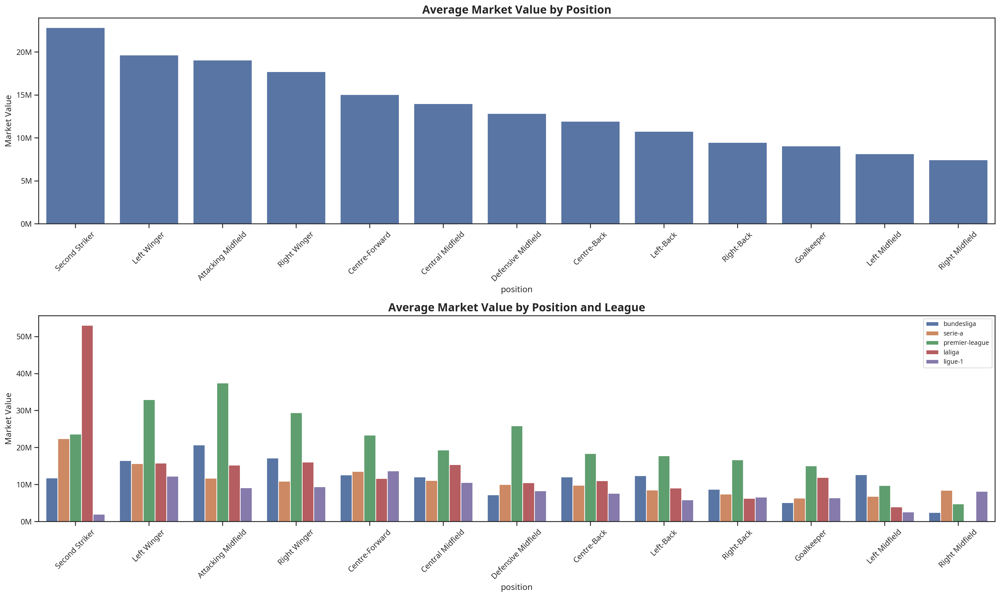

In [84]:
# 2행 1열의 subplot 생성
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(20, 12))

# 첫 번째 subplot: position별 market_value_per_season
sns.barplot(data=value_for_pos, x="position", y="market_value_per_season", ax=axes[0])
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45)
axes[0].set_title("Average Market Value by Position", fontsize=16, fontweight="bold")

# 두 번째 subplot: position별 market_value_per_season이 큰 순서대로, 검은 선 제거
# position별로 market_value_per_season의 평균을 기준으로 정렬
df_sorted = df_copy.groupby("position").mean(numeric_only=True).sort_values(by="market_value_per_season", ascending=False).reset_index()

# 정렬된 df를 기준으로 barplot 그리기 (검은 선인 error bar를 없애기 위해 ci=None 추가)
sns.barplot(data=df_copy, 
            x="position", y="market_value_per_season", hue="competition_code",
            order=df_sorted["position"], ci=None, ax=axes[1])

# x축 레이블 기울이기
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45)

# y축을 12M 형식으로 표시
axes[0].get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}M".format(int(x / 1e6))))
axes[0].set_ylabel("Market Value", fontsize=12)
axes[1].get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}M".format(int(x / 1e6))))
axes[1].set_ylabel("Market Value", fontsize=12)
axes[1].legend(loc='best', fontsize=9)

# 두 번째 subplot 제목 설정
axes[1].set_title("Average Market Value by Position and League", fontsize=16, fontweight="bold")

# 전체 레이아웃 조정 및 그래프 보여주기
plt.tight_layout()
plt.show()


In [85]:
# Second Striker 몸값 비싼 순위 Top 5
df_copy[df_copy.position=="Second Striker"].sort_values(by=["market_value_per_season", "start_season"], ascending=[False, False]).head(5)

,player_name,start_season,yellow_cards,red_cards,goals,assists,minutes_played,competition_code,date_of_birth,position,team_title,market_value_per_season,country,foot,height_in_cm,xG,xA,shots,key_passes,xGChain,xGBuildup,age,aggression,90s,goals_90,assists_90,aggression_90,xG_90,xA_90,shots_90,key_passes_90,xGChain_90,xGBuildup_90,xG_per_shot,goal_conv,xG_vs_goal,position_category
7050,João Félix,2019,6.0,0.0,6.0,1.0,1746.0,laliga,1999-11-10,Second Striker,Atletico Madrid,81000000.0,Portugal,right,181.0,7.972744,2.608327,64.0,15.0,11.141765,2.484983,20,1.8,19.4,0.31,0.05,0.09,0.41,0.13,3.30,0.77,0.57,0.13,0.12,0.09,1.972744,Forward
7477,João Félix,2020,6.0,0.0,7.0,6.0,1571.0,laliga,1999-11-10,Second Striker,Atletico Madrid,80000000.0,Portugal,right,181.0,5.802790,4.210872,39.0,21.0,11.091057,4.761939,21,1.8,17.5,0.40,0.34,0.10,0.33,0.24,2.23,1.20,0.63,0.27,0.15,0.18,-1.197210,Forward
2458,Paulo Dybala,2019,5.0,0.0,11.0,11.0,2165.0,serie-a,1993-11-15,Second Striker,Juventus,72000000.0,Argentina,left,177.0,9.310343,7.191226,100.0,69.0,19.916581,9.562889,26,1.5,24.1,0.46,0.46,0.06,0.39,0.30,4.15,2.86,0.83,0.40,0.09,0.11,-1.689657,Forward
7909,João Félix,2021,3.0,0.0,8.0,4.0,1262.0,laliga,1999-11-10,Second Striker,Atletico Madrid,70000000.0,Portugal,right,181.0,6.421432,4.142436,39.0,19.0,10.240180,2.359791,22,0.9,14.0,0.57,0.29,0.06,0.46,0.30,2.79,1.36,0.73,0.17,0.16,0.21,-1.578568,Forward
6077,João Félix,2022,1.0,1.0,4.0,0.0,942.0,premier-league,1999-11-10,Second Striker,Chelsea,50000000.0,Portugal,right,181.0,4.288620,0.646605,46.0,6.0,5.620456,2.035909,23,1.0,10.5,0.38,0.00,0.10,0.41,0.06,4.38,0.57,0.54,0.19,0.09,0.09,0.288620,Forward


In [86]:
# Left Winger 몸값 비싼 순위 Top 5
df_copy[df_copy.position=="Left Winger"].sort_values(by=["market_value_per_season", "start_season"], ascending=[False, False]).head(5)

,player_name,start_season,yellow_cards,red_cards,goals,assists,minutes_played,competition_code,date_of_birth,position,team_title,market_value_per_season,country,foot,height_in_cm,xG,xA,shots,key_passes,xGChain,xGBuildup,age,aggression,90s,goals_90,assists_90,aggression_90,xG_90,xA_90,shots_90,key_passes_90,xGChain_90,xGBuildup_90,xG_per_shot,goal_conv,xG_vs_goal,position_category
9058,Vinicius Junior,2023,7.0,0.0,15.0,6.0,1875.0,laliga,2000-07-12,Left Winger,Real Madrid,180000000.0,Brazil,right,176.0,15.999082,4.433579,78.0,31.0,20.517532,4.835082,24,2.1,20.8,0.72,0.29,0.10,0.77,0.21,3.75,1.49,0.99,0.23,0.21,0.19,0.999082,Forward
8577,Vinicius Junior,2022,10.0,1.0,10.0,10.0,2833.0,laliga,2000-07-12,Left Winger,Real Madrid,150000000.0,Brazil,right,176.0,10.869106,9.859566,77.0,64.0,25.334139,9.522749,23,3.7,31.5,0.32,0.32,0.12,0.35,0.31,2.44,2.03,0.80,0.30,0.14,0.13,0.869106,Forward
4758,Raheem Sterling,2019,5.0,0.0,20.0,4.0,2660.0,premier-league,1994-12-08,Left Winger,Manchester City,128000000.0,England,right,170.0,19.799912,7.208590,100.0,48.0,31.442028,10.186004,25,1.5,29.6,0.68,0.14,0.05,0.67,0.24,3.38,1.62,1.06,0.34,0.20,0.20,-0.200088,Forward
9416,Neymar,2019,4.0,0.0,13.0,6.0,1322.0,ligue-1,1992-02-05,Left Winger,Paris Saint Germain,128000000.0,Brazil,right,175.0,14.725106,5.246025,70.0,38.0,21.302691,7.206127,28,1.2,14.7,0.88,0.41,0.08,1.00,0.36,4.76,2.59,1.45,0.49,0.21,0.19,1.725106,Forward
4784,Sadio Mané,2019,3.0,0.0,18.0,9.0,2755.0,premier-league,1992-04-10,Left Winger,Liverpool,120000000.0,Senegal,right,174.0,14.577481,7.235698,77.0,59.0,25.073198,6.767018,28,0.9,30.6,0.59,0.29,0.03,0.48,0.24,2.52,1.93,0.82,0.22,0.19,0.23,-3.422519,Forward


In [87]:
# Attacking Midfield 몸값 비싼 순위 Top 5
df_copy[df_copy.position=="Attacking Midfield"].sort_values(by=["market_value_per_season", "start_season"], ascending=[False, False]).head(5)

,player_name,start_season,yellow_cards,red_cards,goals,assists,minutes_played,competition_code,date_of_birth,position,team_title,market_value_per_season,country,foot,height_in_cm,xG,xA,shots,key_passes,xGChain,xGBuildup,age,aggression,90s,goals_90,assists_90,aggression_90,xG_90,xA_90,shots_90,key_passes_90,xGChain_90,xGBuildup_90,xG_per_shot,goal_conv,xG_vs_goal,position_category
8868,Jude Bellingham,2023,5.0,1.0,19.0,6.0,2324.0,laliga,2003-06-29,Attacking Midfield,Real Madrid,180000000.0,England,right,186.0,12.974516,5.894493,63.0,48.0,27.422402,15.474830,21,2.2,25.8,0.74,0.23,0.09,0.50,0.23,2.44,1.86,1.06,0.60,0.21,0.30,-6.025484,Midfielder
1957,Florian Wirtz,2023,3.0,0.0,11.0,12.0,2384.0,bundesliga,2003-05-03,Attacking Midfield,Bayer Leverkusen,130000000.0,Germany,right,177.0,9.357272,8.886626,71.0,72.0,28.521584,15.226114,21,0.9,26.5,0.42,0.45,0.03,0.35,0.34,2.68,2.72,1.08,0.57,0.13,0.15,-1.642728,Midfielder
1991,Jamal Musiala,2023,2.0,0.0,10.0,6.0,1767.0,bundesliga,2003-02-26,Attacking Midfield,Bayern Munich,130000000.0,Germany,right,184.0,8.374677,6.257946,58.0,41.0,24.165847,11.269792,21,0.6,19.6,0.51,0.31,0.03,0.43,0.32,2.96,2.09,1.23,0.57,0.14,0.17,-1.625323,Midfielder
1549,Jude Bellingham,2022,8.0,0.0,8.0,5.0,2692.0,bundesliga,2003-06-29,Attacking Midfield,Borussia Dortmund,120000000.0,England,right,186.0,8.504038,4.233295,65.0,34.0,24.581587,17.165962,20,2.4,29.9,0.27,0.17,0.08,0.28,0.14,2.17,1.14,0.82,0.57,0.13,0.12,0.504038,Midfielder
4648,Kevin De Bruyne,2019,3.0,0.0,13.0,20.0,2800.0,premier-league,1991-06-28,Attacking Midfield,Manchester City,120000000.0,Belgium,right,181.0,8.106427,20.620713,100.0,133.0,37.798304,19.244827,29,0.9,31.1,0.42,0.64,0.03,0.26,0.66,3.22,4.28,1.22,0.62,0.08,0.13,-4.893573,Midfielder


In [88]:
# Right Winger 몸값 비싼 순위 Top 5
df_copy[df_copy.position=="Right Winger"].sort_values(by=["market_value_per_season", "start_season"], ascending=[False, False]).head(5)

,player_name,start_season,yellow_cards,red_cards,goals,assists,minutes_played,competition_code,date_of_birth,position,team_title,market_value_per_season,country,foot,height_in_cm,xG,xA,shots,key_passes,xGChain,xGBuildup,age,aggression,90s,goals_90,assists_90,aggression_90,xG_90,xA_90,shots_90,key_passes_90,xGChain_90,xGBuildup_90,xG_per_shot,goal_conv,xG_vs_goal,position_category
6739,Phil Foden,2023,2.0,0.0,19.0,8.0,2871.0,premier-league,2000-05-28,Right Winger,Manchester City,150000000.0,England,left,171.0,11.307983,8.516233,105.0,73.0,30.416967,16.998998,24,0.6,31.9,0.60,0.25,0.02,0.35,0.27,3.29,2.29,0.95,0.53,0.11,0.18,-7.692017,Forward
6410,Bukayo Saka,2023,4.0,0.0,16.0,9.0,2936.0,premier-league,2001-09-05,Right Winger,Arsenal,140000000.0,England,left,178.0,16.807056,11.325986,107.0,89.0,30.357597,13.228620,23,1.2,32.6,0.49,0.28,0.04,0.52,0.35,3.28,2.73,0.93,0.41,0.16,0.15,0.807056,Forward
8884,Lamine Yamal,2023,3.0,0.0,5.0,7.0,2196.0,laliga,2007-07-13,Right Winger,Barcelona,120000000.0,Spain,left,180.0,5.792876,6.701532,58.0,39.0,22.475352,12.034276,17,0.9,24.4,0.20,0.29,0.04,0.24,0.27,2.38,1.60,0.92,0.49,0.10,0.09,0.792876,Forward
5887,Bukayo Saka,2022,6.0,0.0,14.0,11.0,3194.0,premier-league,2001-09-05,Right Winger,Arsenal,120000000.0,England,left,178.0,11.300050,7.042981,89.0,75.0,23.583177,11.603280,22,1.8,35.5,0.39,0.31,0.05,0.32,0.20,2.51,2.11,0.66,0.33,0.13,0.16,-2.699950,Forward
4709,Mohamed Salah,2019,1.0,0.0,19.0,10.0,2888.0,premier-league,1992-06-15,Right Winger,Liverpool,120000000.0,Egypt,left,175.0,20.663322,8.726042,132.0,60.0,31.374189,8.425027,28,0.3,32.1,0.59,0.31,0.01,0.64,0.27,4.11,1.87,0.98,0.26,0.16,0.14,1.663322,Forward


### 7-5. `Age` 분석

#### 7-5-1. 전체, 20M 유로 이상, 100M 유로 이상 몸값인 선수들끼리 비교

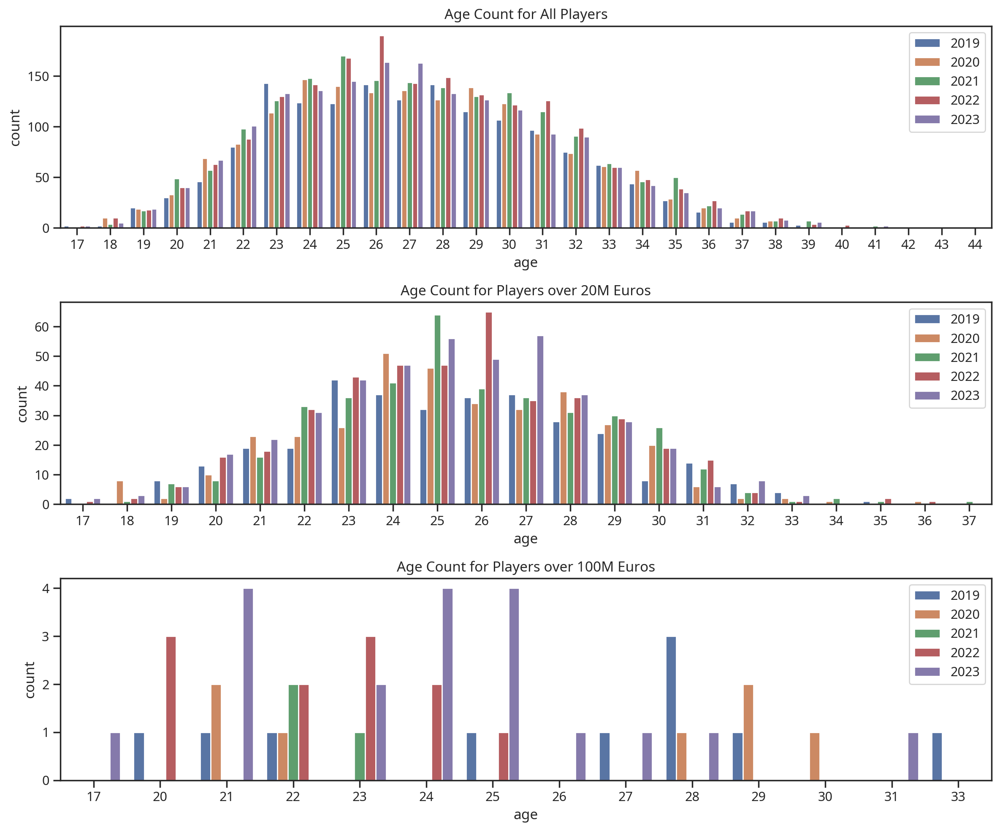

In [89]:
nrows, ncols = 3, 1
fig, axes = plt.subplots(nrows, ncols, figsize=(12, 10))

hue_order = ["2019", "2020", "2021", "2022", "2023"]
# flatten()을 통해axes를 1차원 array로 펴줘야 한다
# axes = axes.T.flatten()

g1 = sns.countplot(data=df, x="age", hue="start_season", hue_order=hue_order, ax=axes[0])
g2 = sns.countplot(data=df[df.market_value_per_season >= 20000000], x="age", hue="start_season", hue_order=hue_order, ax=axes[1])
g3 = sns.countplot(data=df_high_value_players, x="age", hue="start_season", hue_order=hue_order, ax=axes[2])

g1.set_title("Age Count for All Players")
g2.set_title("Age Count for Players over 20M Euros")
g3.set_title("Age Count for Players over 100M Euros")

g1.legend()
g2.legend()
g3.legend()

plt.tight_layout()
plt.show()


##### 7-5-2. 100M 유로 넘는 선수들 공격포인트와 `age` 비교

In [90]:
df_high_value_players.groupby("start_season")["age"].mean()

start_season
2019    26.100000
2020    25.714286
2021    22.333333
2022    22.363636
2023    23.947368
Name: age, dtype: float64

In [91]:
df_high_value_players.head(3)

,player_name,start_season,yellow_cards,red_cards,goals,assists,minutes_played,competition_code,date_of_birth,position,team_title,market_value_per_season,country,foot,height_in_cm,xG,xA,shots,key_passes,xGChain,xGBuildup,age,aggression,90s,goals_90,assists_90,aggression_90,xG_90,xA_90,shots_90,key_passes_90,xGChain_90,xGBuildup_90,xG_per_shot,goal_conv,xG_vs_goal,position_category,g+a
147,Jadon Sancho,2019,2.0,0.0,17.0,17.0,2292.0,bundesliga,2000-03-25,Left Winger,Borussia Dortmund,117000000.0,England,right,180.0,10.752355,11.467584,52.0,69.0,28.819598,11.866170,20,0.6,25.5,0.67,0.67,0.02,0.42,0.45,2.04,2.71,1.13,0.47,0.21,0.33,-6.247645,Forward,34.0
558,Erling Haaland,2020,2.0,0.0,27.0,8.0,2410.0,bundesliga,2000-07-21,Centre-Forward,Borussia Dortmund,130000000.0,Norway,left,195.0,23.598484,4.035448,92.0,27.0,27.197287,5.896189,21,0.6,26.8,1.01,0.30,0.02,0.88,0.15,3.43,1.01,1.01,0.22,0.26,0.29,-3.401516,Forward,35.0
605,Jadon Sancho,2020,0.0,0.0,8.0,12.0,2071.0,bundesliga,2000-03-25,Left Winger,Borussia Dortmund,100000000.0,England,right,180.0,6.754483,8.243653,52.0,67.0,20.981892,10.953148,21,0.0,23.0,0.35,0.52,0.00,0.29,0.36,2.26,2.91,0.91,0.48,0.13,0.15,-1.245517,Forward,20.0


In [92]:
df_high_value_players.groupby("start_season")["g+a"].mean()

start_season
2019    27.500000
2020    26.571429
2021    35.666667
2022    22.272727
2023    20.421053
Name: g+a, dtype: float64

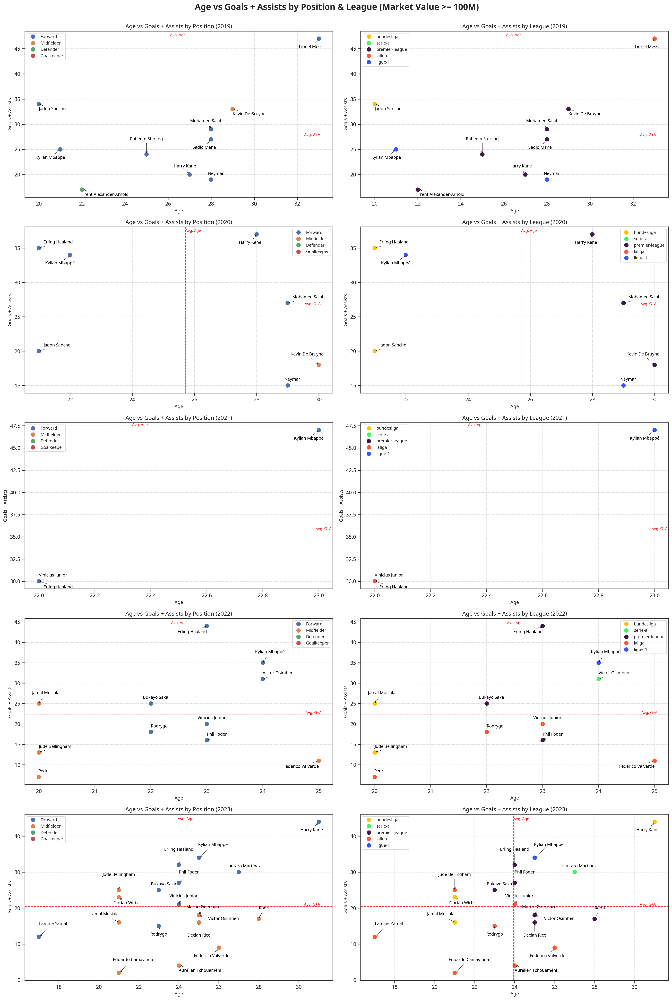

In [93]:
# 5x2 subplot 설정 (포지션 & 리그별 age vs g+a)
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(20, 30))

# start_season별로 데이터를 그리기 위한 준비
seasons = df_high_value_players["start_season"].unique()

hue_order_pos = ["Forward", "Midfielder", "Defender", "Goalkeeper"]
hue_order_league = ['bundesliga', 'serie-a', 'premier-league', 'laliga', 'ligue-1']

# subplot index를 위한 row와 column 설정
row_idx = 0
col_idx = 0

for year in seasons:
    df_year = df_high_value_players[df_high_value_players["start_season"] == year]

    # 1번 scatterplot: 포지션별 age vs g+a
    ax_pos = axes[row_idx, col_idx]
    sns.scatterplot(data=df_year, x="age", y="g+a", 
                    hue="position_category", hue_order=hue_order_pos,
                    s=100, ax=ax_pos)

    for i in range(df_year.shape[0]):
        player_name = df_year["player_name"].iloc[i]
        # x = df_year["g+a"].iloc[i]
        x = df_year["age"].iloc[i]
        y = df_year["g+a"].iloc[i]
        # ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 10), ha='center', fontsize=9, color='black')

        if (year in ["2019"]) & (player_name in ["Sadio Mané", "Kylian Mbappé", "Lionel Messi"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, -20), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2019", "2020"]) & (player_name in ["Raheem Sterling"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 30), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2019"]) & (player_name in ["Erling Haaland", "Mohamed Salah", "Harry Kane", "Lionel Messi"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(-10, 15), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2020"]) & (player_name in ["Harry Kane"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, -20), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2020"]) & (player_name in ["Kevin De Bruyne"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 20), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2020"]) & (player_name in ["Mohamed Salah", "Jadon Sancho", "Erling Haaland"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 10), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))

        elif (year in ["2021"]) & (player_name in ["Vinicius Junior"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 10), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2021"]) & (player_name in ["Erling Haaland"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, -15), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))

        elif (year in ["2022"]) & (player_name in ["Jamal Musiala", "Kylian Mbappé"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(15, 20), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2022"]) & (player_name in ["Rodrygo", "Phil Foden", "Jude Bellingham", "Victor Osimhen"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 10), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2022"]) & (player_name in ["Federico Valverde", "Erling Haaland"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -15), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
            
        elif (year in ["2023"]) & (player_name in ["Jude Bellingham", "Erling Haaland"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 30), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Florian Wirtz"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(15, -15), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Federico Valverde", "Harry Kane"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(-15, -20), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Declan Rice"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -30), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Jamal Musiala"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 15), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Victor Osimhen"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(20, -10), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Kylian Mbappé", "Lamine Yamal", "Eduardo Camavinga"]): 
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(30, 25), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Rodri", "Phil Foden"]): 
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 20), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Vinicius Junior", "Martin Ødegaard"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 15), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Rodrygo"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -20), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))

        elif player_name in ["Kylian Mbappé"]:
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, -20), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif player_name in ["Jadon Sancho", "Trent Alexander-Arnold", "Kevin De Bruyne", "Aurélien Tchouaméni"]:
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -13), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        else:
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 10), ha='center', fontsize=9, color='black')

    # year별 평균 age 및 g+a 계산
    # avg_age = df_year["age"].mean()
    avg_age = df_year["age"].mean()
    avg_ga = df_year["g+a"].mean()

    # 평균 age g+a를 붉은 점선으로 표시
    ax_pos.axvline(x=avg_age, color='red', linestyle='--', linewidth=0.6)
    ax_pos.axhline(y=avg_ga, color='red', linestyle='--', linewidth=0.6)

    # 평균 지점에 텍스트 추가
    ax_pos.text(df_year["age"].max() * (1.002), avg_ga, 'Avg. G+A', color='red', fontsize=8, va='bottom', ha='right')
    ax_pos.text(avg_age, df_year["g+a"].max() * (1.01), 'Avg. Age', color='red', fontsize=8, ha='left')


    ax_pos.set_title(f"Age vs Goals + Assists by Position ({year})", fontsize=12)
    ax_pos.set_xlabel("Age", fontsize=10)
    ax_pos.set_ylabel("Goals + Assists", fontsize=10)
    ax_pos.grid(True, linestyle='--', alpha=0.7)
    ax_pos.legend(loc='best', fontsize=9)

    # 2번 scatterplot: 리그별 age vs g+a
    ax_league = axes[row_idx, col_idx + 1]
    sns.scatterplot(data=df_year, x="age", y="g+a", 
                    hue="competition_code", hue_order=hue_order_league,
                    palette=palette,
                    s=100, ax=ax_league)

    for i in range(df_year.shape[0]):
        player_name = df_year["player_name"].iloc[i]
        # x = df_year["g+a"].iloc[i]
        x = df_year["age"].iloc[i]
        y = df_year["g+a"].iloc[i]
        # ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 10), ha='center', fontsize=9, color='black')
    
        if (year in ["2019"]) & (player_name in ["Sadio Mané", "Kylian Mbappé", "Lionel Messi"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, -20), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2019", "2020"]) & (player_name in ["Raheem Sterling"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 30), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2019"]) & (player_name in ["Erling Haaland", "Mohamed Salah", "Harry Kane", "Lionel Messi"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(-10, 15), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2020"]) & (player_name in ["Harry Kane"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, -20), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2020"]) & (player_name in ["Kevin De Bruyne"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 20), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2020"]) & (player_name in ["Mohamed Salah", "Jadon Sancho", "Erling Haaland"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 10), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))

        elif (year in ["2021"]) & (player_name in ["Vinicius Junior"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 10), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2021"]) & (player_name in ["Erling Haaland"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, -15), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))

        elif (year in ["2022"]) & (player_name in ["Jamal Musiala", "Kylian Mbappé"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(15, 20), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2022"]) & (player_name in ["Rodrygo", "Phil Foden", "Jude Bellingham", "Victor Osimhen"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 10), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2022"]) & (player_name in ["Federico Valverde", "Erling Haaland"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -15), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
            
        elif (year in ["2023"]) & (player_name in ["Jude Bellingham", "Erling Haaland"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 30), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Florian Wirtz"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(15, -15), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Federico Valverde", "Harry Kane"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(-15, -20), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Declan Rice"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -30), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Jamal Musiala"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 15), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Victor Osimhen"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(20, -10), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Kylian Mbappé", "Lamine Yamal", "Eduardo Camavinga"]): 
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(30, 25), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Rodri", "Phil Foden"]): 
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 20), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Vinicius Junior", "Martin Ødegaard"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 15), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Rodrygo"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -20), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))

        elif player_name in ["Kylian Mbappé"]:
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, -20), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif player_name in ["Jadon Sancho", "Trent Alexander-Arnold", "Kevin De Bruyne", "Aurélien Tchouaméni"]:
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -13), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        else:
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 10), ha='center', fontsize=9, color='black')

    # year별 평균 age 및 g+a 계산
    avg_age = df_year["age"].mean()
    avg_ga = df_year["g+a"].mean()

    # 평균 age와 g+a를 붉은 점선으로 표시
    ax_league.axvline(x=avg_age, color='red', linestyle='--', linewidth=0.6)
    ax_league.axhline(y=avg_ga, color='red', linestyle='--', linewidth=0.6)

    # 평균 지점에 텍스트 추가
    ax_league.text(df_year["age"].max() * (1.002), avg_ga, 'Avg. G+A', color='red', fontsize=8, va='bottom', ha='right')
    ax_league.text(avg_age, df_year["g+a"].max() * (1.01), 'Avg. Age', color='red', fontsize=8, ha='left')

    ax_league.set_title(f"Age vs Goals + Assists by League ({year})", fontsize=12)
    ax_league.set_xlabel("Age", fontsize=10)
    ax_league.set_ylabel("Goals + Assists", fontsize=10)
    ax_league.grid(True, linestyle='--', alpha=0.7)
    ax_league.legend(loc='best', fontsize=9)

    # 다음 subplot으로 넘어가기
    row_idx += 1
    if row_idx >= 5:
        row_idx = 0
        col_idx += 2

# 전체 레이아웃 조정 및 그래프 보여주기
plt.suptitle("Age vs Goals + Assists by Position & League (Market Value >= 100M)", fontsize=18, fontweight="bold")
plt.tight_layout(rect=[0, 0, 1, 0.98])  # 제목 공간을 고려한 layout 조정
plt.show()


##### 7-5-3. 100M 유로 넘는 선수들 `market_value_per_season`과 `age` 비교

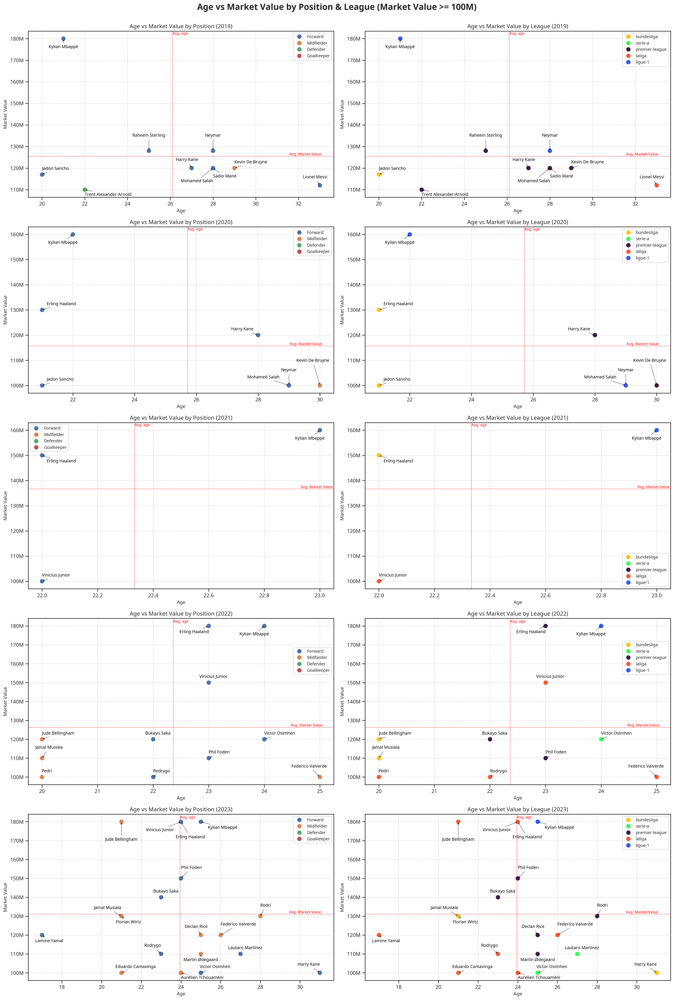

In [94]:
# 5x2 subplot 설정 (포지션 & 리그별 market_value_per_season vs age)
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(20, 30))

# start_season별로 데이터를 그리기 위한 준비
seasons = df_high_value_players["start_season"].unique()

hue_order_pos = ["Forward", "Midfielder", "Defender", "Goalkeeper"]
hue_order_league = ['bundesliga', 'serie-a', 'premier-league', 'laliga', 'ligue-1']

# subplot index를 위한 row와 column 설정
row_idx = 0
col_idx = 0

for year in seasons:
    df_year = df_high_value_players[df_high_value_players["start_season"] == year]

    # 1번 scatterplot: 포지션별 market_value_per_season vs age
    ax_pos = axes[row_idx, col_idx]
    sns.scatterplot(data=df_year, x="age", y="market_value_per_season", 
                    hue="position_category", hue_order=hue_order_pos,
                    s=100, ax=ax_pos)

    for i in range(df_year.shape[0]):
        player_name = df_year["player_name"].iloc[i]
        x = df_year["age"].iloc[i]
        y = df_year["market_value_per_season"].iloc[i]
        # ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 10), ha='center', fontsize=9, color='black')

        if (year in ["2019"]) & (player_name in ["Kylian Mbappé"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -20), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2019"]) & (player_name in ["Sadio Mané"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -20), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2019"]) & (player_name in ["Mohamed Salah"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -30), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2019"]) & (player_name in ["Jadon Sancho", "Kevin De Bruyne"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 10), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2019", "2020"]) & (player_name in ["Raheem Sterling", "Neymar"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 30), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2019"]) & (player_name in ["Harry Kane", "Lionel Messi"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(-10, 15), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2020"]) & (player_name in ["Harry Kane"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(-10, 10), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2020"]) & (player_name in ["Jadon Sancho", "Erling Haaland"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 10), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2020"]) & (player_name in ["Mohamed Salah"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(-20, 15), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2020"]) & (player_name in ["Kevin De Bruyne"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(-15, 50), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2021"]) & (player_name in ["Vinicius Junior"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 10), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2021"]) & (player_name in ["Erling Haaland"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, -15), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))

        elif (year in ["2022"]) & (player_name in ["Federico Valverde"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(15, 20), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2022"]) & (player_name in ["Jamal Musiala"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(15, 20), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2022"]) & (player_name in ["Rodrygo", "Phil Foden", "Jude Bellingham", "Victor Osimhen"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 10), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2020", "2022"]) & (player_name in ["Erling Haaland"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -15), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))

        elif (year in ["2023"]) & (player_name in ["Kylian Mbappé"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(15, -15), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Jude Bellingham"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -40), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Florian Wirtz", "Lamine Yamal"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(15, -15), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Vinicius Junior"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(-15, -20), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Erling Haaland"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(20, -35), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Jamal Musiala", "Harry Kane", "Rodrygo"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 15), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Martin Ødegaard"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -15), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Eduardo Camavinga", "Victor Osimhen"]): 
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(30, 10), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Rodri", "Phil Foden", "Federico Valverde"]): 
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 20), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Declan Rice"]):
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(-10, 15), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))

        elif player_name in ["Kylian Mbappé"]:
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, -20), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif player_name in ["Trent Alexander-Arnold", "Kevin De Bruyne", "Aurélien Tchouaméni"]:
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -13), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        else:
            ax_pos.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 10), ha='center', fontsize=9, color='black')
    # year별 평균 market_value_per_season 및 age 계산
    avg_market_value_per_season = df_year["market_value_per_season"].mean()
    avg_ga = df_year["age"].mean()

    # 평균 market_value_per_season와 age를 붉은 점선으로 표시
    ax_pos.axvline(x=avg_ga, color='red', linestyle='--', linewidth=0.6)
    ax_pos.axhline(y=avg_market_value_per_season, color='red', linestyle='--', linewidth=0.6)

    # 평균 지점에 텍스트 추가
    ax_pos.text(df_year["age"].max() * (1.002), avg_market_value_per_season, 'Avg. Market Value', color='red', fontsize=8, va='bottom', ha='right')
    ax_pos.text(avg_ga, df_year["market_value_per_season"].max() * (1.01), 'Avg. age', color='red', fontsize=8, ha='left')

    ax_pos.yaxis.set_major_formatter(ticker.FuncFormatter(millions))
    ax_pos.set_title(f"Age vs Market Value by Position ({year})", fontsize=12)
    ax_pos.set_xlabel("Age", fontsize=10)
    ax_pos.set_ylabel("Market Value", fontsize=10)
    ax_pos.grid(True, linestyle='--', alpha=0.7)
    
    # 범례 위치 조정    
    if year == "2022":
        ax_pos.legend(loc='lower right', bbox_to_anchor=(1, 0.65), fontsize=9)
    else:
        ax_pos.legend(loc="best", fontsize=9)

    # 2번 scatterplot: 리그별 market_value_per_season vs age
    ax_league = axes[row_idx, col_idx + 1]
    sns.scatterplot(data=df_year, x="age", y="market_value_per_season", 
                    hue="competition_code", hue_order=hue_order_league,
                    palette=palette,
                    s=100, ax=ax_league)

    for i in range(df_year.shape[0]):
        player_name = df_year["player_name"].iloc[i]
        x = df_year["age"].iloc[i]
        y = df_year["market_value_per_season"].iloc[i]
        # ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 10), ha='center', fontsize=9, color='black')
    
        if (year in ["2019"]) & (player_name in ["Kylian Mbappé"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -20), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2019"]) & (player_name in ["Sadio Mané"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -20), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2019"]) & (player_name in ["Mohamed Salah"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -30), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2019"]) & (player_name in ["Jadon Sancho", "Kevin De Bruyne"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 10), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2019", "2020"]) & (player_name in ["Raheem Sterling", "Neymar"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 30), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2019"]) & (player_name in ["Harry Kane", "Lionel Messi"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(-10, 15), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2020"]) & (player_name in ["Harry Kane"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(-10, 10), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2020"]) & (player_name in ["Jadon Sancho", "Erling Haaland"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 10), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2020"]) & (player_name in ["Mohamed Salah"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(-20, 15), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2020"]) & (player_name in ["Kevin De Bruyne"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(-15, 50), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2021"]) & (player_name in ["Vinicius Junior"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 10), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2021"]) & (player_name in ["Erling Haaland"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, -15), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))

        elif (year in ["2022"]) & (player_name in ["Federico Valverde"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(15, 20), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2022"]) & (player_name in ["Jamal Musiala"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(15, 20), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2022"]) & (player_name in ["Rodrygo", "Phil Foden", "Jude Bellingham", "Victor Osimhen"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 10), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2020", "2022"]) & (player_name in ["Erling Haaland"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -15), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))

        elif (year in ["2023"]) & (player_name in ["Kylian Mbappé"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(15, -15), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Jude Bellingham"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -40), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Florian Wirtz", "Lamine Yamal"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(15, -15), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Vinicius Junior"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(-15, -20), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Erling Haaland"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(20, -35), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Jamal Musiala", "Harry Kane", "Rodrygo"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 15), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Martin Ødegaard"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -15), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Eduardo Camavinga", "Victor Osimhen"]): 
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(30, 10), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Rodri", "Phil Foden", "Federico Valverde"]): 
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, 20), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif (year in ["2023"]) & (player_name in ["Declan Rice"]):
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(-10, 15), ha='center', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))

        elif player_name in ["Kylian Mbappé"]:
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, -20), ha='right', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        elif player_name in ["Trent Alexander-Arnold", "Kevin De Bruyne", "Aurélien Tchouaméni"]:
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(0, -13), ha='left', fontsize=9, color='black', arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
        else:
            ax_league.annotate(player_name, (x, y), textcoords="offset points", xytext=(10, 10), ha='center', fontsize=9, color='black')

    # year별 평균 market_value_per_season 및 age 계산
    avg_market_value_per_season = df_year["market_value_per_season"].mean()
    avg_ga = df_year["age"].mean()

    # 평균 market_value_per_season와 age를 붉은 점선으로 표시
    ax_league.axvline(x=avg_ga, color='red', linestyle='--', linewidth=0.6)
    ax_league.axhline(y=avg_market_value_per_season, color='red', linestyle='--', linewidth=0.6)

    # 평균 지점에 텍스트 추가
    ax_league.text(df_year["age"].max() * (1.002), avg_market_value_per_season, 'Avg. Market Value', color='red', fontsize=8, va='bottom', ha='right')
    ax_league.text(avg_ga, df_year["market_value_per_season"].max() * (1.01), 'Avg. age', color='red', fontsize=8, ha='left')

    ax_league.yaxis.set_major_formatter(ticker.FuncFormatter(millions))
    ax_league.set_title(f"Age vs Market Value by League ({year})", fontsize=12)
    ax_league.set_xlabel("Age", fontsize=10)
    ax_league.set_ylabel("Market Value", fontsize=10)
    ax_league.grid(True, linestyle='--', alpha=0.7)
    # ax_league.legend(loc='best', fontsize=9)

    # 범례 위치 조정    
    if year == "2022":
        ax_league.legend(loc='lower right', bbox_to_anchor=(1, 0.65), fontsize=9)
    else:
        ax_league.legend(loc="best", fontsize=9)

    # 다음 subplot으로 넘어가기
    row_idx += 1
    if row_idx >= 5:
        row_idx = 0
        col_idx += 2

# 전체 레이아웃 조정 및 그래프 보여주기
plt.suptitle("Age vs Market Value by Position & League (Market Value >= 100M)", fontsize=18, fontweight="bold")
plt.tight_layout(rect=[0, 0, 1, 0.98])  # 제목 공간을 고려한 layout 조정
plt.show()


## 8. 선수 시각화

### 8-1. 19-20 시즌 메시와 호날두 비교
- 메시, 호날두 모두 가장 높은 시장 가치를 기록한 시즌
    - 메시 : 112M 유로
    - 호날두 : 60M 유로

In [95]:
# 비교할 선수 선정 (Kylian Mbappé, Erling Haaland)
players_of_interest = ["Lionel Messi", "Cristiano Ronaldo"]
compare_season = "2019"
stats_to_compare = ["xGChain_90", "xA_90", "xG_90", "shots_90", "key_passes_90", "assists_90", "goals_90", "goal_conv"]

df_compare = df_copy[df_copy["start_season"]==compare_season]

# 데이터 필터링
df_filtered = df_compare[df_compare["player_name"].isin(players_of_interest)][["player_name"] + stats_to_compare]
df_filtered

,player_name,xGChain_90,xA_90,xG_90,shots_90,key_passes_90,assists_90,goals_90,goal_conv
2318,Cristiano Ronaldo,0.82,0.19,0.91,6.42,1.57,0.19,0.96,0.15
7074,Lionel Messi,1.09,0.52,0.65,4.97,2.75,0.69,0.78,0.16


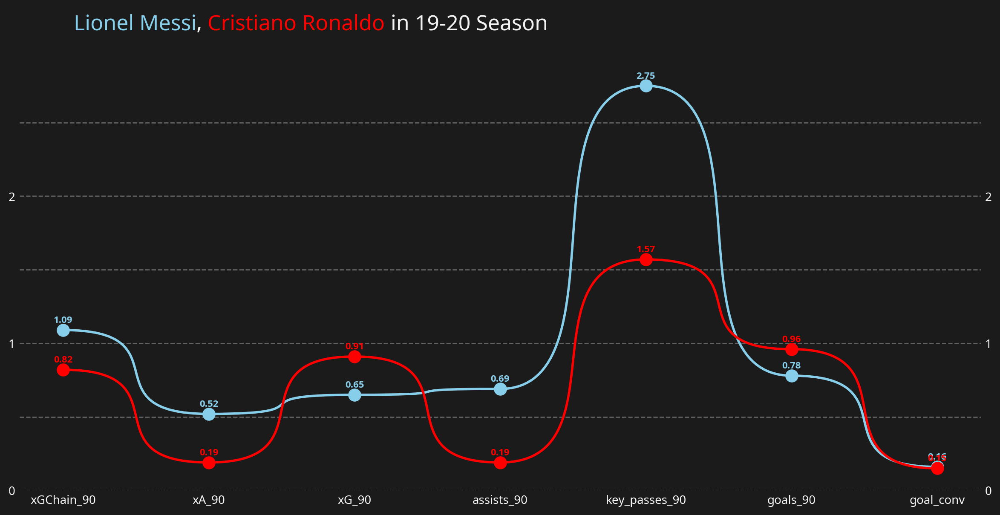

In [96]:
# 선수들의 주요 통계 지표 속성 정의
attributes = ["xGChain_90", "xA_90", "xG_90", "assists_90", "key_passes_90", "goals_90", "goal_conv"]

# 선수 데이터를 사용한 속성값 (df_filtered에서 컬럼명을 일치시킴)
player_dict = {
    "Lionel Messi": df_filtered[df_filtered["player_name"] == "Lionel Messi"][attributes].values.flatten(),
    "Cristiano Ronaldo": df_filtered[df_filtered["player_name"] == "Cristiano Ronaldo"][attributes].values.flatten(),
}

# 두 선수에 대한 하이라이트 색상 지정
highlight_dict = {
    "Lionel Messi": "skyblue",
    "Cristiano Ronaldo": "red"
}

# Bumpy 차트 초기화
bumpy = Bumpy(
    rotate_xticks=0, ticklabel_size=23, label_size=28,
    show_right=True, alignment_yvalue=0.15, alignment_xvalue=0.06
)

# Bumpy 차트 플로팅
fig, ax = bumpy.plot(
    x_list=attributes,
    y_list=np.linspace(0, 2, 3).astype(int),  # y축을 0에서 6까지 표시
    values=player_dict,
    secondary_alpha=0.05,
    highlight_dict=highlight_dict,
    figsize=(12, 6),
    # ylim=(0, 6),  # y축 범위 0에서 6으로 설정
    upside_down=True
)

# 각 데이터 포인트에 값을 표시
for player, color in highlight_dict.items():
    for idx, value in enumerate(player_dict[player]):
        ax.annotate(
            round(value, 2), 
            (idx, value+1.05), 
            color=color,
            ha='center',
            fontsize=8,
            fontweight='bold'
        )

# x축과 y축 글씨 크기 조정
ax.set_xticklabels(attributes, fontsize=10)  # x축 글씨 크기
ax.set_yticklabels(np.linspace(0, 2, 3).astype(int), fontsize=10)  # y축 글씨 크기

# y축 0.1 간격의 그리드 추가
ax.yaxis.set_major_locator(MultipleLocator(0.5))
ax.grid(which='major', axis='y', linestyle='--', color='gray', alpha=0.7)

# 제목 및 강조
TITLE = "<Lionel Messi>, <Cristiano Ronaldo> in 19-20 Season"
fig_text(
    0.095, 0.98, TITLE, color="#F2F2F2",
    highlight_textprops=[{"color": 'skyblue'}, {"color": 'red'}],
    size=18, fig=fig
)

# 여백 조정 및 출력
plt.tight_layout(pad=0.5)
plt.show()


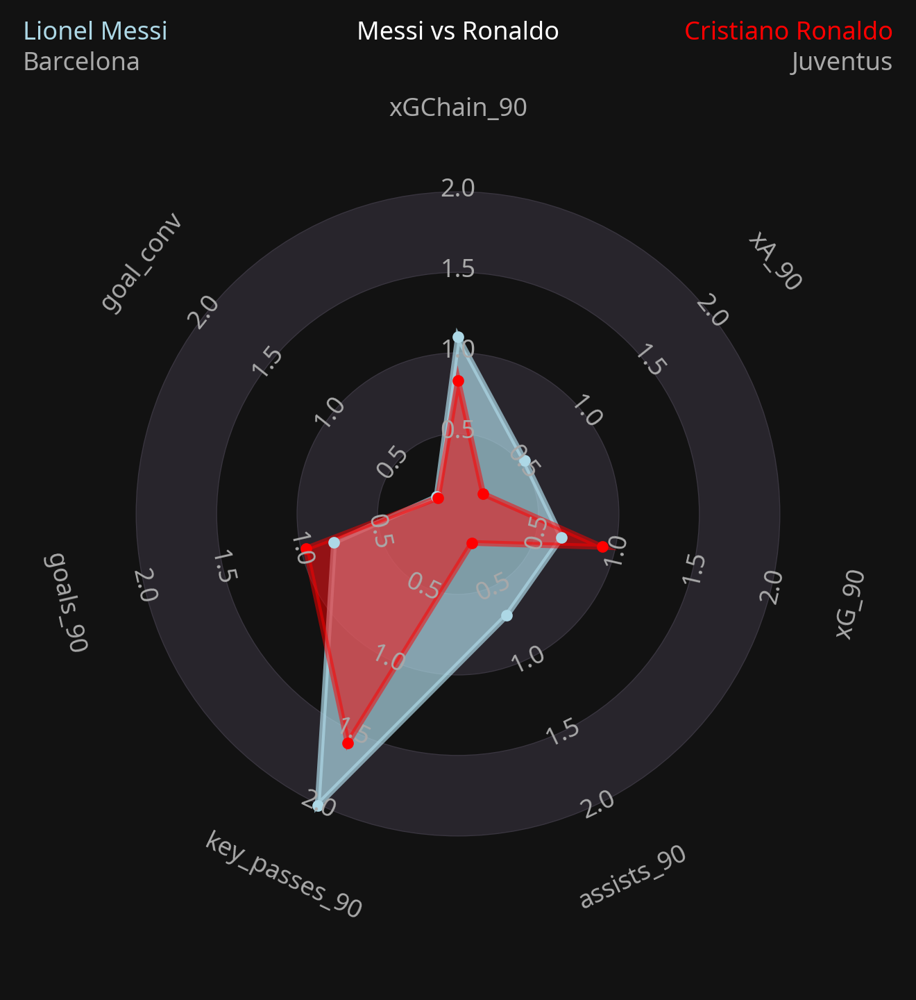

In [97]:
# Radar 차트도 그려본다

# Radar 설정 
min_range = [0] * len(attributes)
max_range = [2] * len(attributes)

# Radar 차트 초기화
radar = Radar(
    params=attributes,
    num_rings=4,
    ring_width=1,
    center_circle_radius=0.02,
    min_range=min_range,
    max_range=max_range
)

# mplsoccer 라이브러리의 grid 사용해서 figure 설정
fig, axs = grid(figheight=8, grid_height=0.8, title_height=0.05, endnote_height=0.025,
                title_space=0, endnote_space=0, grid_key='radar', axis=False)

# Radar 차트 그리기
radar.setup_axis(ax=axs['radar'], facecolor='None')
rings_inner = radar.draw_circles(ax=axs['radar'], facecolor='#28252c', edgecolor='#39353f', lw=0.5)
radar1, vertices1 = radar.draw_radar_solid(player_dict["Lionel Messi"], ax=axs['radar'],
                                           kwargs={'facecolor': 'lightblue',
                                                   'alpha': 0.7,
                                                   'edgecolor': 'lightblue',
                                                   'lw': 3})

radar2, vertices2 = radar.draw_radar_solid(player_dict["Cristiano Ronaldo"], ax=axs['radar'],
                                           kwargs={'facecolor': 'red',
                                                   'alpha': 0.5,
                                                   'edgecolor': 'red',
                                                   'lw': 3})

axs['radar'].scatter(vertices1[:, 0], vertices1[:, 1],
           c='lightblue', edgecolors='lightblue', marker='o', s=25, zorder=3)
axs['radar'].scatter(vertices2[:, 0], vertices2[:, 1],
           c='red', edgecolors='red', marker='o', s=25, zorder=3)

range_labels = radar.draw_range_labels(ax=axs['radar'], fontsize=13, color='darkgrey')
param_labels = radar.draw_param_labels(ax=axs['radar'], fontsize=13, color='darkgrey')

title1_text = axs['title'].text(0.01, 0.65, 'Lionel Messi', fontsize=13,
                                ha='left', va='center', color='lightblue')
title2_text = axs['title'].text(0.01, 0.1, 'Barcelona', fontsize=13,                                
                                ha='left', va='center', color='darkgrey')
title3_text = axs['title'].text(0.99, 0.65, 'Cristiano Ronaldo', fontsize=13,                                
                                ha='right', va='center', color='red')
title4_text = axs['title'].text(0.99, 0.1, 'Juventus', fontsize=13,                                
                                ha='right', va='center', color='darkgrey')
title5_text = axs['title'].text(0.5, 0.65, 'Messi vs Ronaldo', fontsize=13,                                
                                ha='center', va='center', color='white')

fig.set_facecolor('#121212')

### 8-2. 23-24 시즌 몸값 가장 높은 선수
- Kylian Mbappé (180M 유로)
- Erling Haaland (180M 유로)
- Vinicius Junior (180M 유로)
- Jude Bellingham (180M 유로)

In [98]:
# 비교할 선수 선정 (Kylian Mbappé, Erling Haaland, Vinicius Junior, Jude Bellingham)
players_of_interest = ["Kylian Mbappé", "Erling Haaland", "Vinicius Junior", "Jude Bellingham"]
compare_season = "2023"
stats_to_compare = ["xGChain_90", "xA_90", "xG_90", "shots_90", "key_passes_90", "assists_90", "goals_90", "goal_conv"]

df_compare = df_copy[df_copy["start_season"]==compare_season]

# 데이터 필터링
df_filtered = df_compare[df_compare["player_name"].isin(players_of_interest)][["player_name"] + stats_to_compare]
df_filtered

,player_name,xGChain_90,xA_90,xG_90,shots_90,key_passes_90,assists_90,goals_90,goal_conv
6489,Erling Haaland,1.06,0.17,1.11,4.30,1.02,0.18,0.95,0.22
8868,Jude Bellingham,1.06,0.23,0.50,2.44,1.86,0.23,0.74,0.30
9058,Vinicius Junior,0.99,0.21,0.77,3.75,1.49,0.29,0.72,0.19
11254,Kylian Mbappé,1.14,0.25,0.89,5.00,1.67,0.29,1.12,0.22


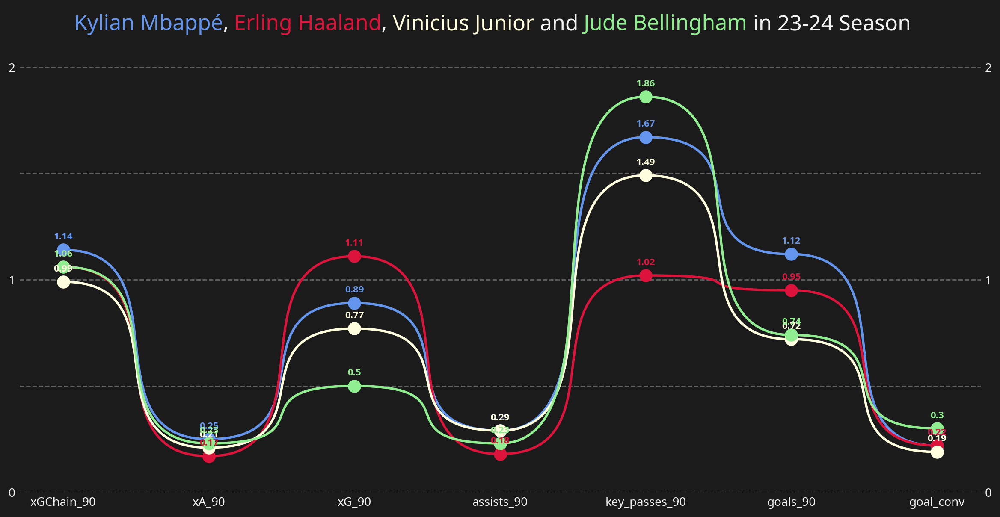

In [99]:
# 선수들의 주요 통계 지표 속성 정의
attributes = ["xGChain_90", "xA_90", "xG_90", "assists_90", "key_passes_90", "goals_90", "goal_conv"]

# 선수 데이터를 사용한 속성값 (df_filtered에서 컬럼명을 일치시킴)
player_dict = {
    "Kylian Mbappé": df_filtered[df_filtered["player_name"] == "Kylian Mbappé"][attributes].values.flatten(),
    "Erling Haaland": df_filtered[df_filtered["player_name"] == "Erling Haaland"][attributes].values.flatten(),
    "Vinicius Junior": df_filtered[df_filtered["player_name"] == "Vinicius Junior"][attributes].values.flatten(),
    "Jude Bellingham": df_filtered[df_filtered["player_name"] == "Jude Bellingham"][attributes].values.flatten()
}

# 두 선수에 대한 하이라이트 색상 지정
highlight_dict = {
    "Kylian Mbappé": "cornflowerblue",
    "Erling Haaland": "crimson",
    "Vinicius Junior": "lightyellow",
    "Jude Bellingham": "lightgreen"
}

# Bumpy 차트 초기화
bumpy = Bumpy(
    rotate_xticks=0, ticklabel_size=23, label_size=28,
    show_right=True, alignment_yvalue=0.15, alignment_xvalue=0.06
)

# Bumpy 차트 플로팅
fig, ax = bumpy.plot(
    x_list=attributes,
    y_list=np.linspace(0, 2, 3).astype(int),  # y축을 0에서 6까지 표시
    values=player_dict,
    secondary_alpha=0.05,
    highlight_dict=highlight_dict,
    figsize=(12, 6),
    # ylim=(0, 6),  # y축 범위 0에서 6으로 설정
    upside_down=True
)

# 각 데이터 포인트에 값을 표시
for player, color in highlight_dict.items():
    for idx, value in enumerate(player_dict[player]):
        ax.annotate(
            round(value, 2), 
            (idx, value+1.05), 
            color=color,
            ha='center',
            fontsize=8,
            fontweight='bold'
        )

# x축과 y축 글씨 크기 조정
ax.set_xticklabels(attributes, fontsize=10)  # x축 글씨 크기
ax.set_yticklabels(np.linspace(0, 2, 3).astype(int), fontsize=10)  # y축 글씨 크기

# y축 0.1 간격의 그리드 추가
ax.yaxis.set_major_locator(MultipleLocator(0.5))
ax.grid(which='major', axis='y', linestyle='--', color='gray', alpha=0.7)

# 제목 및 강조
TITLE = "<Kylian Mbappé>, <Erling Haaland>, <Vinicius Junior> and <Jude Bellingham> in 23-24 Season"
fig_text(
    0.095, 0.98, TITLE, color="#F2F2F2",
    highlight_textprops=[{"color": 'cornflowerblue'}, {"color": 'crimson'}, {"color": "lightyellow"}, {"color": "lightgreen"}],
    size=18, fig=fig
)

# 여백 조정 및 출력
plt.tight_layout(pad=0.5)
plt.show()


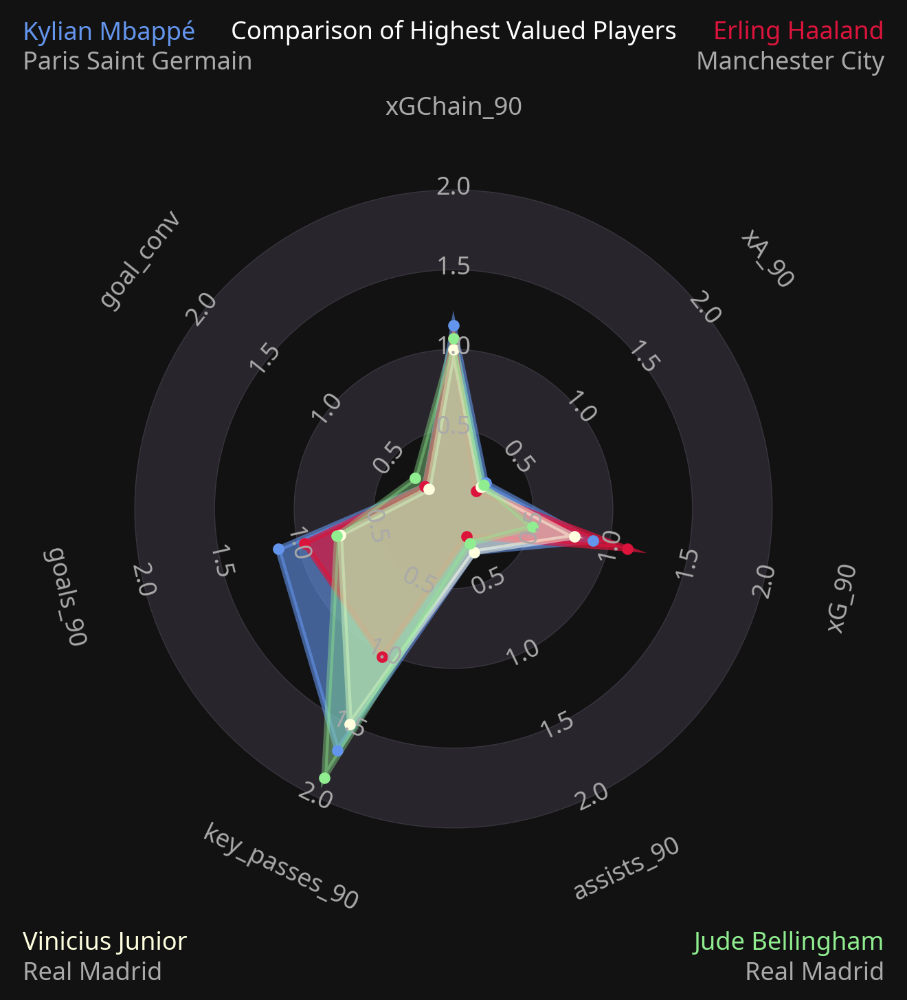

In [100]:
# Radar 차트도 그려본다

# Radar 설정 
min_range = [0] * len(attributes)
max_range = [2] * len(attributes)

# Radar 차트 초기화
radar = Radar(
    params=attributes,
    num_rings=4,
    ring_width=1,
    center_circle_radius=0.02,
    min_range=min_range,
    max_range=max_range
)

# creating the figure using the grid function from mplsoccer:
fig, axs = grid(figheight=8, grid_height=0.8, title_height=0.05, endnote_height=0.025,
                title_space=0, endnote_space=0, grid_key='radar', axis=False)

# plot the radar
radar.setup_axis(ax=axs['radar'], facecolor='None')
rings_inner = radar.draw_circles(ax=axs['radar'], facecolor='#28252c', edgecolor='#39353f', lw=0.5)
radar1, vertices1 = radar.draw_radar_solid(player_dict["Kylian Mbappé"], ax=axs['radar'],
                                           kwargs={'facecolor': 'cornflowerblue',
                                                   'alpha': 0.6,
                                                   'edgecolor': 'cornflowerblue',
                                                   'lw': 3})

radar2, vertices2 = radar.draw_radar_solid(player_dict["Erling Haaland"], ax=axs['radar'],
                                           kwargs={'facecolor': 'crimson',
                                                   'alpha': 0.7,
                                                   'edgecolor': 'crimson',
                                                   'lw': 3})

radar3, vertices3 = radar.draw_radar_solid(player_dict["Vinicius Junior"], ax=axs['radar'],
                                           kwargs={'facecolor': 'lightyellow',
                                                   'alpha': 0.5,
                                                   'edgecolor': 'lightyellow',
                                                   'lw': 3})
radar4, vertices4 = radar.draw_radar_solid(player_dict["Jude Bellingham"], ax=axs['radar'],
                                           kwargs={'facecolor': 'lightgreen',
                                                   'alpha': 0.4,
                                                   'edgecolor': 'lightgreen',
                                                   'lw': 3})

axs['radar'].scatter(vertices1[:, 0], vertices1[:, 1],
           c='cornflowerblue', edgecolors='cornflowerblue', marker='o', s=25, zorder=3)
axs['radar'].scatter(vertices2[:, 0], vertices2[:, 1],
           c='crimson', edgecolors='crimson', marker='o', s=25, zorder=3)
axs['radar'].scatter(vertices3[:, 0], vertices3[:, 1],
           c='lightyellow', edgecolors='lightyellow', marker='o', s=25, zorder=3)
axs['radar'].scatter(vertices4[:, 0], vertices4[:, 1],
           c='lightgreen', edgecolors='lightgreen', marker='o', s=25, zorder=3)

# axs['radar'].scatter(vertices1[:, 0], vertices1[:, 1],
#            c='#aa65b2', edgecolors='#502a54', marker='o', s=150, zorder=2)
# axs['radar'].scatter(vertices2[:, 0], vertices2[:, 1],
#            c='#66d8ba', edgecolors='#216352', marker='o', s=150, zorder=2)
# axs['radar'].scatter(vertices3[:, 0], vertices3[:, 1],
#            c='#697cd4', edgecolors='#222b54', marker='o', s=150, zorder=2)

range_labels = radar.draw_range_labels(ax=axs['radar'], fontsize=13, color='darkgrey')
param_labels = radar.draw_param_labels(ax=axs['radar'], fontsize=13, color='darkgrey')

title1_text = axs['title'].text(0.01, 0.65, 'Kylian Mbappé', fontsize=13,
                                ha='left', va='center', color='cornflowerblue')
title2_text = axs['title'].text(0.01, 0.1, 'Paris Saint Germain', fontsize=13,                                
                                ha='left', va='center', color='darkgrey')
title3_text = axs['title'].text(0.99, 0.65, 'Erling Haaland', fontsize=13,                                
                                ha='right', va='center', color='crimson')
title4_text = axs['title'].text(0.99, 0.1, 'Manchester City', fontsize=13,                                
                                ha='right', va='center', color='darkgrey')
title1_text = axs['endnote'].text(0.01, 1.2, 'Vinicius Junior', fontsize=13,
                                ha='left', va='center', color='lightyellow')
title2_text = axs['endnote'].text(0.01, 0.1, 'Real Madrid', fontsize=13,                                
                                ha='left', va='center', color='darkgrey')
title3_text = axs['endnote'].text(0.99, 1.2, 'Jude Bellingham', fontsize=13,                                
                                ha='right', va='center', color='lightgreen')
title4_text = axs['endnote'].text(0.99, 0.1, 'Real Madrid', fontsize=13,                                
                                ha='right', va='center', color='darkgrey')
title5_text = axs['title'].text(0.5, 0.65, 'Comparison of Highest Valued Players', fontsize=13,                                
                                ha='center', va='center', color='white')


fig.set_facecolor('#121212')

<!-- ## 9. 가설 검정 -->

In [101]:
df_copy[df_copy["player_name"]=="Jude Bellingham"]

,player_name,start_season,yellow_cards,red_cards,goals,assists,minutes_played,competition_code,date_of_birth,position,team_title,market_value_per_season,country,foot,height_in_cm,xG,xA,shots,key_passes,xGChain,xGBuildup,age,aggression,90s,goals_90,assists_90,aggression_90,xG_90,xA_90,shots_90,key_passes_90,xGChain_90,xGBuildup_90,xG_per_shot,goal_conv,xG_vs_goal,position_category
639,Jude Bellingham,2020,6.0,0.0,1.0,3.0,1702.0,bundesliga,2003-06-29,Attacking Midfield,Borussia Dortmund,55000000.0,England,right,186.0,2.565568,3.540683,33.0,14.0,12.289207,7.932996,18,1.8,18.9,0.05,0.16,0.10,0.14,0.19,1.75,0.74,0.65,0.42,0.08,0.03,1.565568,Midfielder
1101,Jude Bellingham,2021,9.0,0.0,3.0,8.0,2795.0,bundesliga,2003-06-29,Attacking Midfield,Borussia Dortmund,80000000.0,England,right,186.0,4.905647,5.934830,44.0,37.0,20.299170,14.016300,19,2.7,31.1,0.10,0.26,0.09,0.16,0.19,1.41,1.19,0.65,0.45,0.11,0.07,1.905647,Midfielder
1549,Jude Bellingham,2022,8.0,0.0,8.0,5.0,2692.0,bundesliga,2003-06-29,Attacking Midfield,Borussia Dortmund,120000000.0,England,right,186.0,8.504038,4.233295,65.0,34.0,24.581587,17.165962,20,2.4,29.9,0.27,0.17,0.08,0.28,0.14,2.17,1.14,0.82,0.57,0.13,0.12,0.504038,Midfielder
8868,Jude Bellingham,2023,5.0,1.0,19.0,6.0,2324.0,laliga,2003-06-29,Attacking Midfield,Real Madrid,180000000.0,England,right,186.0,12.974516,5.894493,63.0,48.0,27.422402,15.474830,21,2.2,25.8,0.74,0.23,0.09,0.50,0.23,2.44,1.86,1.06,0.60,0.21,0.30,-6.025484,Midfielder


## 9. 가설 검정

### 9-1. 포지션별로 몸값의 평균은 같지 않을 것이다
- $H_0: $ 포지션별로 몸값의 평균은 같을 것이다.
- $H_1: $ 포지션별로 몸값의 평균은 같지 않을 것이다.

In [102]:
df_copy["log_market_value_per_season"] = np.log1p(df_copy["market_value_per_season"])

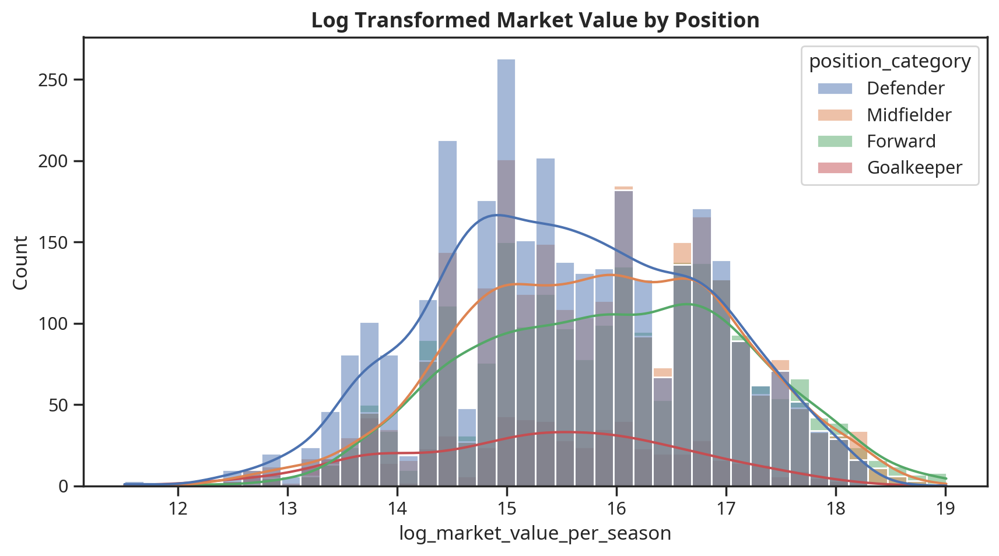

In [103]:
plt.figure(figsize=(10, 5))
sns.histplot(data=df_copy, x="log_market_value_per_season", kde=True, hue="position_category")
plt.title("Log Transformed Market Value by Position", fontsize=13, fontweight="bold")
# plt.legend()
plt.show()

In [104]:
goalkeeper = df_copy[df_copy["position_category"]=="Goalkeeper"]
defender = df_copy[df_copy["position_category"]=="Defender"]
midfielder = df_copy[df_copy["position_category"]=="Midfielder"]
forward = df_copy[df_copy["position_category"]=="Forward"]

In [105]:
print("골키퍼 인원 수:", goalkeeper.shape[0])
print("수비수 인원 수:", defender.shape[0])
print("미드필더 인원 수:", midfielder.shape[0])
print("공격수 인원 수:", forward.shape[0])

골키퍼 인원 수: 620
수비수 인원 수: 3151
미드필더 인원 수: 2536
공격수 인원 수: 2201


In [106]:
print("골키퍼 평균 몸값:", round(np.mean(goalkeeper["log_market_value_per_season"]), 2))
print("수비수 평균 몸값:", round(np.mean(defender["log_market_value_per_season"]), 2))
print("미드필더 평균 몸값:", round(np.mean(midfielder["log_market_value_per_season"]), 2))
print("공격수 평균 몸값:", round(np.mean(forward["log_market_value_per_season"]), 2))

골키퍼 평균 몸값: 15.31
수비수 평균 몸값: 15.54
미드필더 평균 몸값: 15.83
공격수 평균 몸값: 15.96


#### 9-1-1. 정규성 검정
- 정규성을 만족하지 않는다

In [107]:
# position_category에 따라 positions 리스트 생성
positions = df_copy['position_category'].unique()
ad_results = {}

# Anderson-Darling Test 진행
# 
for position in positions:
    result = stats.anderson(df_copy[df_copy['position_category'] == position]['log_market_value_per_season'], dist='norm')
    ad_results[position] = {
        'A-D Test Statistic': result.statistic,
        'Critical Values': result.critical_values,
        'Significance Level': result.significance_level
    }

# A-D test Statistic가 Critical Value보다 작은지 확인해본다
ad_df = pd.DataFrame.from_dict(ad_results, orient='index')
ad_df

# 모든 그룹에서 임계값보다 높다 → 정규성을 만족하지 않는다.

,A-D Test Statistic,Critical Values,Significance Level
Defender,7.109514,"[0.575, 0.655, 0.786, 0.917, 1.091]","[15.0, 10.0, 5.0, 2.5, 1.0]"
Midfielder,4.749870,"[0.575, 0.655, 0.786, 0.917, 1.09]","[15.0, 10.0, 5.0, 2.5, 1.0]"
Forward,5.963605,"[0.575, 0.655, 0.786, 0.916, 1.09]","[15.0, 10.0, 5.0, 2.5, 1.0]"
Goalkeeper,1.719596,"[0.572, 0.652, 0.782, 0.912, 1.085]","[15.0, 10.0, 5.0, 2.5, 1.0]"


#### 9-1-2. 등분산성 검정
- Levene's Test는 데이터가 정규분포를 따르지 않아도 사용할 수 있다
    - 데이터의 정규성 여부에 덜 민감하다.

In [108]:

# Levene's test를 사용하여 등분산성 검정
stat, p_value = stats.levene(
    df_copy[df_copy['position_category'] == 'Defender']['log_market_value_per_season'],
    df_copy[df_copy['position_category'] == 'Midfielder']['log_market_value_per_season'],
    df_copy[df_copy['position_category'] == 'Forward']['log_market_value_per_season'],
    df_copy[df_copy['position_category'] == 'Goalkeeper']['log_market_value_per_season'],
    center='median'
)

log_levene_result = {"Levene Test Result" : {'Levene Test Statistic': stat, 'p-value': p_value}}
pd.DataFrame.from_dict(log_levene_result, orient='index')
# p-value: 0.208
# p-value > 0.05 (등분산성 가정 만족: 그룹 간의 분산이 유의미하게 다르지 않다)

,Levene Test Statistic,p-value
Levene Test Result,1.539563,0.202028


#### 9-1-3. 비모수적 검정
- 등분산성은 만족하지만 정규성은 만족하지 않는다 → 비모수 검정
- Kruskal-Wallis 검정 사용
    - 정규성을 가정하지 않고, 데이터의 분포가 서로 다른 상황에서 그룹 간 차이를 검정할 수 있기 때문
    - $p-value < 0.05:$ 데이터의 그룹별 중앙값이 유의미하게 차이 난다.
- Permutation ANOVA
    - 정규성을 가정하지 않으면서도 그룹 간 평균값 차이를 검정할 수 있다
    - $p-value < 0.05:$ 데이터의 그룹별 평균값이 유의미하게 차이 난다.

In [109]:
# 포지션 그룹 간 독립 표본에 대한 Kruskal-Wallis 검정 (비모수적 검정)
kruskal_result = stats.kruskal(
    defender['log_market_value_per_season'],
    midfielder['log_market_value_per_season'],
    forward['log_market_value_per_season'],
    goalkeeper['log_market_value_per_season']
)

kruskal_result_dict = {"Kruskal-Wallis Result" : {'Kruskal-Wallis Statistic': kruskal_result.statistic, 'p-value': kruskal_result.pvalue}}
pd.DataFrame.from_dict(kruskal_result_dict, orient='index')

# Kruskal-Wallis 검정 결과, position_category에 따라 log_market_value_per_season의 중앙값이 통계적으로 유의미하게 차이난다

,Kruskal-Wallis Statistic,p-value
Kruskal-Wallis Result,202.879411,1.006885e-43


In [110]:
# Permutation ANOVA를 사용하여 여러 그룹 간 평균 차이를 비교하는 함수
# 각 그룹 간 평균 차이를 비교하는 비모수적 방법으로, n_permutations는 순열의 반복 횟수 의미

def permutation_anova_means(*groups, n_permutations=10000):
    # 모든 그룹의 데이터를 하나의 배열로 결합
    combined_data = np.concatenate(groups)
    
    # 각 그룹의 평균을 계산
    group_means = [np.mean(group) for group in groups]
    
    # 전체 데이터의 평균 계산
    overall_mean = np.mean(combined_data)
    
    # 관찰된 평균 차이를 계산 (각 그룹의 평균과 전체 평균 간의 차이 제곱의 합)
    observed_diff = np.sum([(mean - overall_mean)**2 for mean in group_means])
    
    # 순열 검정을 통해 평균 차이 검정
    count = 0
    for _ in range(n_permutations):
        # 데이터 무작위 재배열 (순열)
        permuted_data = np.random.permutation(combined_data)
        
        # 무작위 재배열된 데이터에서 각 그룹의 평균 계산
        permuted_means = [np.mean(permuted_data[i:i + len(group)]) for i, group in enumerate(groups)]
        
        # 재배열된 평균 차이를 계산
        permuted_diff = np.sum([(mean - np.mean(permuted_data))**2 for mean in permuted_means])
        
        # 관찰된 평균 차이보다 큰 경우 카운트
        if permuted_diff >= observed_diff:
            count += 1
    
    # p-value 계산 (순열 결과 중 관찰된 차이보다 큰 경우의 비율)
    p_value = count / n_permutations
    return p_value

# 평균값 차이를 검정하는 순열 검정 수행
permutation_p_value_means = permutation_anova_means(defender["log_market_value_per_season"], 
                                                    midfielder["log_market_value_per_season"], 
                                                    forward["log_market_value_per_season"], 
                                                    goalkeeper["log_market_value_per_season"])
print("Permutation ANOVA:", permutation_p_value_means)

# p-value < 0.05: Permutation ANOVA 결과, position_category에 따라 log_market_value_per_season의 평균에 유의미한 차이가 존재한다

Permutation ANOVA: 0.0


### 9-2. 리그에 따라 몸값의 평균은 같지 않을 것이다
- $H_0: $ 리그에 따라 몸값의 평균은 같을 것이다.
- $H_1: $ 리그에 따라 몸값의 평균은 같지 않을 것이다.

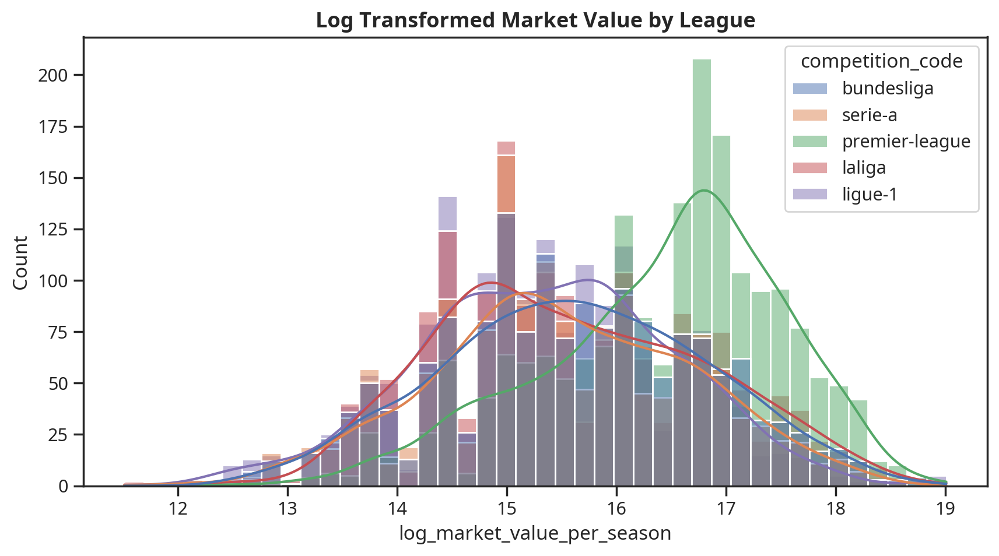

In [111]:
# 리그별 로그 변환한 몸값 시각화
plt.figure(figsize=(10, 5))
sns.histplot(data=df_copy, x="log_market_value_per_season", kde=True, hue="competition_code")
plt.title("Log Transformed Market Value by League", fontsize=13, fontweight="bold")
# plt.legend()
plt.show()

In [112]:
df_copy["competition_code"].unique()

array(['bundesliga', 'serie-a', 'premier-league', 'laliga', 'ligue-1'],
      dtype=object)

In [113]:
bundes = df_copy[df_copy["competition_code"]=="bundesliga"]
serie = df_copy[df_copy["competition_code"]=="serie-a"]
pl = df_copy[df_copy["competition_code"]=="premier-league"]
lfp = df_copy[df_copy["competition_code"]=="laliga"]
l1 = df_copy[df_copy["competition_code"]=="ligue-1"]

In [114]:
print("분데스리가 평균 몸값:", round(np.mean(bundes["log_market_value_per_season"]), 2))
print("세리에-A 평균 몸값:", round(np.mean(serie["log_market_value_per_season"]), 2))
print("프리미어 리그 평균 몸값:", round(np.mean(pl["log_market_value_per_season"]), 2))
print("라 리가 평균 몸값:", round(np.mean(lfp["log_market_value_per_season"]), 2))
print("리그 앙 평균 몸값:", round(np.mean(l1["log_market_value_per_season"]), 2))

분데스리가 평균 몸값: 15.61
세리에-A 평균 몸값: 15.51
프리미어 리그 평균 몸값: 16.43
라 리가 평균 몸값: 15.58
리그 앙 평균 몸값: 15.36


#### 9-2-1. 정규성 검정
- 정규성을 만족하지 않는다

In [115]:
# competition_code에 따라 leagues 리스트 생성
leagues = df_copy['competition_code'].unique()
ad_results = {}

# Anderson-Darling Test 진행
# 
for league in leagues:
    result = stats.anderson(df_copy[df_copy['competition_code'] == league]['log_market_value_per_season'], dist='norm')
    ad_results[league] = {
        'A-D Test Statistic': result.statistic,
        'Critical Values': result.critical_values,
        'Significance Level': result.significance_level
    }


ad_df = pd.DataFrame.from_dict(ad_results, orient='index')
ad_df

# A-D test Statistic가 Critical Value보다 작은지 확인해본다
# 모든 그룹에서 임계값보다 높다 → 정규성을 만족하지 않는다.

,A-D Test Statistic,Critical Values,Significance Level
bundesliga,1.442100,"[0.575, 0.654, 0.785, 0.916, 1.089]","[15.0, 10.0, 5.0, 2.5, 1.0]"
serie-a,1.990528,"[0.574, 0.654, 0.785, 0.916, 1.089]","[15.0, 10.0, 5.0, 2.5, 1.0]"
premier-league,16.283162,"[0.575, 0.655, 0.785, 0.916, 1.09]","[15.0, 10.0, 5.0, 2.5, 1.0]"
laliga,8.247777,"[0.575, 0.654, 0.785, 0.916, 1.089]","[15.0, 10.0, 5.0, 2.5, 1.0]"
ligue-1,1.616445,"[0.575, 0.654, 0.785, 0.916, 1.089]","[15.0, 10.0, 5.0, 2.5, 1.0]"


#### 9-2-2. 등분산성 검정
- 등분산성을 만족하지 못한다

In [116]:
# Levene's test를 사용하여 등분산성 검정
stat, p_value = stats.levene(
    df_copy[df_copy['competition_code'] == 'bundesliga']['log_market_value_per_season'],
    df_copy[df_copy['competition_code'] == 'serie-a']['log_market_value_per_season'],
    df_copy[df_copy['competition_code'] == 'premier-league']['log_market_value_per_season'],
    df_copy[df_copy['competition_code'] == 'laliga']['log_market_value_per_season'],
    df_copy[df_copy['competition_code'] == 'ligue-1']['log_market_value_per_season'],
    center='median'
)

log_levene_result = {"Levene Test Result" : {'Levene Test Statistic': stat, 'p-value': p_value}}
pd.DataFrame.from_dict(log_levene_result, orient='index')

# p-value: 1.130207e-09
# p-value < 0.05 (등분산성 가정 만족 못한다: 그룹 간의 분산이 유의미하게 다르다)

,Levene Test Statistic,p-value
Levene Test Result,11.938098,1.130207e-09


#### 9-2-3. 비모수적 검정
- 정규성, 등분산성 만족하지 않는다 → 비모수 검정
- Kruskal-Wallis 검정 사용
    - 정규성을 가정하지 않고, 데이터의 분포가 서로 다른 상황에서 그룹 간 차이를 검정할 수 있기 때문
    - $p-value < 0.05:$ 데이터의 그룹별 중앙값이 유의미하게 차이 난다.
- Permutation ANOVA
    - 정규성을 가정하지 않으면서도 그룹 간 평균값 차이를 검정할 수 있다
    - $p-value < 0.05:$ 데이터의 그룹별 평균값이 유의미하게 차이 난다.

In [117]:
# 리그 그룹 간 독립 표본에 대한 Kruskal-Wallis 검정 (비모수적 검정)
kruskal_result = stats.kruskal(
    bundes['log_market_value_per_season'],
    serie['log_market_value_per_season'],
    pl['log_market_value_per_season'],
    lfp['log_market_value_per_season'],
    l1['log_market_value_per_season']
)

kruskal_result_dict = {"Kruskal-Wallis Result" : {'Kruskal-Wallis Statistic': kruskal_result.statistic, 'p-value': kruskal_result.pvalue}}
pd.DataFrame.from_dict(kruskal_result_dict, orient='index')

# p-value < 0.05: Kruskal-Wallis 검정 결과, competition_code 따라 log_market_value_per_season의 중앙값이 통계적으로 유의미하게 차이난다

,Kruskal-Wallis Statistic,p-value
Kruskal-Wallis Result,878.215964,8.737470e-189


In [118]:
# Permutation ANOVA를 사용하여 여러 그룹 간 평균 차이를 비교하는 함수
# 각 그룹 간 평균 차이를 비교하는 비모수적 방법으로, n_permutations는 순열의 반복 횟수 의미
def permutation_anova_means(*groups, n_permutations=10000):
    # 모든 그룹의 데이터를 하나의 배열로 결합
    combined_data = np.concatenate(groups)
    
    # 각 그룹의 평균을 계산
    group_means = [np.mean(group) for group in groups]
    
    # 전체 데이터의 평균 계산
    overall_mean = np.mean(combined_data)
    
    # 관찰된 평균 차이를 계산 (각 그룹의 평균과 전체 평균 간의 차이 제곱의 합)
    observed_diff = np.sum([(mean - overall_mean)**2 for mean in group_means])
    
    # 순열 검정을 통해 평균 차이 검정
    count = 0
    for _ in range(n_permutations):
        # 데이터 무작위 재배열 (순열)
        permuted_data = np.random.permutation(combined_data)
        
        # 무작위 재배열된 데이터에서 각 그룹의 평균 계산
        permuted_means = [np.mean(permuted_data[i:i + len(group)]) for i, group in enumerate(groups)]
        
        # 재배열된 평균 차이를 계산
        permuted_diff = np.sum([(mean - np.mean(permuted_data))**2 for mean in permuted_means])
        
        # 관찰된 평균 차이보다 큰 경우 카운트
        if permuted_diff >= observed_diff:
            count += 1
    
    # p-value 계산 (순열 결과 중 관찰된 차이보다 큰 경우의 비율)
    p_value = count / n_permutations
    return p_value

# 평균값 차이를 검정하는 순열 검정 수행
permutation_p_value_means = permutation_anova_means(bundes['log_market_value_per_season'],
                                                    serie['log_market_value_per_season'],
                                                    pl['log_market_value_per_season'],
                                                    lfp['log_market_value_per_season'],
                                                    l1['log_market_value_per_season']
                                                    )
print("Permutation ANOVA:", permutation_p_value_means)

# p-value < 0.05: Permutation ANOVA 결과, position_category에 따라 log_market_value_per_season의 평균에 유의미한 차이가 존재한다

Permutation ANOVA: 0.0


### 9-3. 프리미어 리그를 제외한 나머지 리그들의 몸값의 평균은 같지 않을 것이다
- $H_0: $ 프리미어 리그를 제외한 나머지 리그들의 몸값의 평균은 같을 것이다.
- $H_1: $ 프리미어 리그를 제외한 나머지 리그들의 몸값의 평균은 같지 않을 것이다.

#### 9-3-1. 정규성 검정
- 정규성 만족하지 않는다

In [119]:
# competition_code에 따라 leagues 리스트 생성 (프리미어 리그 제외)
no_pl_leagues = ["bundesliga", "laliga", "serie-a", "ligue-1"]
ad_results = {}

# Anderson-Darling Test 진행
for league in no_pl_leagues:
    result = stats.anderson(df_copy[df_copy['competition_code'] == league]['log_market_value_per_season'], dist='norm')
    ad_results[league] = {
        'A-D Test Statistic': result.statistic,
        'Critical Values': result.critical_values,
        'Significance Level': result.significance_level
    }

ad_df = pd.DataFrame.from_dict(ad_results, orient='index')
ad_df

# A-D test Statistic가 Critical Value보다 작은지 확인해본다
# 모든 그룹에서 임계값보다 높다 → 정규성을 만족하지 않는다.

,A-D Test Statistic,Critical Values,Significance Level
bundesliga,1.442100,"[0.575, 0.654, 0.785, 0.916, 1.089]","[15.0, 10.0, 5.0, 2.5, 1.0]"
laliga,8.247777,"[0.575, 0.654, 0.785, 0.916, 1.089]","[15.0, 10.0, 5.0, 2.5, 1.0]"
serie-a,1.990528,"[0.574, 0.654, 0.785, 0.916, 1.089]","[15.0, 10.0, 5.0, 2.5, 1.0]"
ligue-1,1.616445,"[0.575, 0.654, 0.785, 0.916, 1.089]","[15.0, 10.0, 5.0, 2.5, 1.0]"


#### 9-3-2. 등분산성 검정

In [120]:
# Levene's test를 사용하여 등분산성 검정
stat, p_value = stats.levene(
    df_copy[df_copy['competition_code'] == 'bundesliga']['log_market_value_per_season'],
    df_copy[df_copy['competition_code'] == 'serie-a']['log_market_value_per_season'],
    # df_copy[df_copy['competition_code'] == 'premier-league']['log_market_value_per_season'],
    df_copy[df_copy['competition_code'] == 'laliga']['log_market_value_per_season'],
    df_copy[df_copy['competition_code'] == 'ligue-1']['log_market_value_per_season'],
    center='median'
)

log_levene_result = {"Levene Test Result" : {'Levene Test Statistic': stat, 'p-value': p_value}}
pd.DataFrame.from_dict(log_levene_result, orient='index')

# p-value: 0.005302
# p-value < 0.05 (등분산성 가정 만족 못한다: 그룹 간의 분산이 유의미하게 다르다)

,Levene Test Statistic,p-value
Levene Test Result,4.241217,0.005302


#### 9-3-3. 비모수적 검정
- 정규성, 등분산성 만족하지 않는다 → 비모수 검정
- Kruskal-Wallis 검정 사용
    - 정규성을 가정하지 않고, 데이터의 분포가 서로 다른 상황에서 그룹 간 차이를 검정할 수 있기 때문
    - $p-value < 0.05:$ 데이터의 그룹별 중앙값이 유의미하게 차이 난다.
- Permutation ANOVA
    - 정규성을 가정하지 않으면서도 그룹 간 평균값 차이를 검정할 수 있다
    - $p-value < 0.05:$ 데이터의 그룹별 평균값이 유의미하게 차이 난다.

In [121]:
# 리그 그룹 간 독립 표본에 대한 Kruskal-Wallis 검정 (비모수적 검정)
kruskal_result = stats.kruskal(
    bundes['log_market_value_per_season'],
    serie['log_market_value_per_season'],
    # pl['log_market_value_per_season'],
    lfp['log_market_value_per_season'],
    l1['log_market_value_per_season']
)

kruskal_result_dict = {"Kruskal-Wallis Result" : {'Kruskal-Wallis Statistic': kruskal_result.statistic, 'p-value': kruskal_result.pvalue}}
pd.DataFrame.from_dict(kruskal_result_dict, orient='index')

# p-value < 0.05: Kruskal-Wallis 결과, 프리미어 리그를 제외한 competition_code 따라 log_market_value_per_season의 중앙값에 유의미한 차이가 존재한다

,Kruskal-Wallis Statistic,p-value
Kruskal-Wallis Result,36.008412,7.457774e-08


In [122]:
# Permutation ANOVA를 사용하여 여러 그룹 간 평균 차이를 비교하는 함수
# 각 그룹 간 평균 차이를 비교하는 비모수적 방법으로, n_permutations는 순열의 반복 횟수 의미
def permutation_anova_means(*groups, n_permutations=10000):
    # 모든 그룹의 데이터를 하나의 배열로 결합
    combined_data = np.concatenate(groups)
    
    # 각 그룹의 평균을 계산
    group_means = [np.mean(group) for group in groups]
    
    # 전체 데이터의 평균 계산
    overall_mean = np.mean(combined_data)
    
    # 관찰된 평균 차이를 계산 (각 그룹의 평균과 전체 평균 간의 차이 제곱의 합)
    observed_diff = np.sum([(mean - overall_mean)**2 for mean in group_means])
    
    # 순열 검정을 통해 평균 차이 검정
    count = 0
    for _ in range(n_permutations):
        # 데이터 무작위 재배열 (순열)
        permuted_data = np.random.permutation(combined_data)
        
        # 무작위 재배열된 데이터에서 각 그룹의 평균 계산
        permuted_means = [np.mean(permuted_data[i:i + len(group)]) for i, group in enumerate(groups)]
        
        # 재배열된 평균 차이를 계산
        permuted_diff = np.sum([(mean - np.mean(permuted_data))**2 for mean in permuted_means])
        
        # 관찰된 평균 차이보다 큰 경우 카운트
        if permuted_diff >= observed_diff:
            count += 1
    
    # p-value 계산 (순열 결과 중 관찰된 차이보다 큰 경우의 비율)
    p_value = count / n_permutations
    return p_value

# 평균값 차이를 검정하는 순열 검정 수행
permutation_p_value_means = permutation_anova_means(bundes['log_market_value_per_season'],
                                                    serie['log_market_value_per_season'],
                                                    # pl['log_market_value_per_season'],
                                                    lfp['log_market_value_per_season'],
                                                    l1['log_market_value_per_season']
                                                    )
print("Permutation ANOVA:", permutation_p_value_means)

# p-value < 0.05: Permutation ANOVA 결과, 프리미어 리그를 제외한 competition_code 따라 log_market_value_per_season의 평균값에 유의미한 차이가 존재한다

Permutation ANOVA: 0.0


## 10. EDA 정리

- 데이터 특징
    - 다양한 컬럼에서 많은 이상치 존재
        - 그러나 축구라는 스포츠의 특성 상, 득점, 도움, 시장 가치 등 몇몇의 특출난 선수들의 스탯이 도드라지게 나타난다
    - 결론 : 이상치 따로 처리하지 않음

- 상관관계
    - 다중 공선성 체크
    - 상관관계 높은 컬럼들 존재 → 추후 머신러닝 모델링에 따라 추가 제거 고민

- 파생 변수 생성
    - `aggression`: (`yellow_cards` * 0.3) + (`red_cards` * 0.7)
    - `90s`: `minutes_played` / 90 (90분으로 환산했을 때 몇 경기 뛰었는지 확인)
    - `goals`, `assists`, `aggression`, `xG`, `xA`, `shots`, `key_passes`, `xGChain`, `xGBuildup`: `90s`로 나누어 90분당 기록을 확인
    - `xg_per_shot`: 슈팅 횟수 대비 xg
    - `goal_conv`: 슈팅 횟수 대비 득점 전환
    - `xG_vs_goal`: xg 대비 실제 득점 수

- 컬럼별 분석
    - `goals`, `assists`
        - 19세 ~ 37세 까지 분포가 많다
        - 나이별로 이상치 존재
        - 시각화 결과
            - 시즌별 (5년간) 득점, 어시스트 특화된 선수들이 대다수
            - 시즌에 따라 간혹, 득점, 어시스트 전부 다 많이 기록하는 선수들 존재한다 (Messi, Mbappe 등)
    - `market_value_per_season`
        - 나이별 몸값은 시즌에 따라 보통 비슷하게 나타난다
            - 젊을 수록 몸값이 높게 측정됨
            - outlier : 2023 시즌 17세 → Lamine Yamal (120M 유로)
        - 시즌 별 나이 및 포지션에 따른 몸값 확인
            - 모든 시즌, Centre-Forward가 가장 몸값이 높게 나타났다 (Kylian Mbappe, Erling Haaland)
            - 모든 시즌에 걸쳐 골키퍼 및 수비수 포지션이 낮은 몸값 형성
            - 30세가 넘어가면 최고 몸값이 줄어드는 경향을 보인다
            - 모든 시즌 (19-20 ~ 23-24), 가장 높은 평균 몸값을 기록한 포지션은 Second Striker
            - 공격수 포지션의 몸값이 대체적으로 가장 높고, 수비수와 골키퍼가 가장 낮다
                - 미드필더 포지션의 Right Midfield, Left Midfield는 다른 미드필더 포지션보다 유독 낮다
                - Right Midfield, Left Midfield는 Wing Back 포지션의 선수들도 포함되기 떄문
        - 몸값 `100M 유로` 넘는 선수들 (고가의 선수)만 따로 한번 더 시각화
            - `goals`, `assists`
                - 몸값 높은 선수들은 보통 득점이 많거나 어시스트가 많다
                    - 간혹 둘 다 높은 선수도 존재
                - 대다수 시즌에서, 프리미어 리그 소속 공격수와 미드필더들이 높은 득점과 어시스트 기록
                - 시즌에 따라 소속 선수의 몸값 합산이 가장 높은 리그가 다르다
                    - 19-20, 20-21 시즌: 프리미어 리그
                    - 21-22 시즌: 리그앙
                    - 22-23, 23-24 시즌: 라 리가
            - `goals` + `assists` 합산한 공격포인트 확인
                - 공격포인트 높은 선수가 비싸다
                - 하지만 비슷한 공격포인트를 기록해도 몸값이 차이나는 선수들 존재
                - 비슷한 몸값인데, 공격 포인트가 다른 선수도 있다
                - 주로 라 리가, 프리미어 리그 소속 선수가 많다
        - 포지션별 퍙균 몸값은 Second Striker가 가장 높다 (2위 Left Winger, 3위 Attacking Midfield)
            - 대부분의 Second Striker는 라 리가 소속
            - 다른 포지션들은 프리미어 리그가 대체로 많다
    - `age`
        - 시즌별 전체 선수, 몸값 20M 유로 넘는 선수, 몸값 100M 유로 넘는 선수 분포 비교 
            → 전체적으로 분포 비슷하나 100M 넘는 선수들은 나이가 어린 선수가 많다
        - 몸값 `100M 유로` 넘는 선수들 (고가의 선수)만 따로 한번 더 시각화
            - `age`, `goals` + `assists` 합산한 공격포인트
                - 시즌별로 나이에 따라 공격포인트가 증가하는 모습을 보임
                    - 23-24 시즌에 100M 넘는 선수 다수 분포
                - 주로 라 리가, 프리미어 리그 소속 선수가 대다수
                - 포지션에 따라 공격포인트가 적을 수도 있음 
                    - ex. Eduardo Camavinga : Central Midfield, Aurelien Tchouameni: Defensive Midfield	
            - `age`, `market_value_per_season`
                - 주로 21세 ~ 28세 선수들이 다수 포함
                    - Outlier : 1920 시즌 Messi        
- 선수 시각화 (Bumpy, Radar Chart)
    - 19-20 시즌 메시, 호날두 비교 (둘 다 가장 높은 시장 가치 기록한 시즌)
        - 메시가 goals_90, xG_90을 제외한 모든 지표에서 호날두 압도
    - 23-24 시즌 가장 높은 몸값 기록한 선수들 비교 (180M 유로)
        - Kylian Mbappe, Erling Haaland, Vinicius Junior, Jude Bellingham
        - 대체적으로 비슷한 Radar Chart 기록
            - Center-Forward인 Mbappe, Haaland이 높은 `goals_90`, `xG_90` 기록
            - Attacking Midfield인 Jude Bellingham은 매우 높은 `key_passes_90` 기록
- 통계적 가설 검정
    - 포지션별로 몸값의 평균은 같지 않을 것이다 → 대립가설 채택
    - 리그에 따라 몸값의 평균은 같지 않을 것이다 → 대립가설 채택
    - 프리미어 리그를 제외한 나머지 리그들의 몸값 평균은 같지 않을 것이다 → 대립가설 채택

### 10-1. EDA 거친 데이터셋 `csv`로 저장

In [123]:
# 상관관계 높은 컬럼 ("yellow_cards", "red_cards") 삭제한 데이터셋을 df_final.csv로 저장
df_copy.to_csv("data/df_final.csv", index=False)